In [464]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

In [465]:
#setting the seed -- we have ensured replicability multiple times, but this is being done for clarity of data
np.random.seed(seed=0)

# Data Preparation

In [466]:
custom_tickers = [
    "AAPL", "MSFT", "AMZN", "INTC", "ORCL", "CSCO",
    "AMGN", "GILD", "BIIB", "EBAY", 
    "ADBE", "NVDA", "ISRG", "MNST", "REGN", "ILMN", 
    "ORLY", "MAR", "ROST", "ADI", "ADP", "CTSH", "EA", "FAST", "INCY", "INTU",
    "JBHT", "MAT", "MCHP", "NTAP", "PCAR", "TXN", 
    "SIRI", "VRTX", "LRCX", "KLAC", "CSX", "VOD", "PAYX", 
    "REGN", "SHPG", "SRCL", "TSCO", "VRSN", "WBA", "XRAY"
    #"NFLX", "MDLZ" #IPO during period_1 so omit
]
study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  weekly_df['close'].fillna(method='ffill', inplace=True)
/var/folders/qv/s15t9cc14msdptw315qfkxm40000gn/T/ipykernel_68789/1379322053.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Us

### Random Selection

In [467]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.872494,0.058297,1.729850,0.336651,"[PCAR, VOD, INTU, AMZN, NTAP, MSFT, GILD, SRCL..."
period_1 (4 stocks),0.774832,0.050846,1.677253,0.353777,"[MSFT, INTU, KLAC, FAST, ADI, PAYX, VOD, EA, A..."
period_1 (8 stocks),0.649511,0.046027,1.464468,0.354576,"[INTU, AMGN, INCY, BIIB, SHPG, KLAC, PCAR, EBA..."
period_2 (2 stocks),0.823892,0.036576,2.138293,0.331425,"[MSFT, EBAY, SHPG, AAPL, CTSH, INTC, ADP, ROST..."
period_2 (4 stocks),0.888425,0.030106,2.786575,0.239207,"[CSX, PAYX, VRSN, MAT, MSFT, MAT, PAYX, ORCL, ..."
period_2 (8 stocks),0.808120,0.026693,2.997252,0.260854,"[AMZN, SRCL, VOD, ILMN, MSFT, MNST, AAPL, ADI,..."
period_3 (2 stocks),0.232999,0.048082,0.438626,0.537880,"[CTSH, GILD, BIIB, JBHT, INTC, FAST, ADBE, SRC..."
period_3 (4 stocks),0.239767,0.044003,0.533917,0.393800,"[INTU, LRCX, CTSH, ADI, MNST, NTAP, VRTX, SRCL..."
period_3 (8 stocks),0.238548,0.040944,0.584046,0.380109,"[AMZN, INCY, ISRG, ADBE, SRCL, TXN, EBAY, NTAP..."
period_4 (2 stocks),1.031351,0.034446,3.016189,0.134451,"[EBAY, PCAR, EBAY, MCHP, ORLY, MCHP, GILD, SRC..."


### Hierarchical Clustering

In [468]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

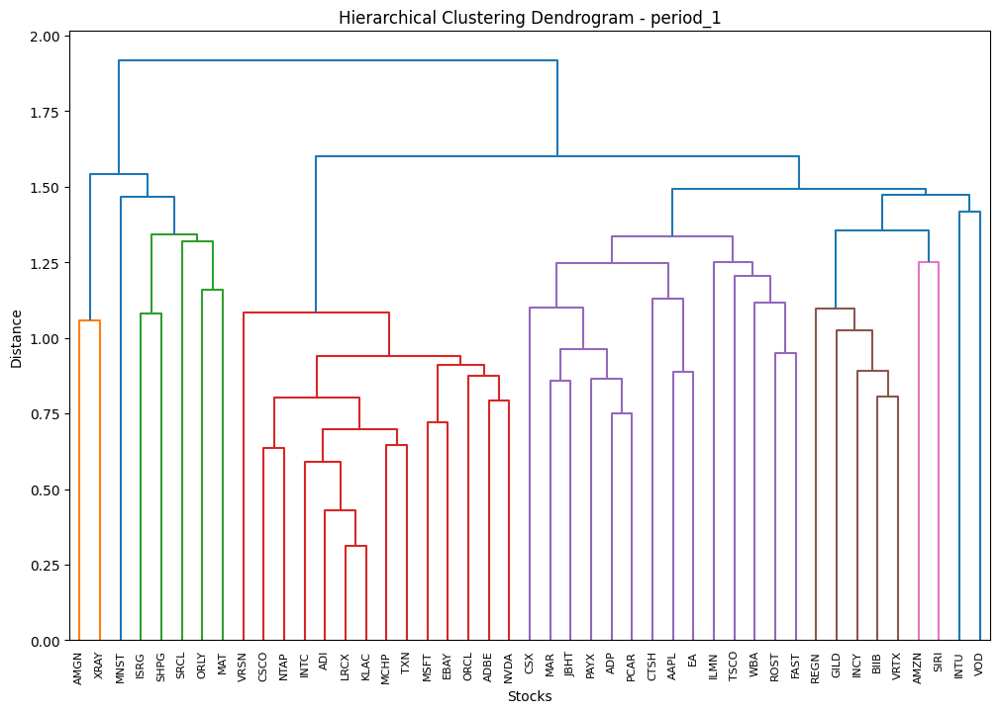

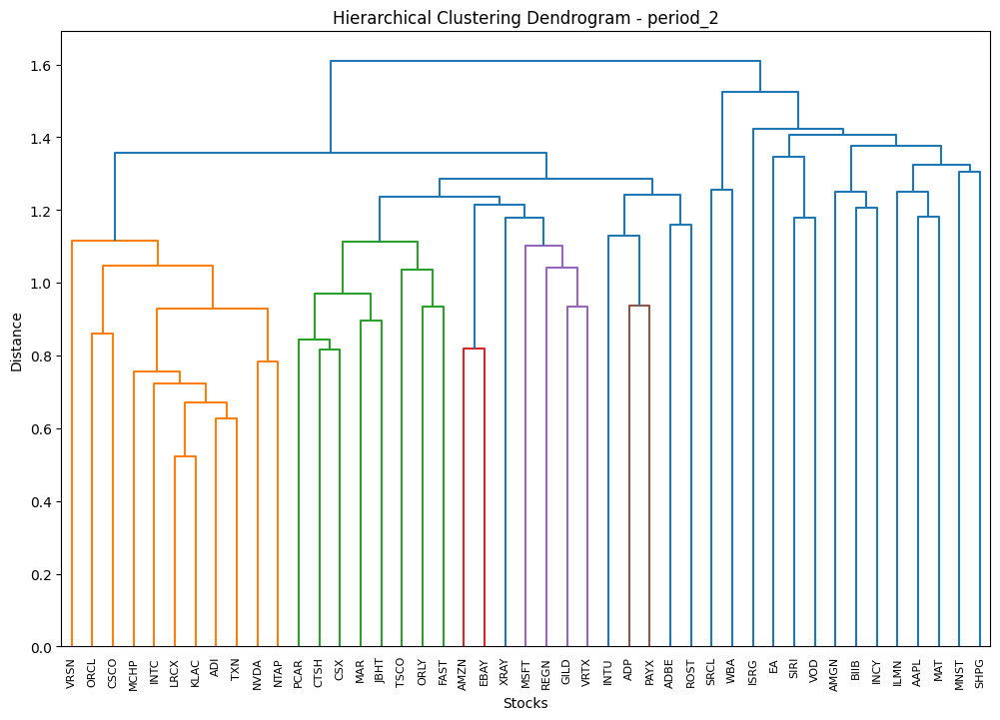

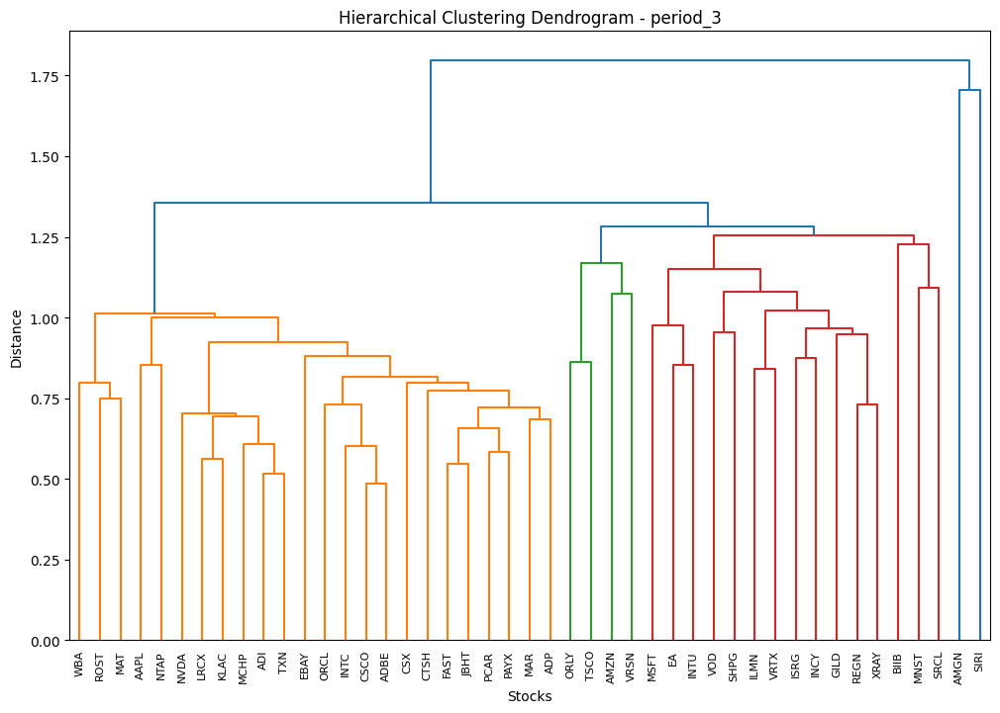

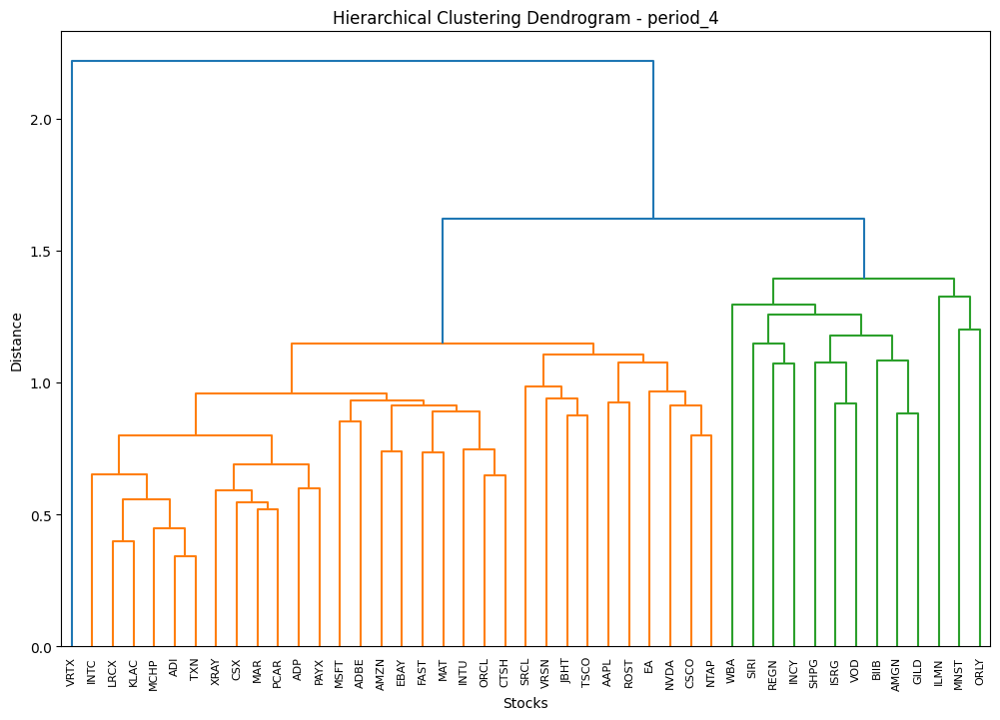

In [469]:
all_cluster_stocks_HCT = HCT(correlation_matrices)

In [470]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(mean_correlation)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [471]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.652715,0.059502,1.160714,0.400560,"[AMZN, EBAY, GILD, KLAC, FAST, MSFT, BIIB, ORC..."
period_1 (4 stocks),0.751044,0.049053,1.594784,0.259890,"[INCY, TXN, XRAY, JBHT, SIRI, VRSN, AMGN, ADP,..."
period_1 (8 stocks),0.758729,0.042779,1.822265,0.247372,"[SIRI, CSCO, ADI, AMGN, GILD, SHPG, WBA, MAR, ..."
period_2 (2 stocks),1.099447,0.035679,2.515764,-0.077010,"[BIIB, INCY, MAT, ROST, AMGN, KLAC, AAPL, ORCL..."
period_2 (4 stocks),0.909368,0.031442,2.718411,0.303272,"[SIRI, VRTX, JBHT, KLAC, AMGN, REGN, PCAR, INT..."
period_2 (8 stocks),0.732141,0.024727,2.923266,0.196234,"[SHPG, GILD, AMZN, NVDA, INTU, ORLY, SIRI, WBA..."
period_3 (2 stocks),0.251401,0.049681,0.525817,0.139273,"[INTC, SIRI, CSX, INCY, WBA, VRSN, MAR, AMGN, ..."
period_3 (4 stocks),0.276424,0.044279,0.623279,0.289810,"[ROST, REGN, TXN, SIRI, MAT, GILD, ADI, VRTX, ..."
period_3 (8 stocks),0.085366,0.040509,0.204649,0.317110,"[INTU, ISRG, MCHP, ADP, AMGN, VRTX, WBA, SIRI,..."
period_4 (2 stocks),1.385022,0.034574,3.965591,0.515310,"[CSCO, BIIB, ADP, MNST, ADI, SHPG, PCAR, REGN,..."


### K-Means

In [472]:
from sklearn.cluster import KMeans
import numpy as np

In [473]:
periods = ['period_1','period_2','period_3','period_4']

In [474]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [475]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1416: Fut

In [476]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.641569,0.060492,1.283030,0.541058,"[AMZN, MSFT, MNST, EBAY, MAR, TXN, CTSH, LRCX,..."
period_1 (4 stocks),0.657327,0.049150,1.497030,0.216051,"[WBA, INTC, ILMN, BIIB, SHPG, EBAY, ADP, INCY,..."
period_1 (8 stocks),0.736271,0.042034,1.785610,0.210282,"[NVDA, PCAR, SHPG, CSCO, INCY, AMGN, VOD, MNST..."
period_2 (2 stocks),0.590029,0.036072,1.480638,0.268015,"[CTSH, SRCL, CTSH, VRTX, KLAC, SRCL, KLAC, WBA..."
period_2 (4 stocks),0.834205,0.032557,2.510581,0.073949,"[MAT, REGN, TSCO, ISRG, ILMN, CTSH, LRCX, EBAY..."
period_2 (8 stocks),0.744155,0.026263,2.826349,0.194024,"[VRSN, CTSH, ADI, BIIB, SHPG, AMZN, INTU, INCY..."
period_3 (2 stocks),0.195750,0.050064,0.369145,0.405090,"[INCY, ADBE, ILMN, PCAR, MNST, PCAR, MSFT, KLA..."
period_3 (4 stocks),0.171186,0.043110,0.393699,0.463450,"[ORLY, WBA, MAT, LRCX, INTU, REGN, PAYX, MCHP,..."
period_3 (8 stocks),0.295833,0.038305,0.769392,0.302329,"[AMGN, PCAR, BIIB, ISRG, LRCX, ROST, SIRI, VOD..."
period_4 (2 stocks),1.190852,0.034153,3.499553,0.249549,"[TSCO, ADP, SRCL, FAST, AAPL, NVDA, MNST, MAR,..."


In [477]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [478]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [479]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.215358,0.081922,0.262882,0.300087,"[ILMN, MSFT]"
period_1 (4 stocks),0.463037,0.048472,0.955261,0.295580,"[ORLY, MSFT, JBHT, INCY]"
period_1 (8 stocks),2.089444,0.044789,4.665124,0.207696,"[TSCO, JBHT, ORLY, INTC, ILMN, AMGN, AMZN, MNST]"
period_2 (2 stocks),0.461856,0.024392,1.893503,0.429638,"[PCAR, ADP]"
period_2 (4 stocks),1.382918,0.036586,3.779944,0.278134,"[MAT, FAST, NVDA, VRTX]"
period_2 (8 stocks),0.617856,0.023857,2.589874,0.255331,"[MAT, FAST, NVDA, MSFT, SHPG, EBAY, ADP, ORLY]"
period_3 (2 stocks),0.616200,0.053408,1.153767,0.453722,"[ILMN, ROST]"
period_3 (4 stocks),0.920327,0.055431,1.660301,0.402069,"[ISRG, ILMN, ROST, NVDA]"
period_3 (8 stocks),0.564237,0.040694,1.386539,0.360134,"[AMGN, ADP, ILMN, ISRG, ORCL, INTU, VRTX, REGN]"
period_4 (2 stocks),0.863361,0.031137,2.772755,0.354952,"[SHPG, AMZN]"


### Minimum Spanning Trees

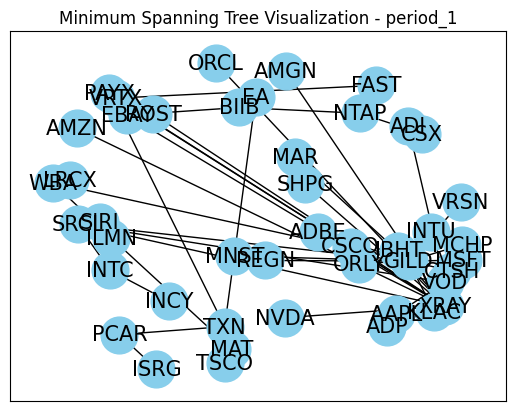

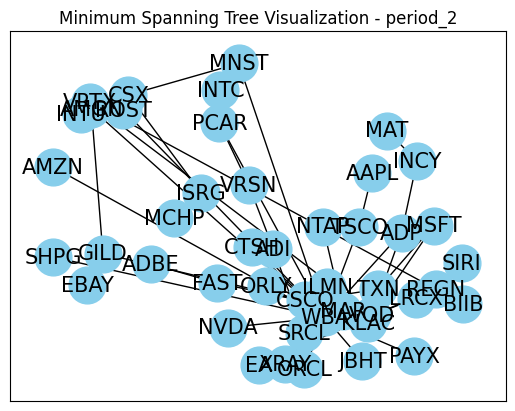

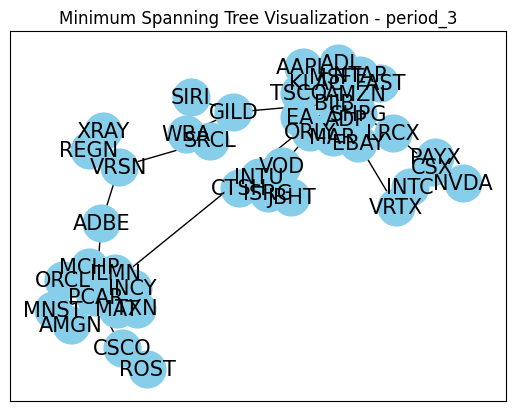

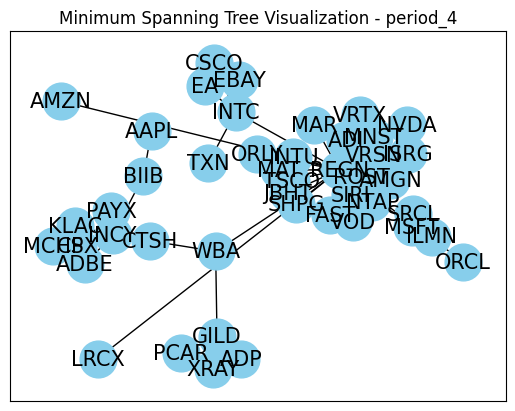

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


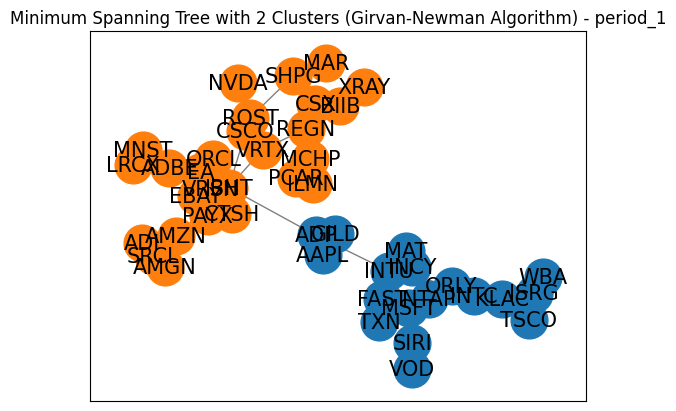

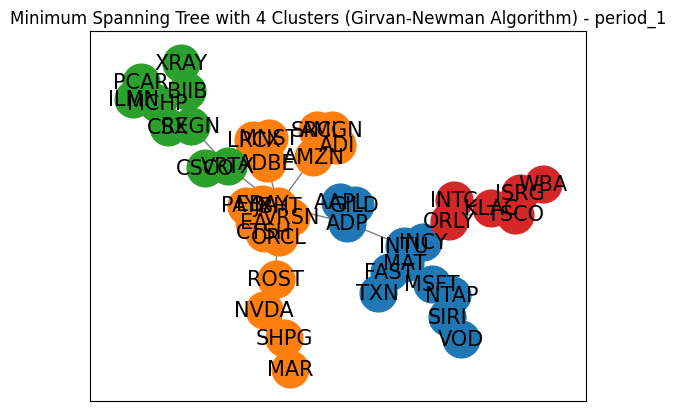

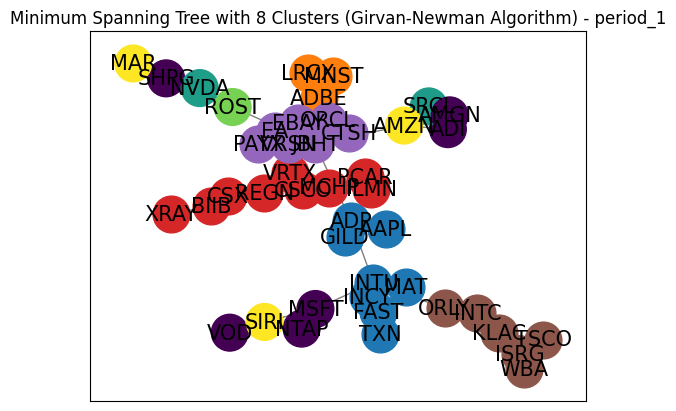

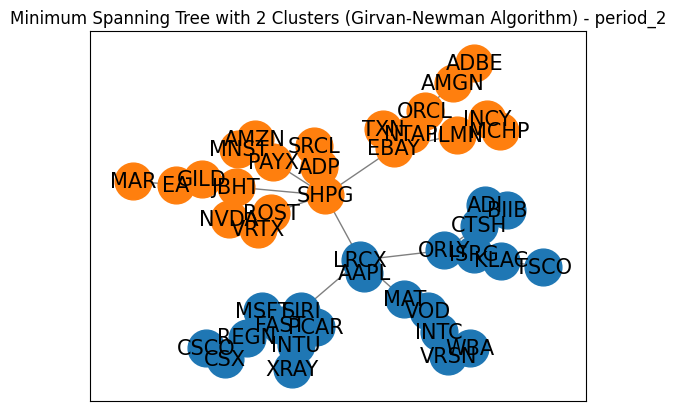

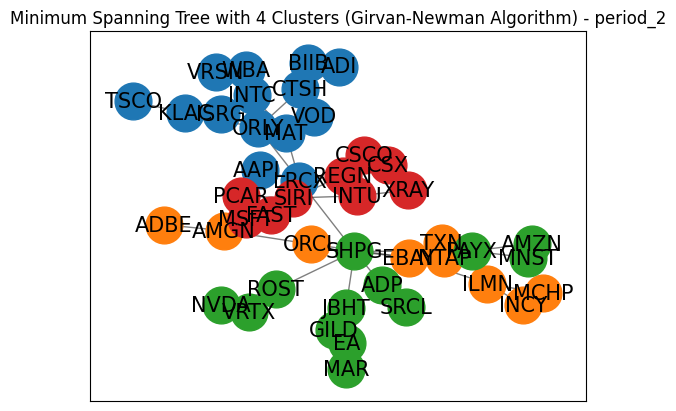

...

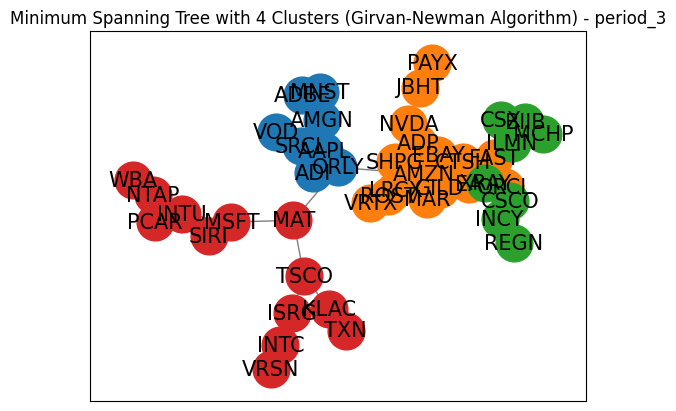

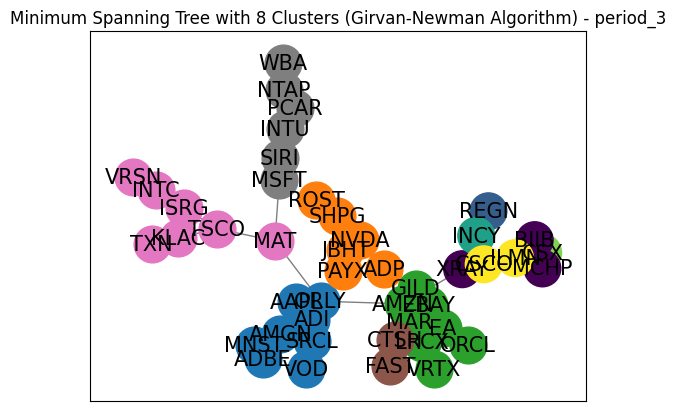

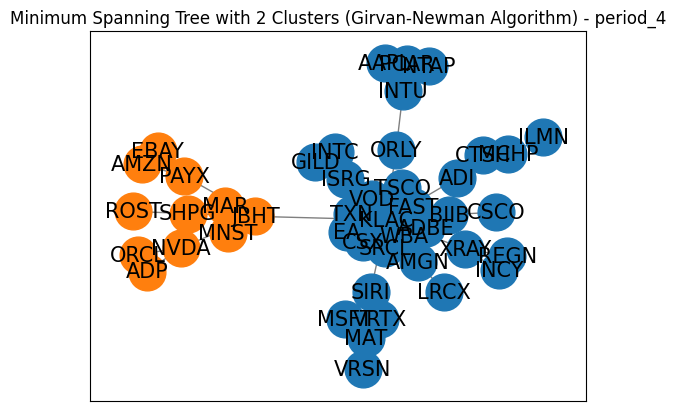

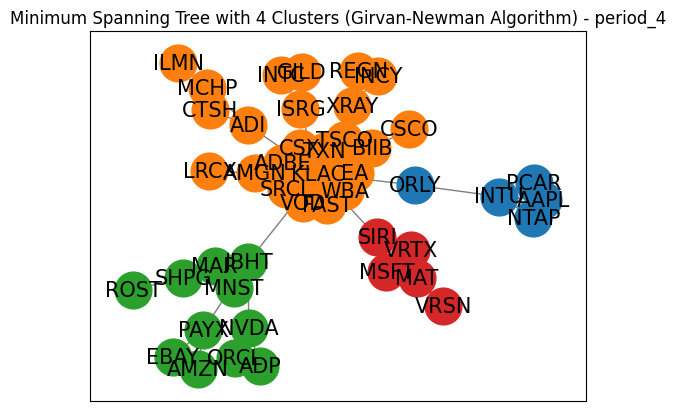

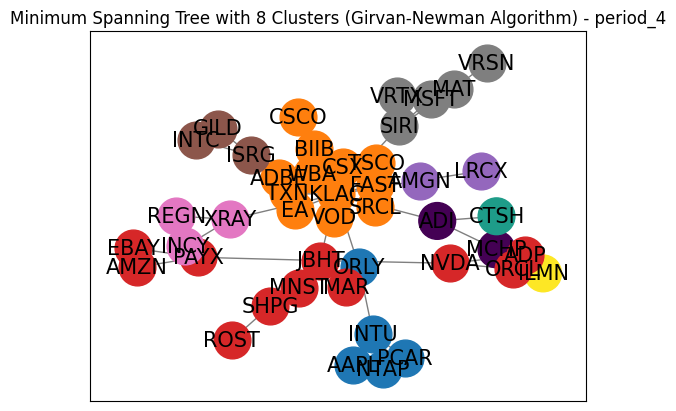

In [480]:
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
        # Plot the graph with clusters colored
        pos = nx.spring_layout(G)
        for i, community in enumerate(communities):
            nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
        nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
        nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
        plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
        plt.show()


def MST_cluster(distance_matrix, labels, period, plot):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            if len(communities) == num_clusters:
                break
        
        #plot
        if plot:
            plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks

def MST(correlation_matrices, plot = True):
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        distance_matrix = correlation_matrices[period]
        tickers = sorted(set([index[0] for index in distance_matrix]))
        labels = {i: ticker for i, ticker in enumerate(tickers)}

        # Convert the distance matrix to a sparse matrix
        sparse_matrix = csr_matrix(distance_matrix)

        # Compute the minimum spanning tree
        mst = minimum_spanning_tree(sparse_matrix)

        # Create a NetworkX graph from the MST
        G = nx.Graph(mst.toarray().astype(float))
        if plot:
            # Draw the graph
            pos = nx.spring_layout(G)  # positions for all nodes
            nx.draw_networkx_nodes(G, pos, node_size=700, node_color='skyblue')
            nx.draw_networkx_edges(G, pos, edge_color='k')
            nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
            plt.title(f"Minimum Spanning Tree Visualization - {period}")
            plt.show()       
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)

    mst_all_cluster_stocks = {}
    tickers = sorted(set(index[0] for index in distance_matrix))
    labels = {i: ticker for i, ticker in enumerate(tickers)}
    for period, distance_matrix in distance_matrices.items():
        mst_all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period, plot)

    return mst_all_cluster_stocks
mst_all_cluster_stocks = MST(correlation_matrices)

In [481]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period, mst_result_df_clusters = calculate_metrics_for_mst_clusters(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters


,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.832766,0.058577,1.600285,0.290045,"[KLAC, CSX, MSFT, EA, WBA, CTSH, MSFT, AMGN, N..."
period_1 (4 stocks),0.735149,0.050721,1.536179,0.262426,"[NTAP, AMGN, CSX, INTC, INTU, JBHT, VRTX, KLAC..."
period_1 (8 stocks),0.740851,0.046749,1.641095,0.270737,"[ADP, MNST, ADI, VRTX, JBHT, INTC, SHPG, SIRI,..."
period_2 (2 stocks),1.156844,0.035852,2.663921,0.233386,"[CTSH, ORCL, PCAR, PAYX, AAPL, GILD, MAT, SHPG..."
period_2 (4 stocks),0.962686,0.032179,2.807593,0.249009,"[CTSH, ADBE, SHPG, REGN, VRSN, INCY, ADP, MSFT..."
period_2 (8 stocks),1.092182,0.028119,3.766269,0.225709,"[INTC, ADBE, ORLY, SRCL, AMZN, CSCO, MAR, ILMN..."
period_3 (2 stocks),0.152784,0.049365,0.315293,0.408050,"[MNST, EBAY, INTC, SHPG, PCAR, CSX, INTU, BIIB..."
period_3 (4 stocks),0.261053,0.043832,0.586919,0.401044,"[ORLY, CTSH, BIIB, VRSN, VOD, ROST, ILMN, INTC..."
period_3 (8 stocks),0.270680,0.041164,0.656181,0.412228,"[AAPL, SHPG, LRCX, MCHP, CSCO, CTSH, KLAC, SIR..."
period_4 (2 stocks),0.973838,0.032744,2.990988,0.393198,"[SRCL, MNST, VOD, JBHT, MSFT, MAR, INTU, MAR, ..."


## Plots and Diagrams (In Sample)

In [482]:
def count_of_stocks(result_df_clusters,custom_tickers,experiment_name):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'{experiment_name} Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)
        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(f"{experiment_name} All Stocks - All Periods Combined'")
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title(f'{experiment_name} Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

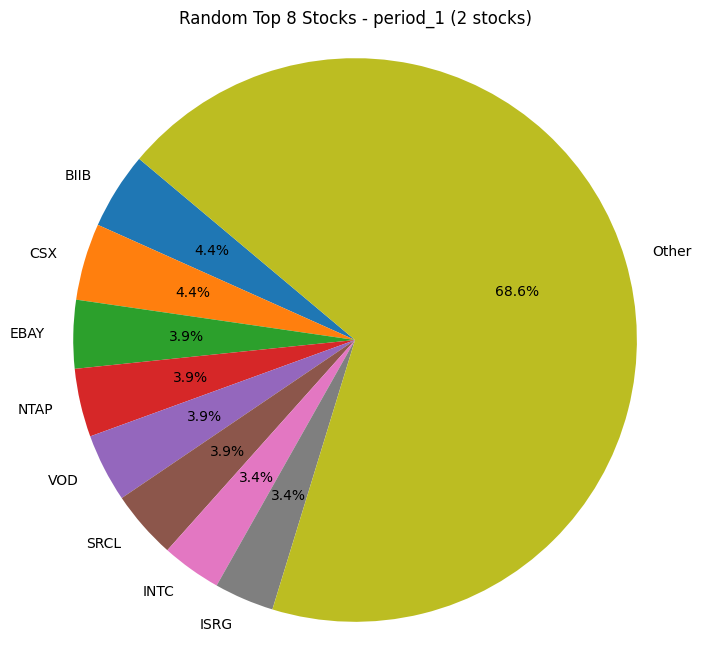

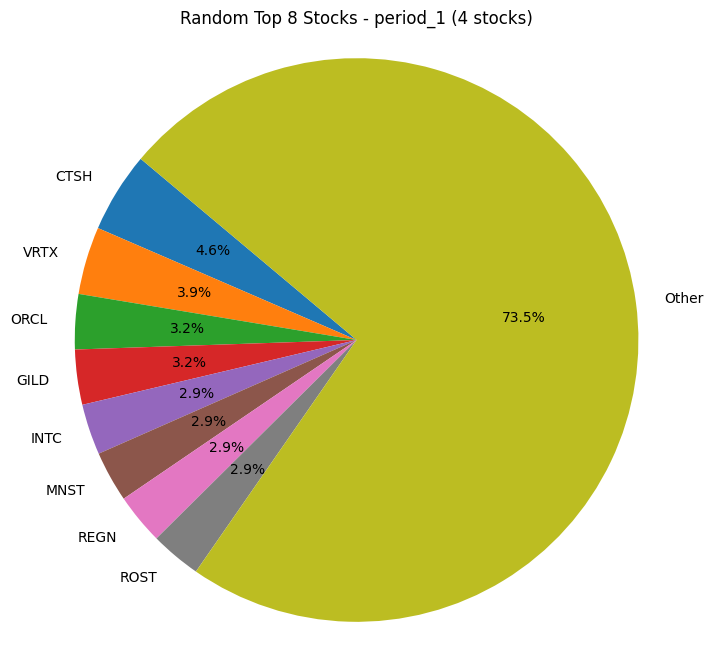

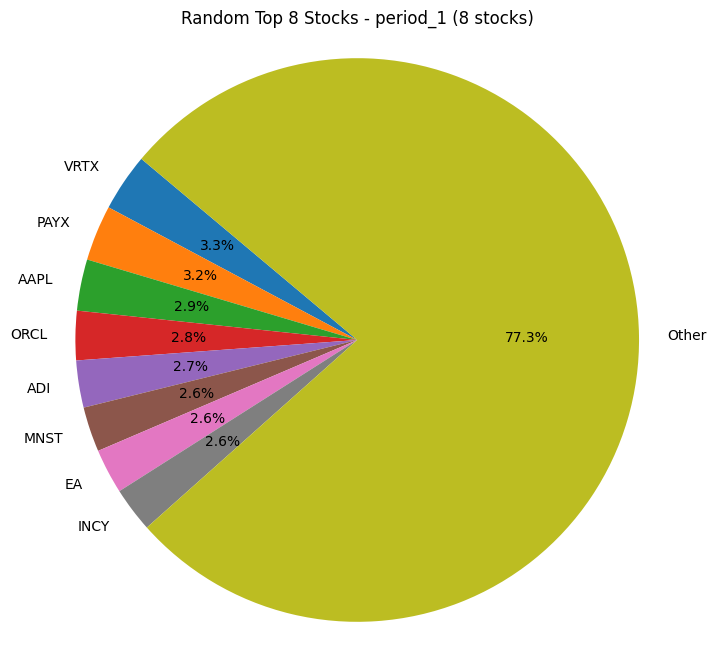

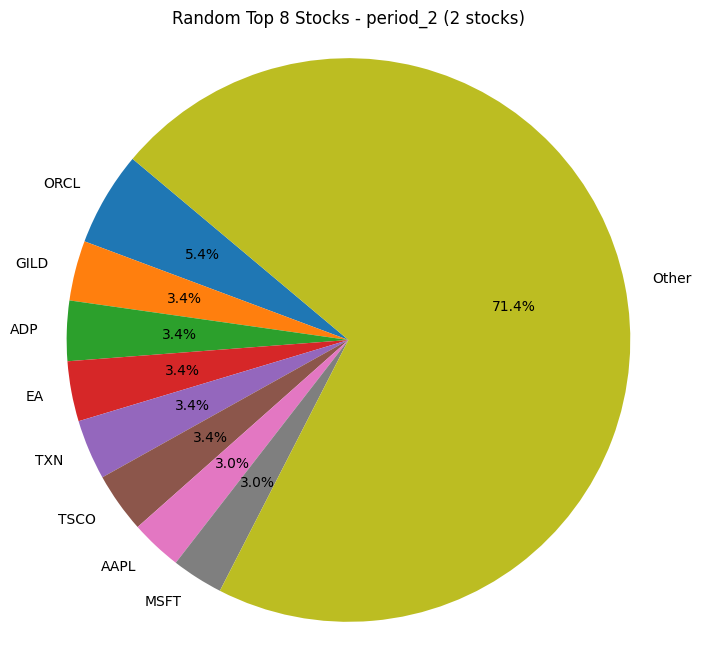

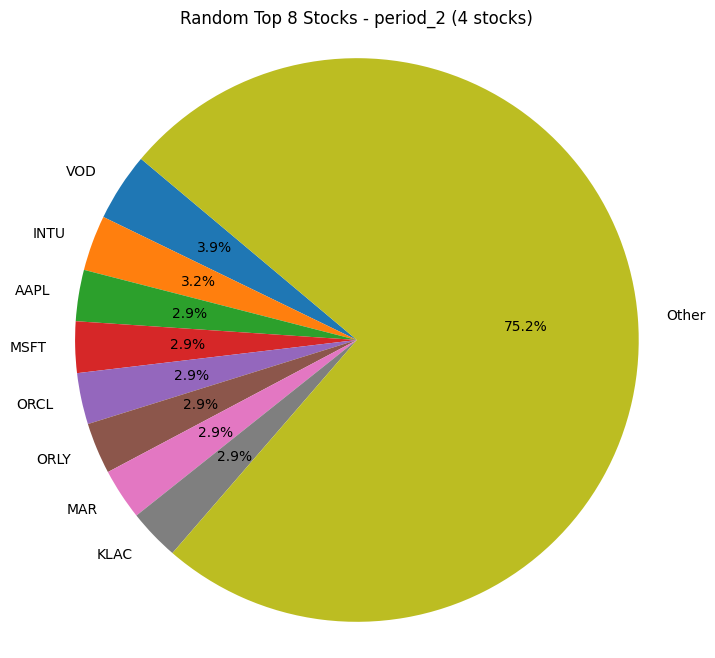

...

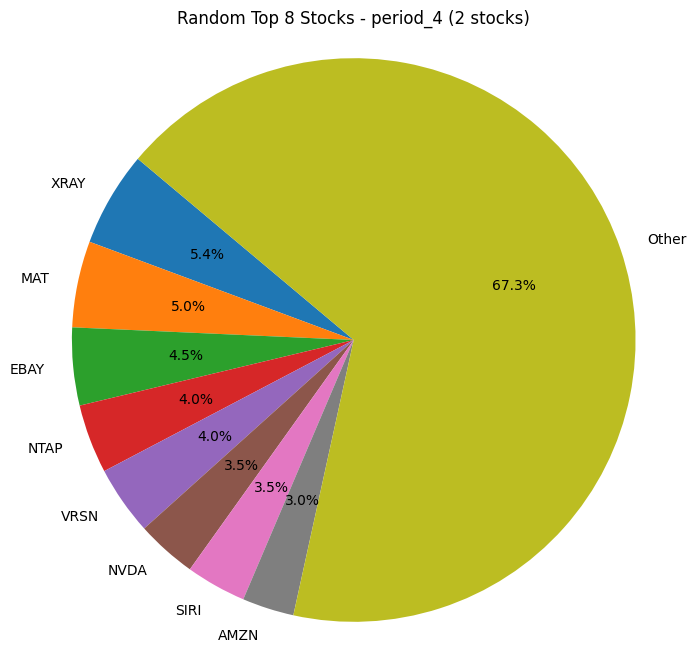

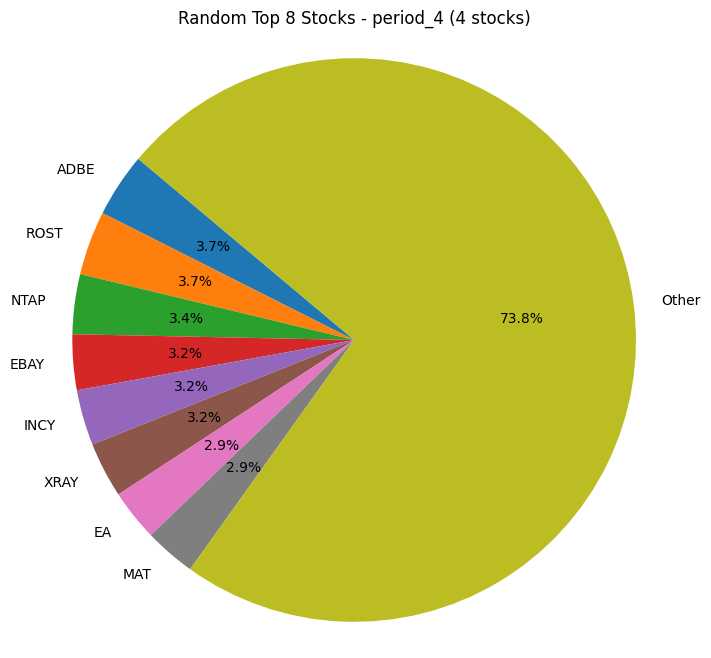

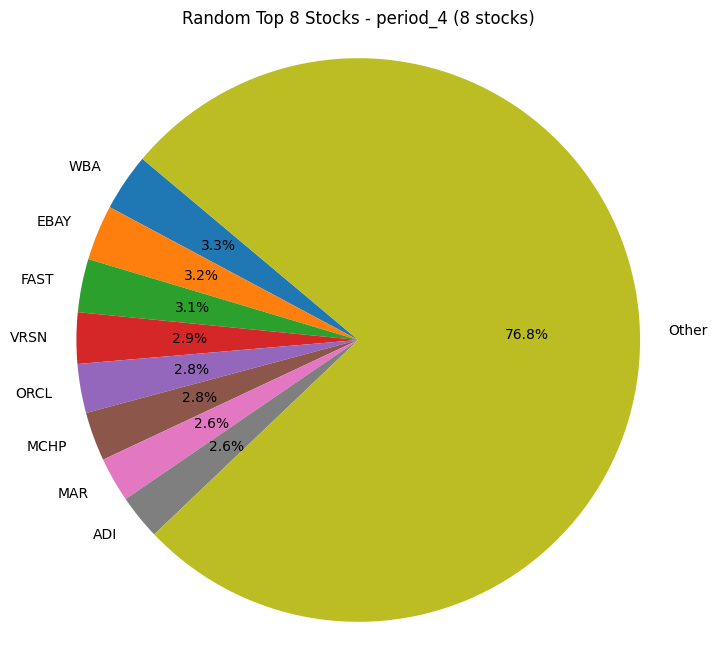

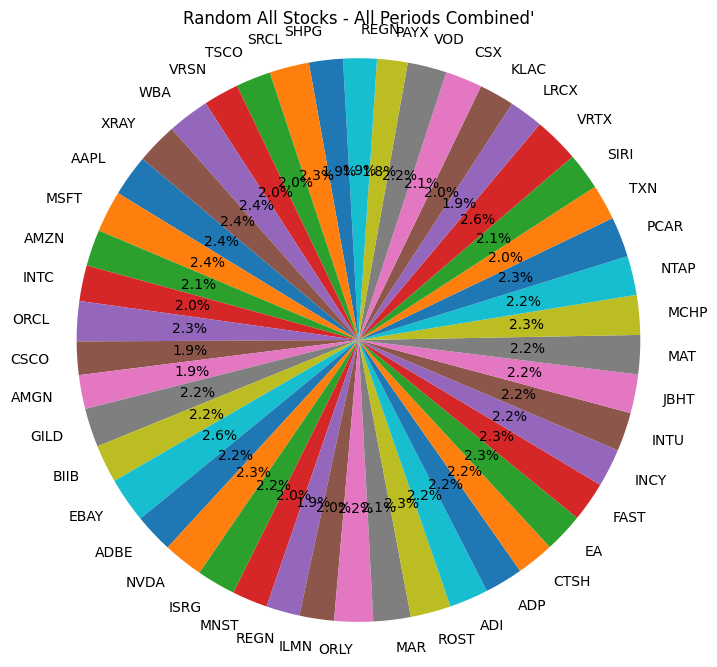

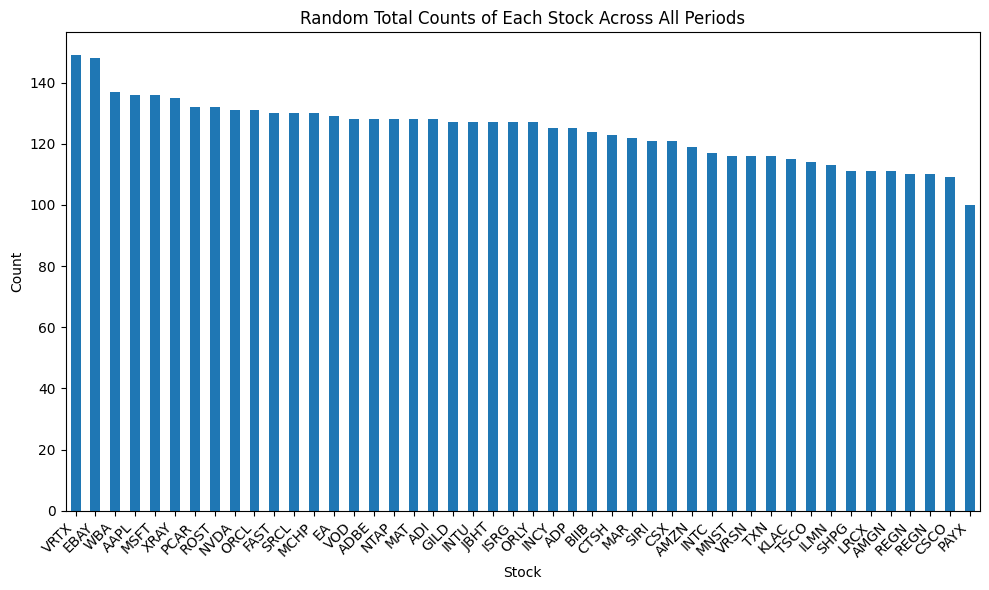

In [483]:
count_of_stocks(result_df_random,custom_tickers, "Random")

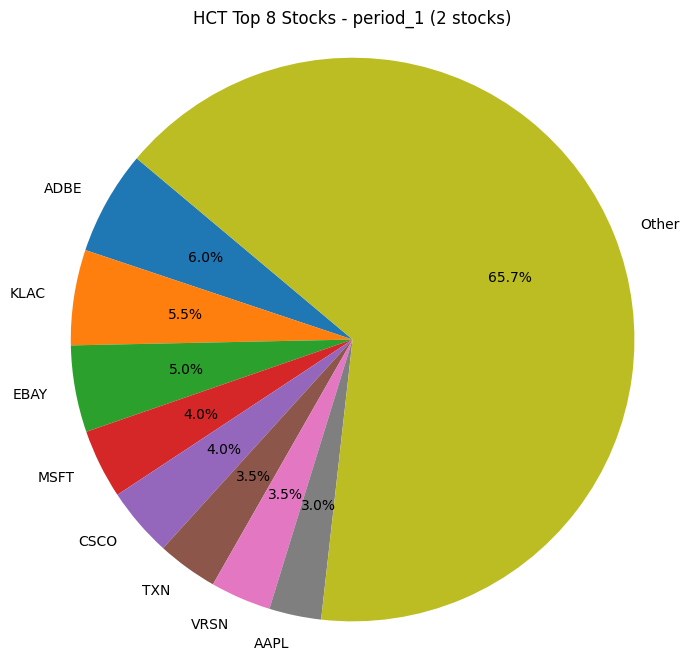

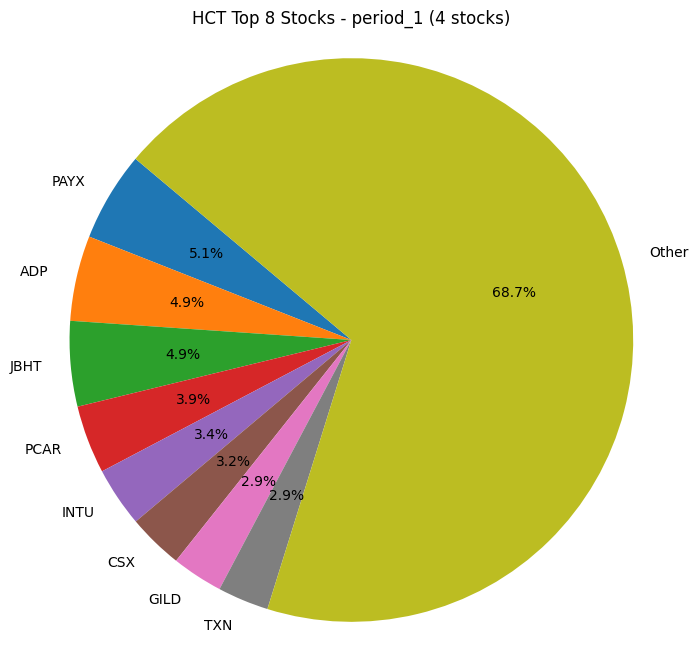

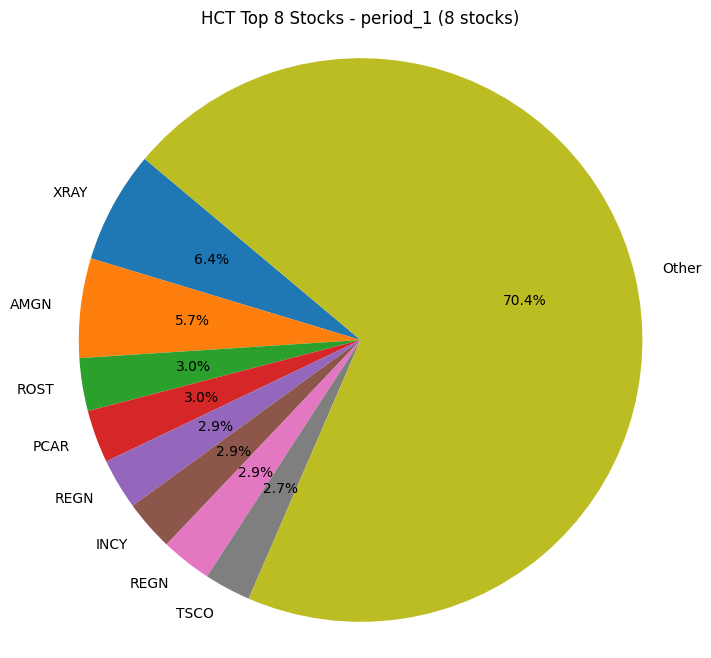

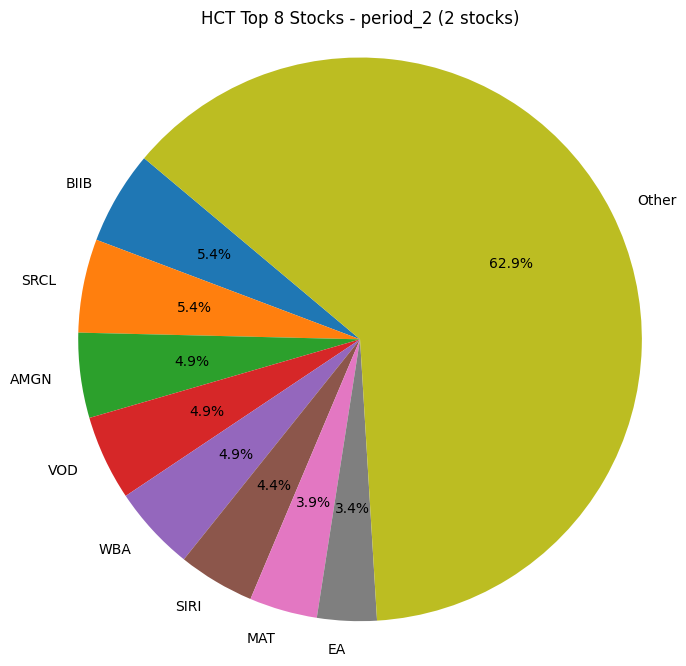

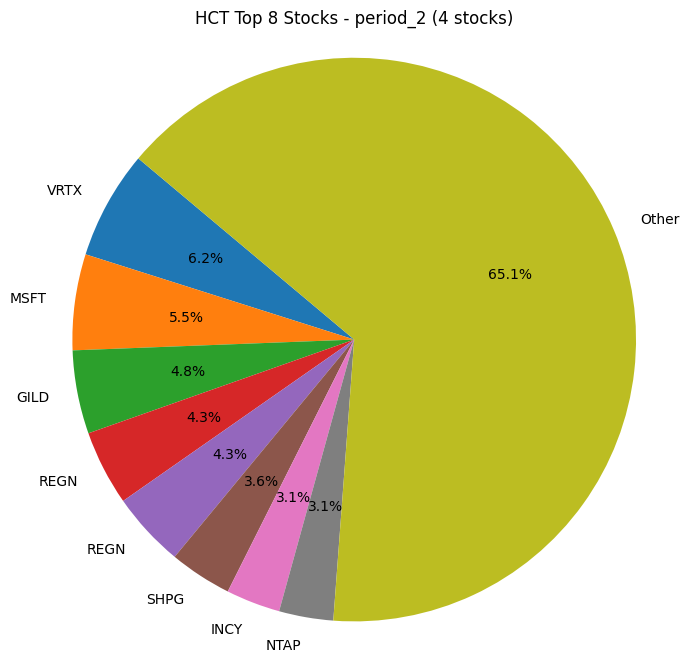

...

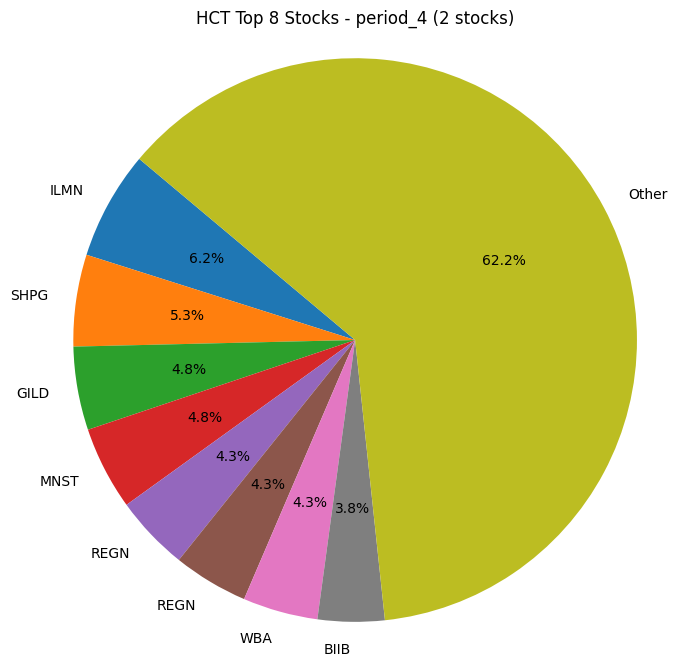

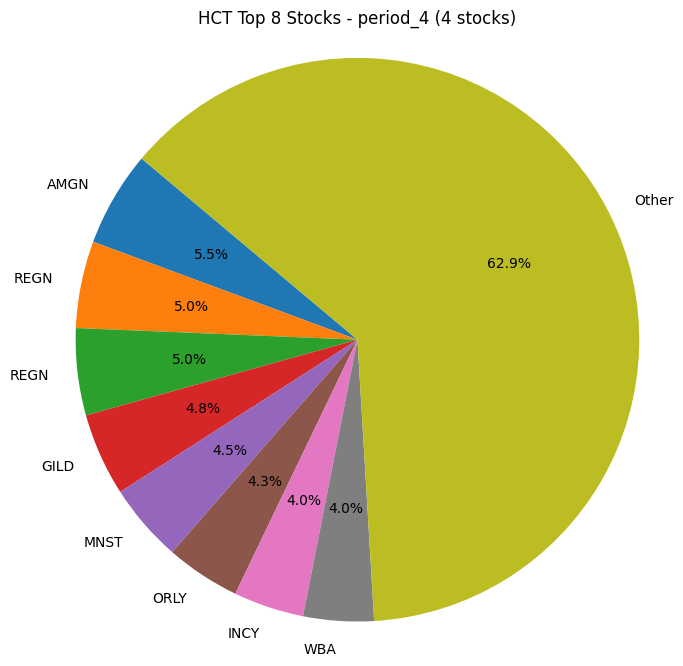

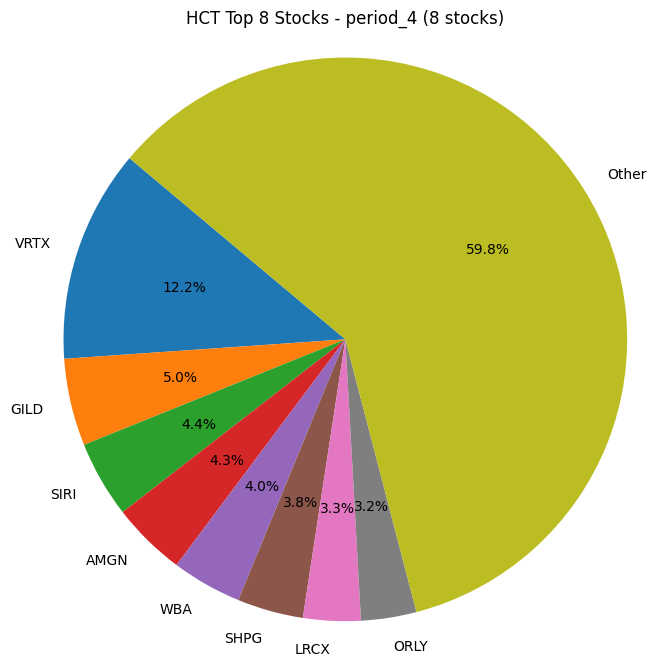

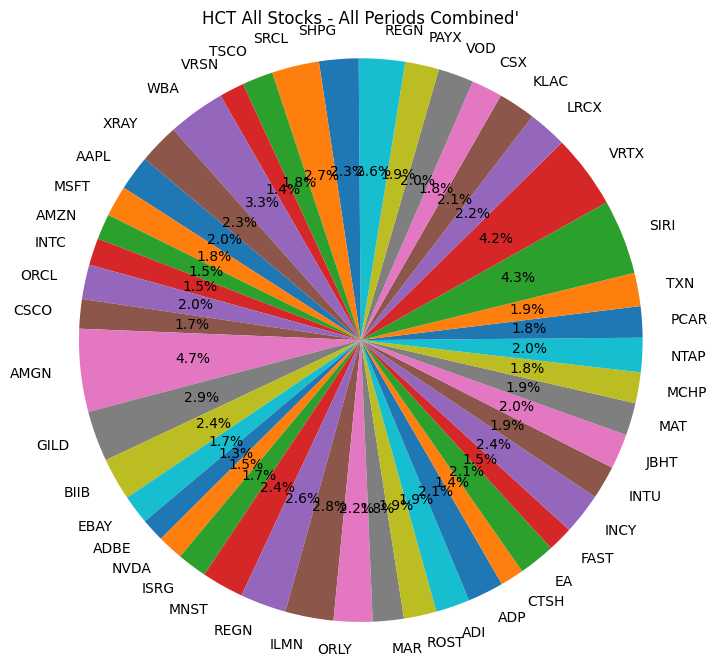

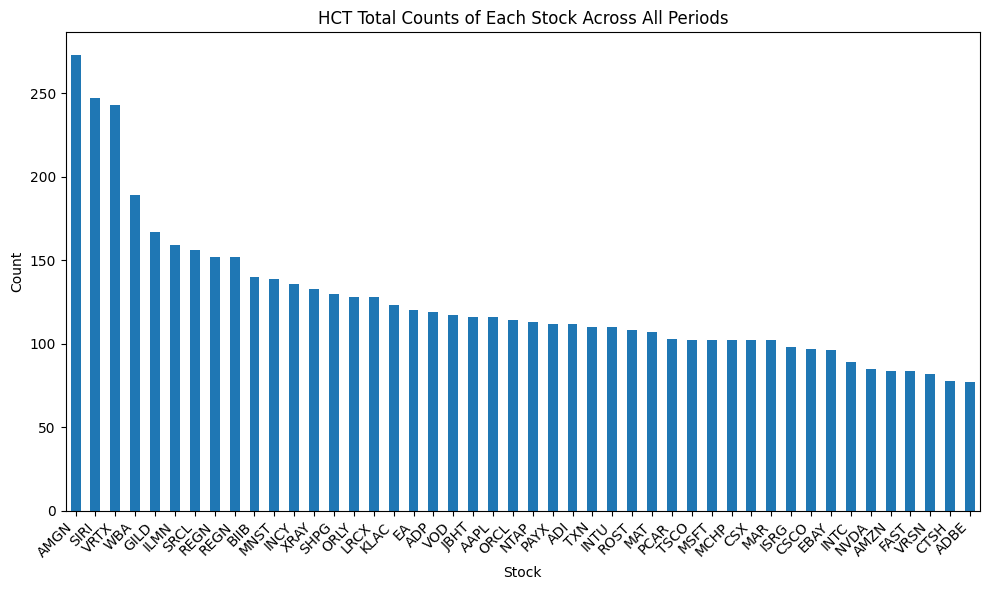

In [484]:
count_of_stocks(result_df_HCT,custom_tickers, "HCT")

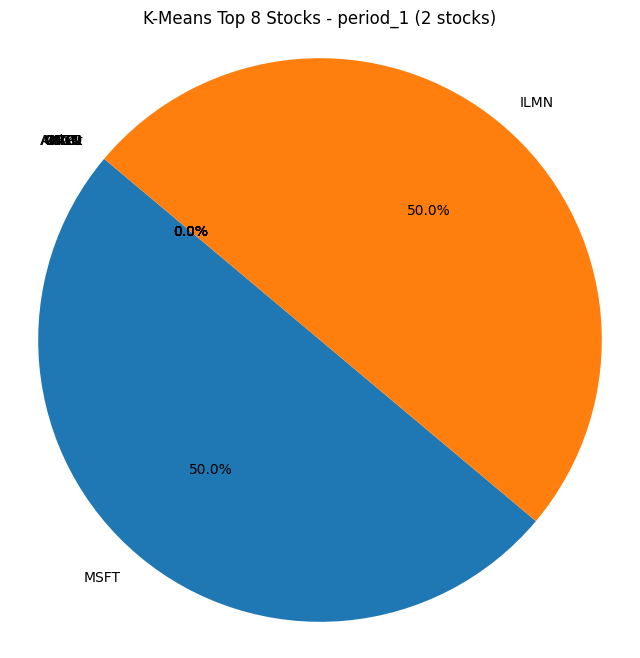

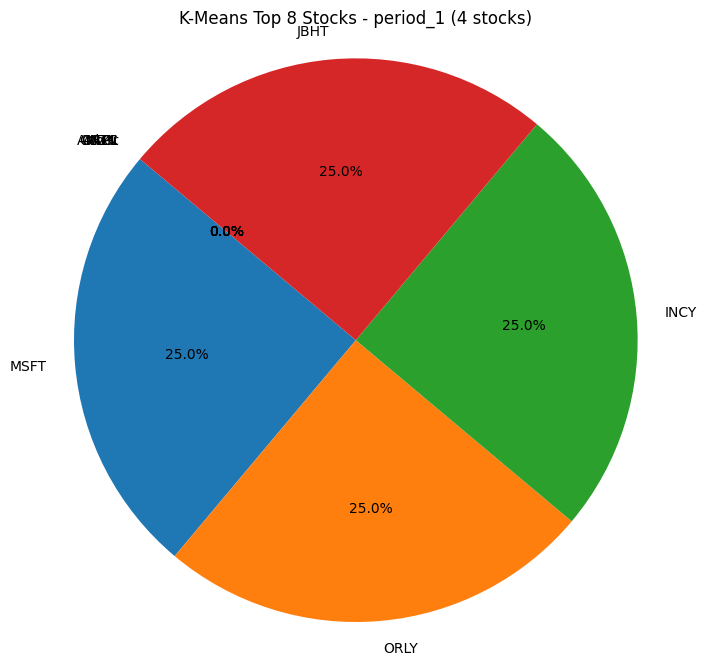

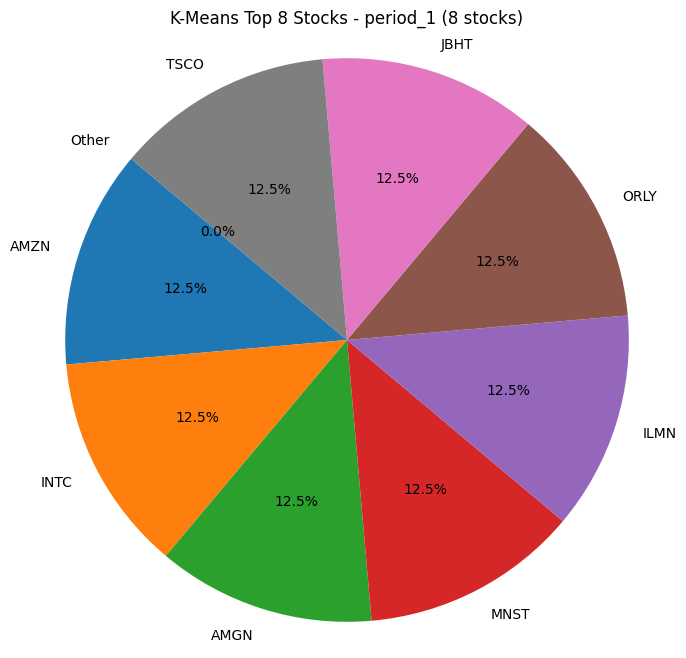

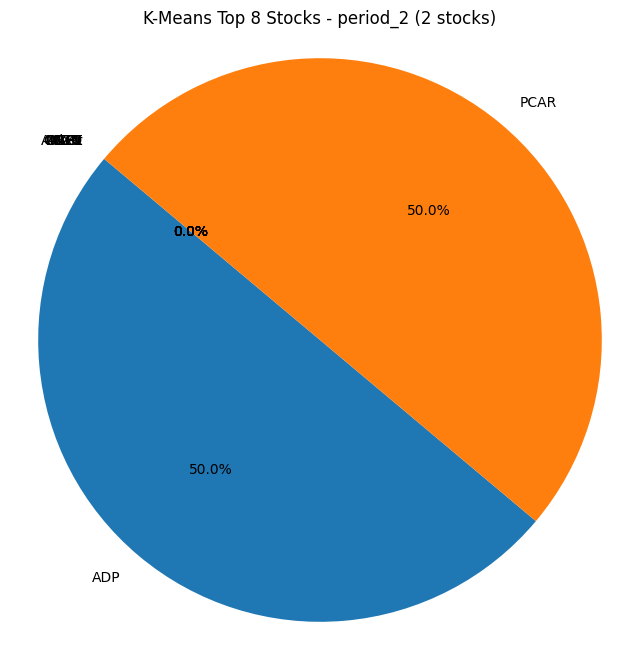

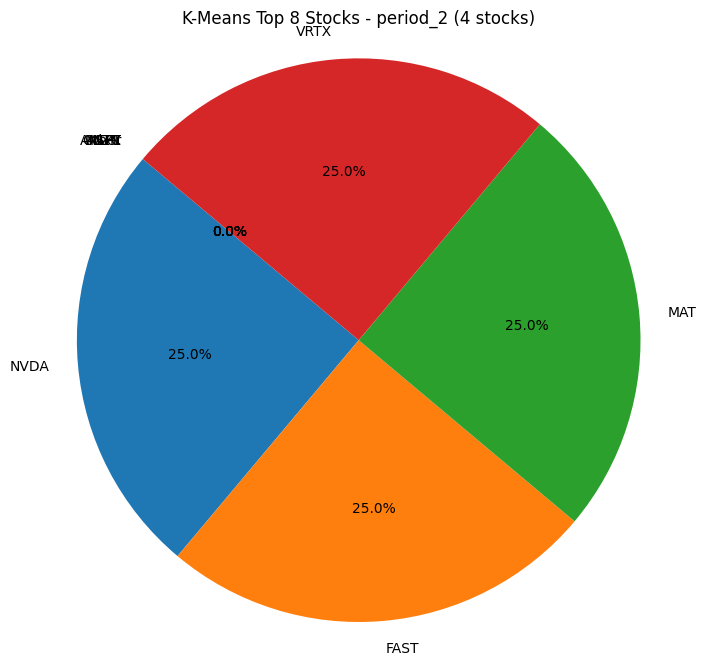

...

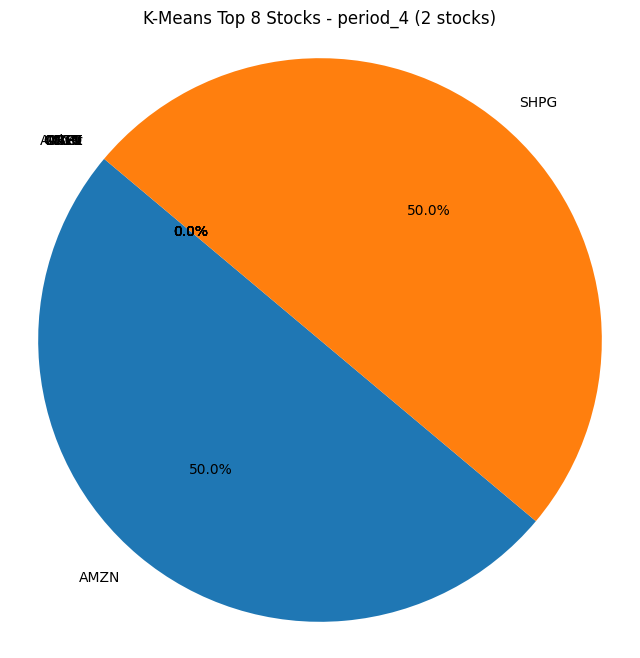

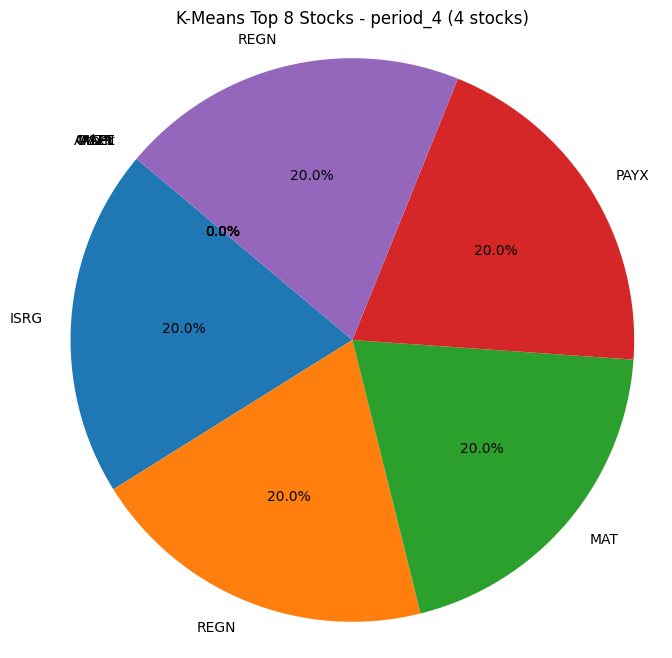

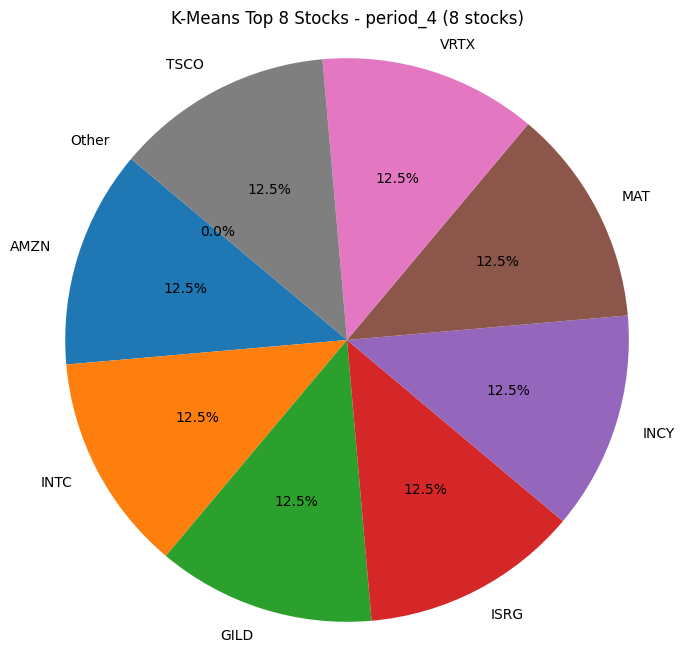

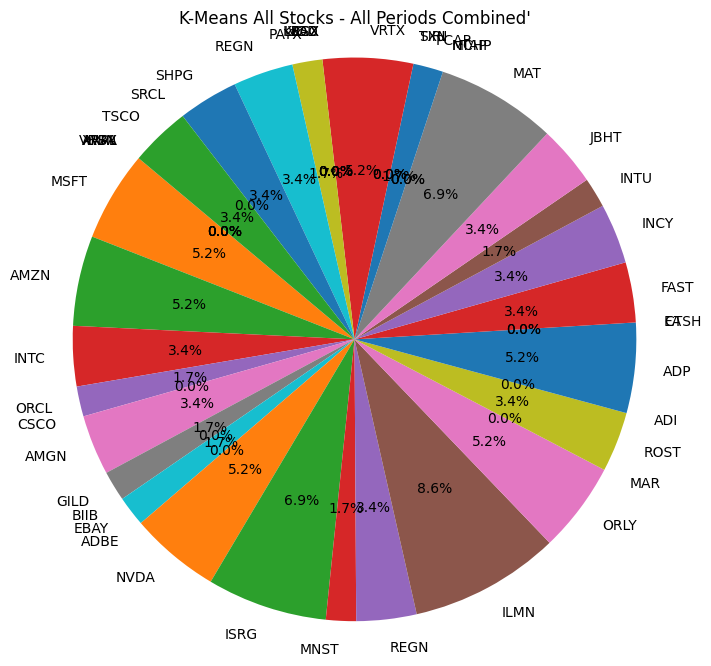

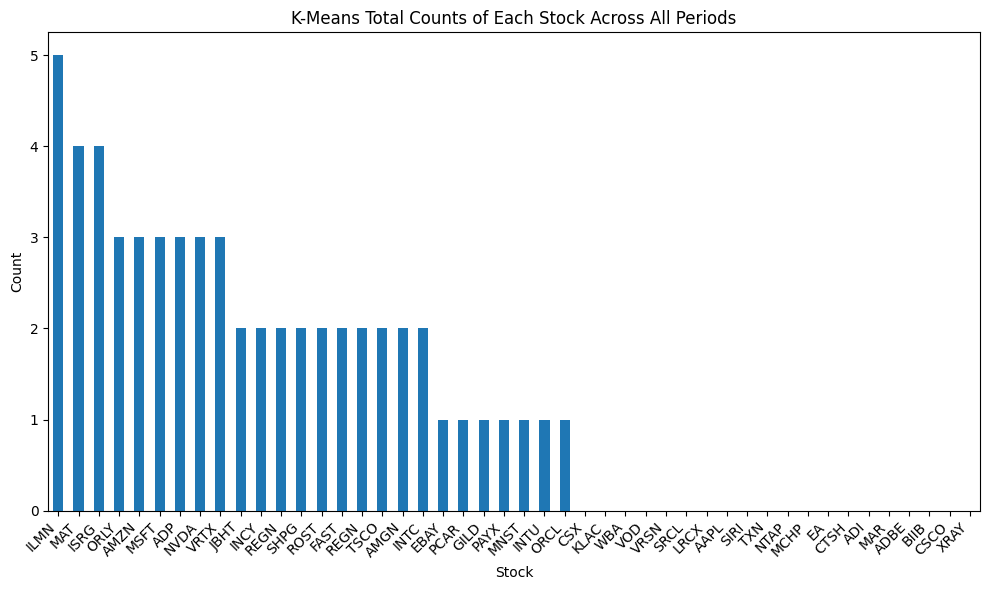

In [485]:
count_of_stocks(result_df_kmeans,custom_tickers, "K-Means")

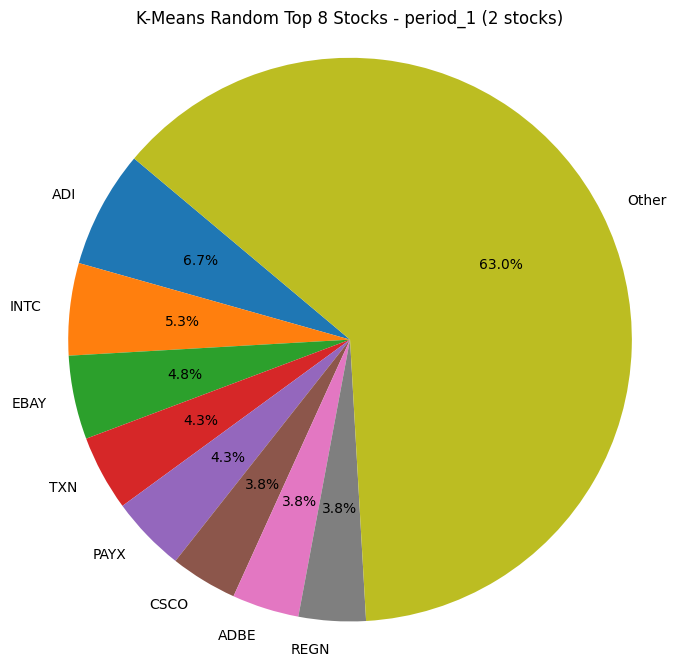

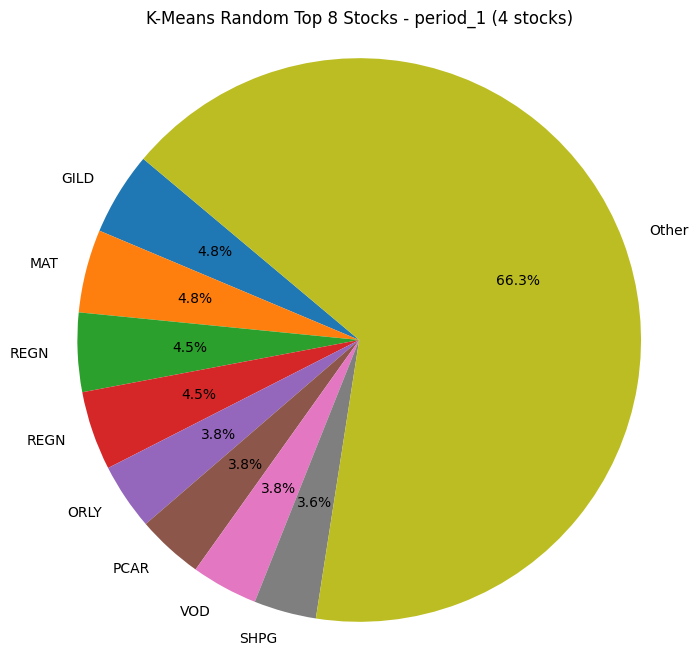

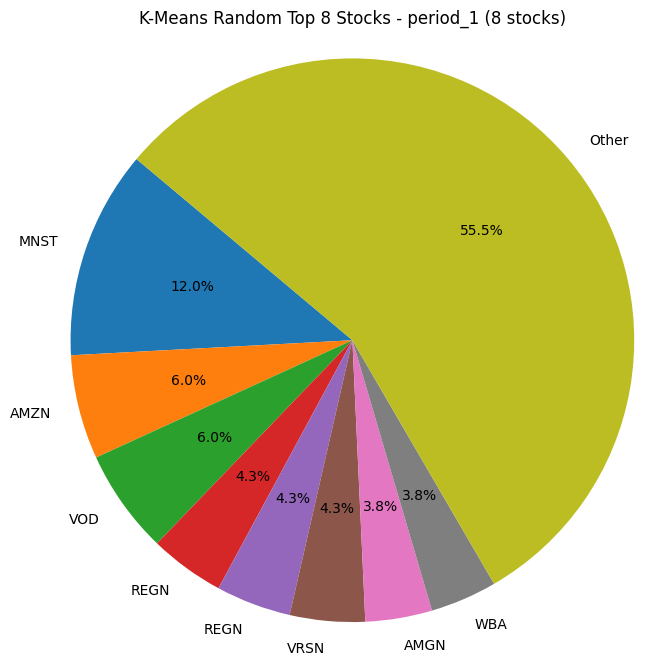

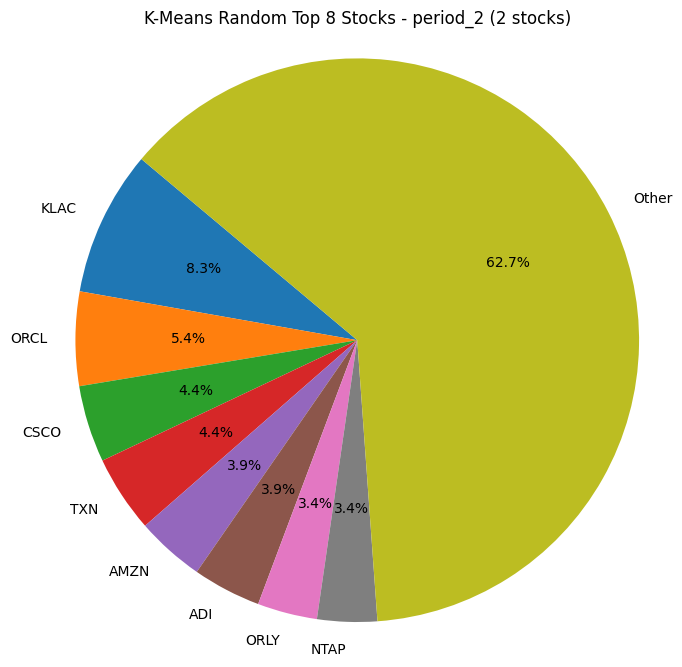

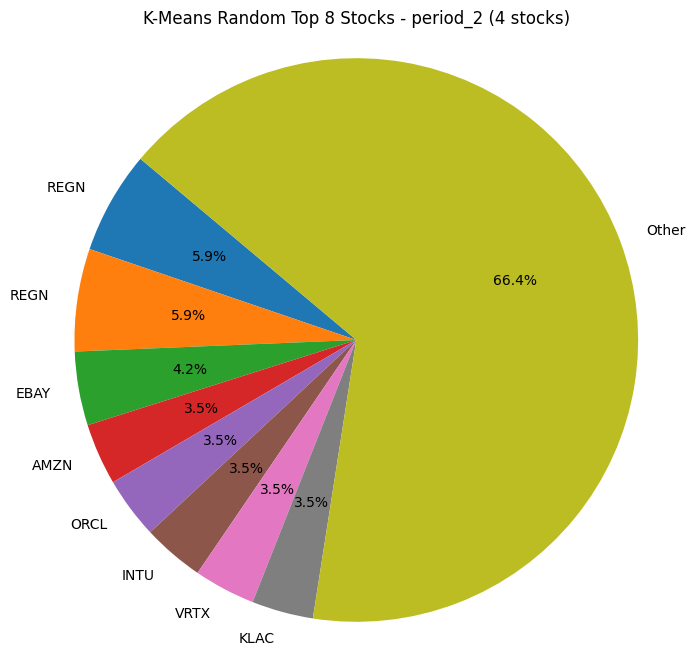

...

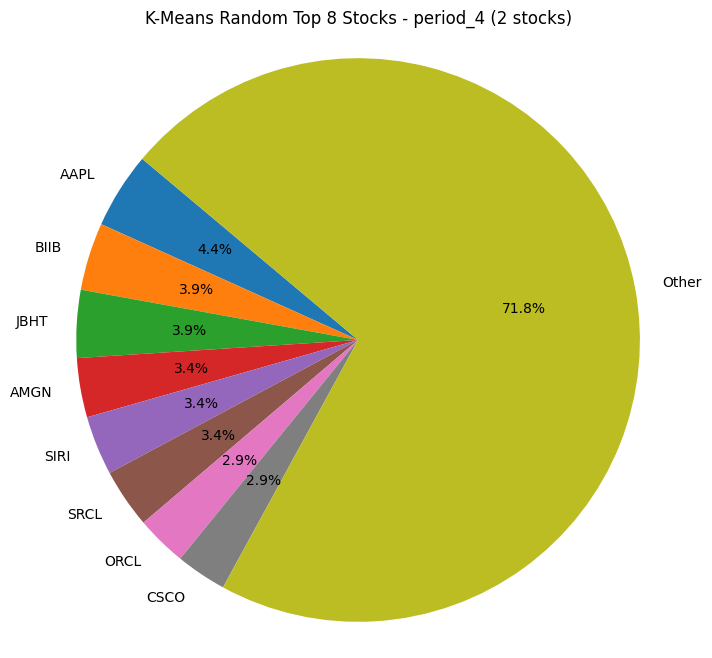

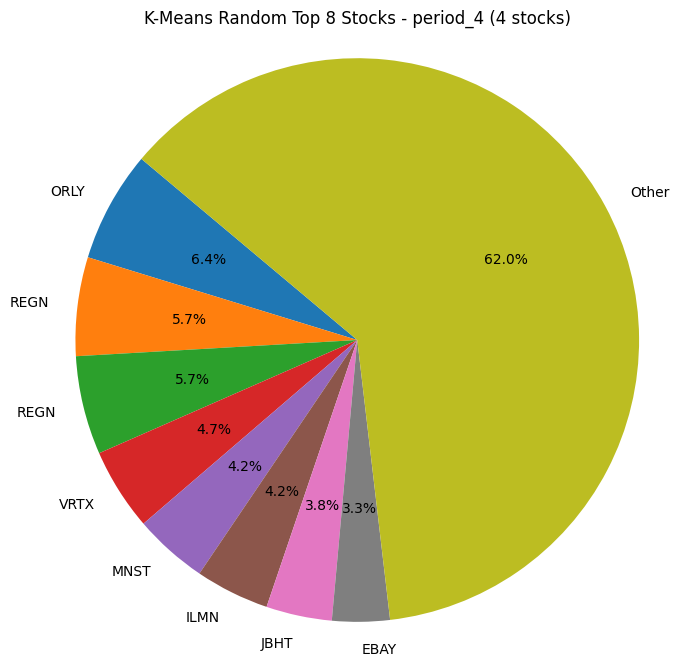

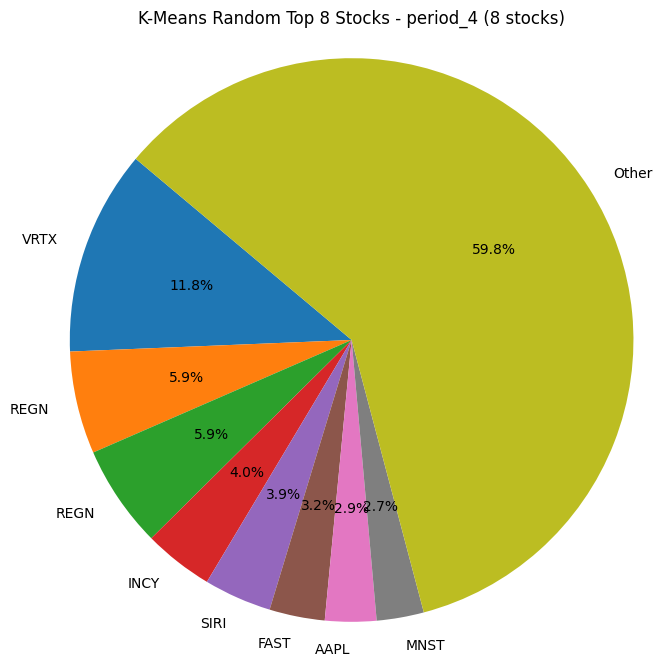

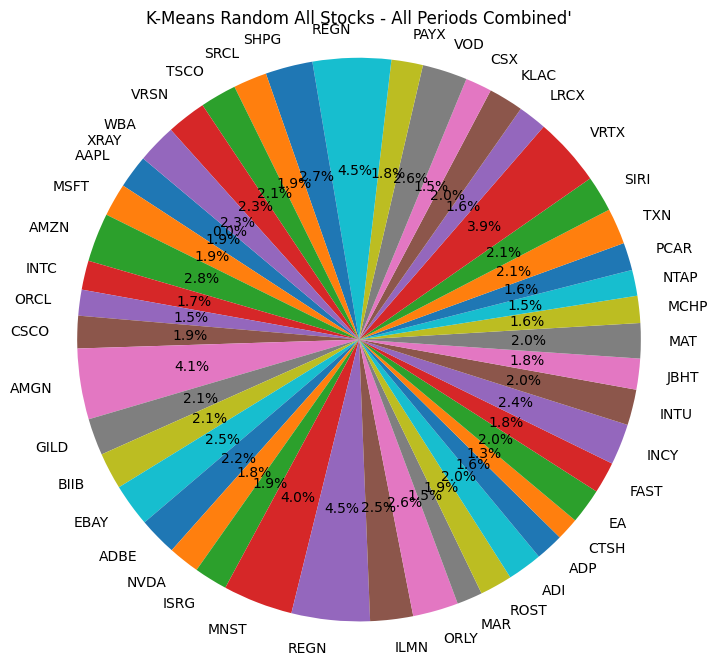

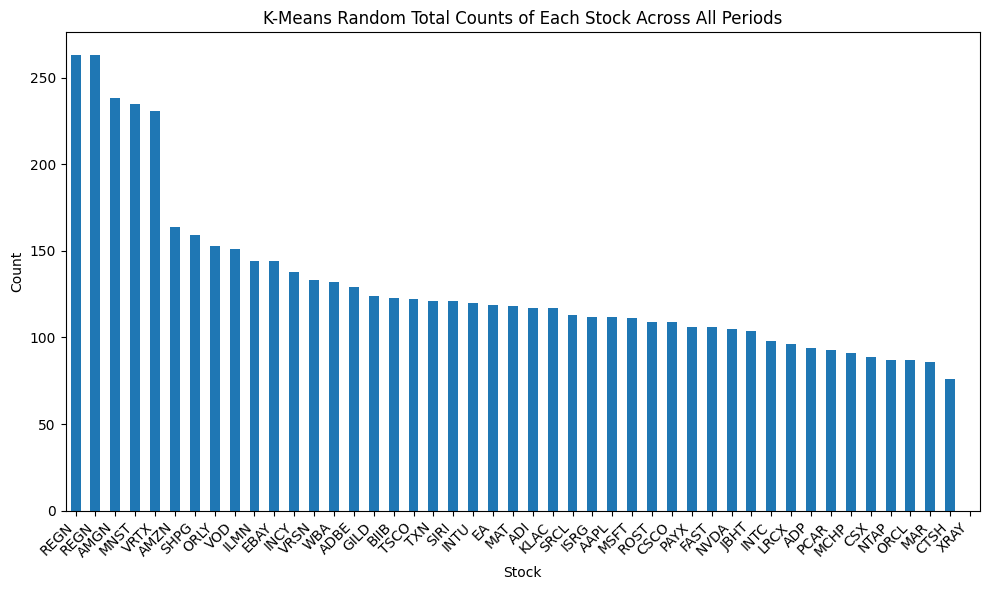

In [486]:
count_of_stocks(result_df_kmeans_rand,custom_tickers, "K-Means Random")

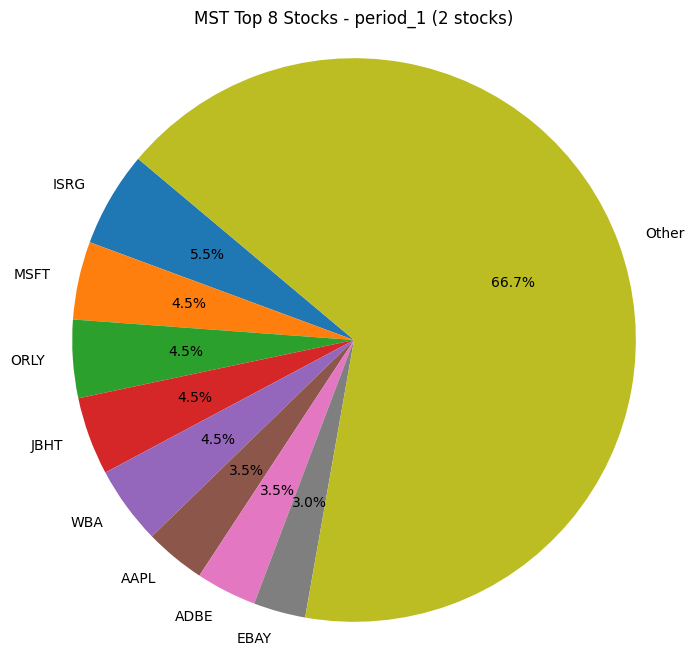

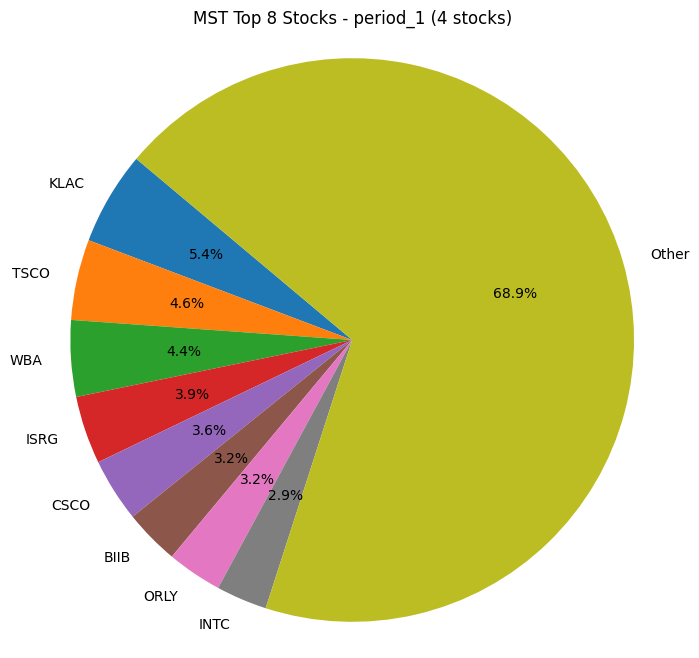

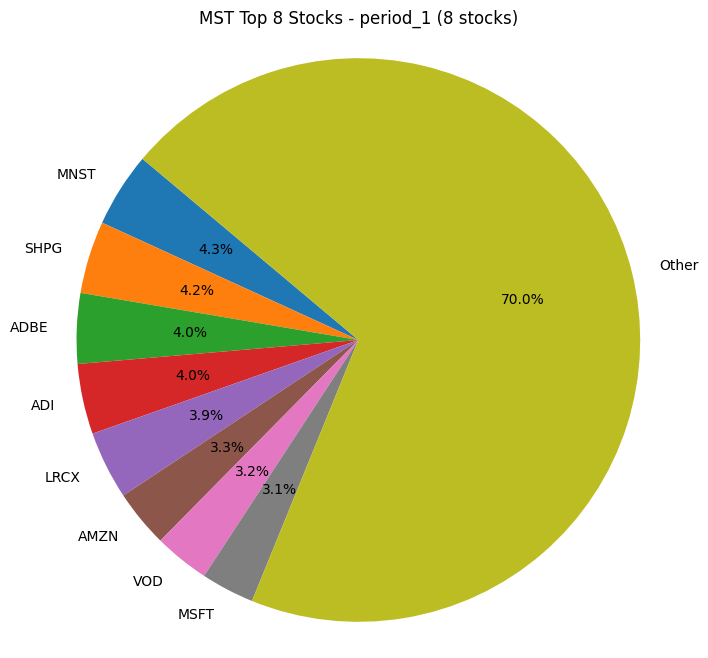

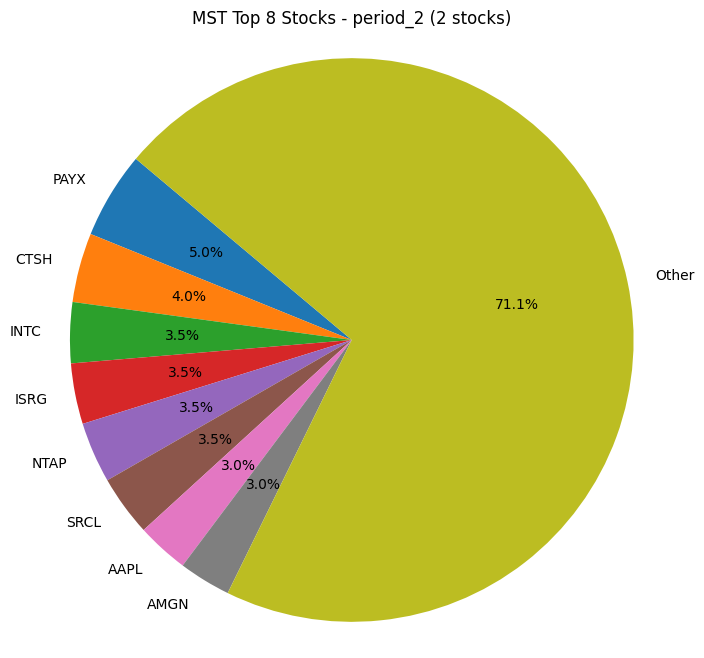

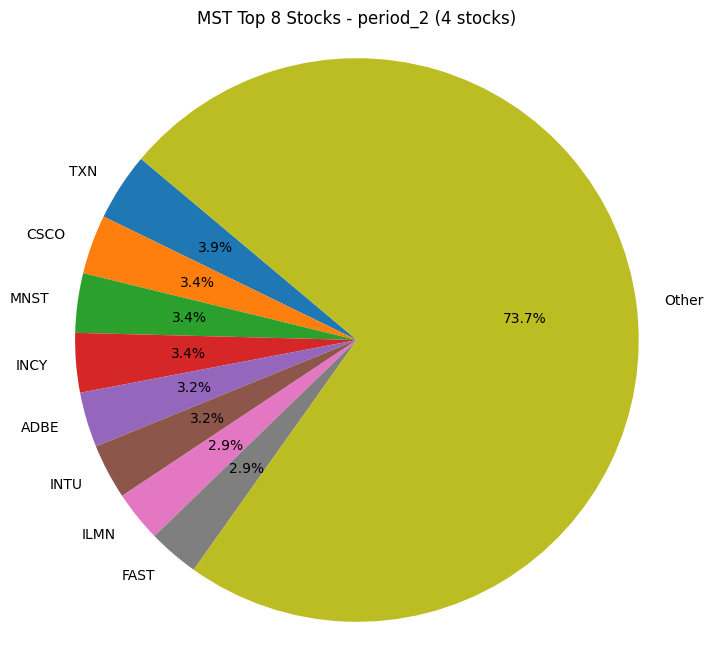

...

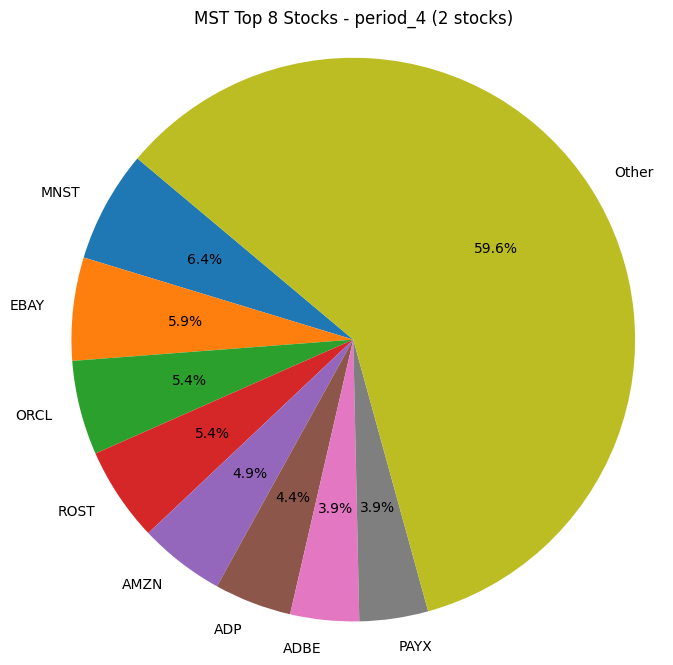

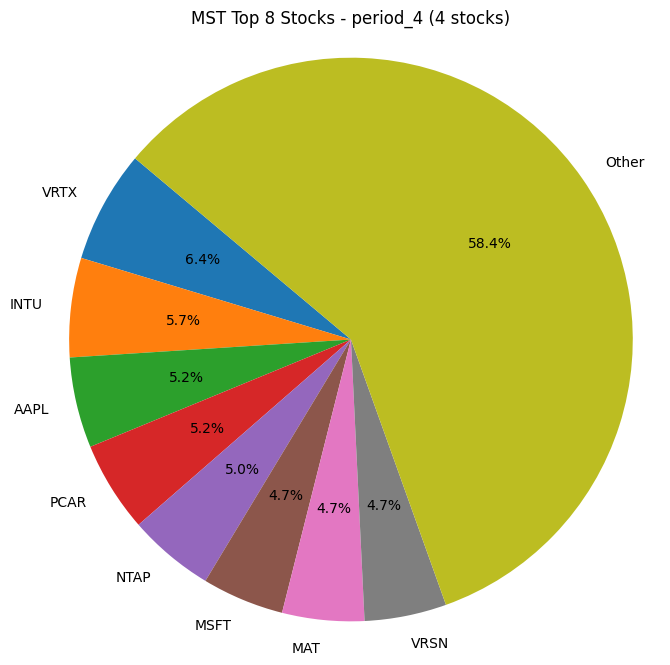

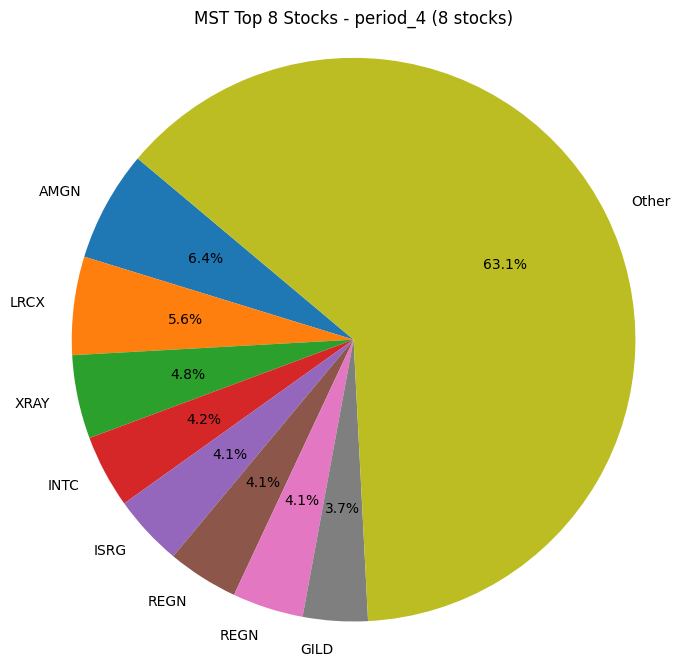

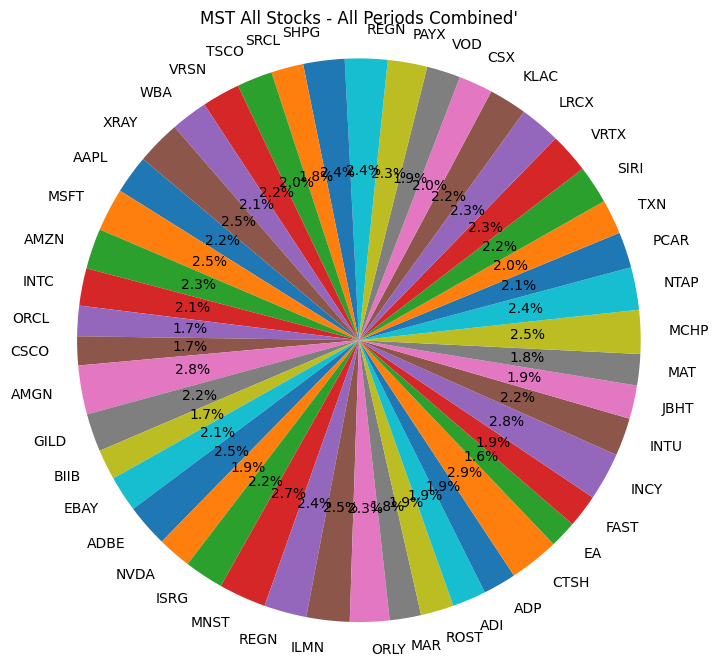

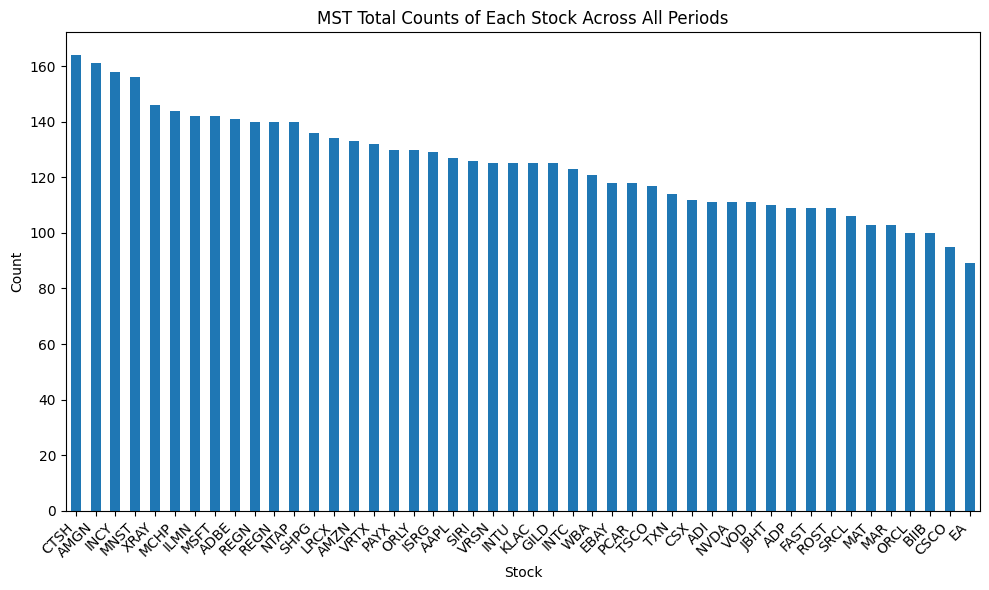

In [487]:
count_of_stocks(mst_result_df_clusters, custom_tickers, "MST")

In [488]:
def plot_metric(metric_name,result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, result_df_MST, name, title):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x + width * 1, random_values, width, label='Random')
    rects2 = ax.bar(x + width * 2, HCT_values, width, label='HCT')
    # rects3 = ax.bar(x + width * 3, kmeans_values, width, label='K-means')
    rects4 = ax.bar(x + width * 3, kmeans_rand_values, width, label='K-means Random')
    rects5 = ax.bar(x + width * 4, MST_values, width, label='MST')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{title} {metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()
    plt.savefig(name)
    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    # print("Total Average " + metric_name + " of K-means Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    averages = {}
    periods = ["Period 1", "Period 2", "Period 3", "Period 4"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        # print(period_label + " Average " + metric_name + " of K-means Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))

        averages[f"{period_label} Random"] = np.mean(random_values[(period_num - 1) * 3:period_num * 3])
        averages[f"{period_label} HCT"] = np.mean(HCT_values[(period_num - 1) * 3:period_num * 3])
        averages[f"{period_label} K-means"] = np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3])
        averages[f"{period_label} K-means Random"] = np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3])
        averages[f"{period_label} MST"] = np.mean(MST_values[(period_num - 1) * 3:period_num * 3])
    average_df = pd.DataFrame(averages, index=[0])
    average_df['Experiment']=f"{title} {metric_name}"
    return average_df


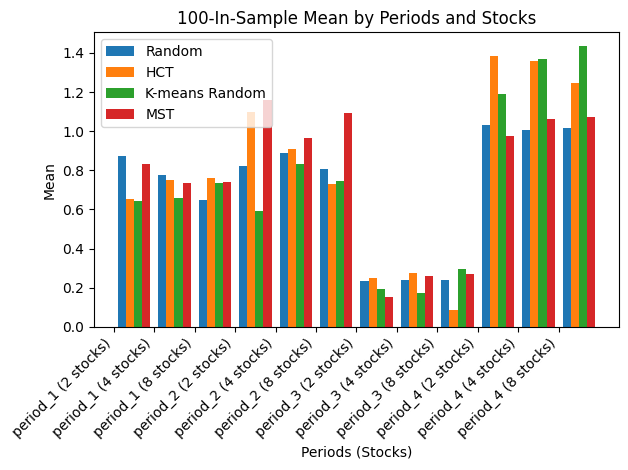

Total Average Mean of Random Values: 0.7152983841105703
Total Average Mean of Cluster Values: 0.7920457545524865
Total Average Mean of K-means Random Values: 0.7380917335730218
Total Average Mean of MST Values: 0.7759365844855832

Period 1 Average Mean of Random Values: 0.7656121343686588
Period 1 Average Mean of Cluster Values: 0.7208295327923412
Period 1 Average Mean of K-means Random Values: 0.6783893133674113
Period 1 Average Mean of MST: 0.7695885036331921
Period 2 Average Mean of Random Values: 0.8401457399772637
Period 2 Average Mean of Cluster Values: 0.9136516975258813
Period 2 Average Mean of K-means Random Values: 0.7227964750215613
Period 2 Average Mean of MST: 1.070570589233905
Period 3 Average Mean of Random Values: 0.23710468392288161
Period 3 Average Mean of Cluster Values: 0.204396978018738
Period 3 Average Mean of K-means Random Values: 0.22092297675463468
Period 3 Average Mean of MST: 0.22817256133162078
Period 4 Average Mean of Random Values: 1.018330978173477
Perio

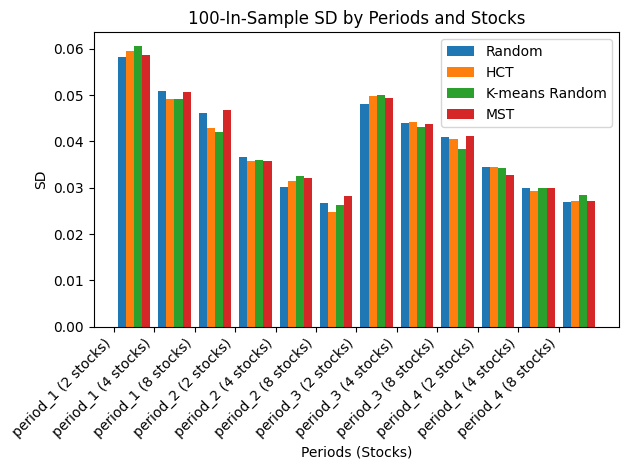

Total Average SD of Random Values: 0.03940444623887583
Total Average SD of Cluster Values: 0.03906172861730887
Total Average SD of K-means Random Values: 0.03920556965064712
Total Average SD of MST Values: 0.03970373446432648

Period 1 Average SD of Random Values: 0.05172341047792541
Period 1 Average SD of Cluster Values: 0.05044455699639408
Period 1 Average SD of K-means Random Values: 0.05055861824580785
Period 1 Average SD of MST: 0.05201586078256457
Period 2 Average SD of Random Values: 0.03112495225338847
Period 2 Average SD of Cluster Values: 0.030616224729037234
Period 2 Average SD of K-means Random Values: 0.03163078912165409
Period 2 Average SD of MST: 0.032049810211123464
Period 3 Average SD of Random Values: 0.04434324033080896
Period 3 Average SD of Cluster Values: 0.04482300200272196
Period 3 Average SD of K-means Random Values: 0.04382632600881608
Period 3 Average SD of MST: 0.044786971295491536
Period 4 Average SD of Random Values: 0.030426181893380467
Period 4 Average S

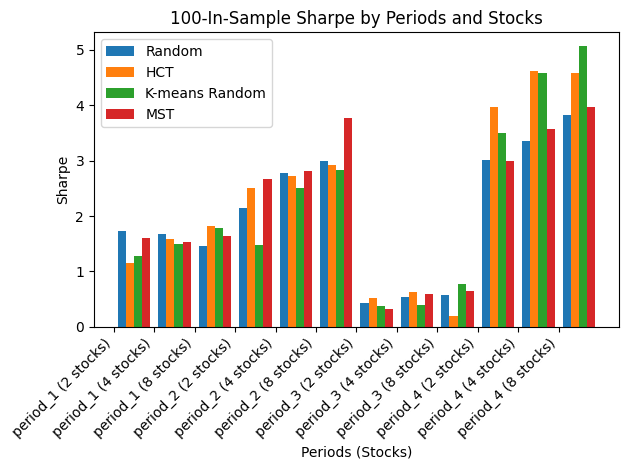

Total Average Sharpe of Random Values: 2.04548519244006
Total Average Sharpe of Cluster Values: 2.27114451914951
Total Average Sharpe of K-means Random Values: 2.171216938967964
Total Average Sharpe of MST Values: 2.175797215539529

Period 1 Average Sharpe of Random Values: 1.6238571003798823
Period 1 Average Sharpe of Cluster Values: 1.5259208717652923
Period 1 Average Sharpe of K-means Random Values: 1.5218900070714925
Period 1 Average Sharpe of MST: 1.5925197623692522
Period 2 Average Sharpe of Random Values: 2.640706504697008
Period 2 Average Sharpe of Cluster Values: 2.7191472644894863
Period 2 Average Sharpe of K-means Random Values: 2.2725224875298444
Period 2 Average Sharpe of MST: 3.079261068519306
Period 3 Average Sharpe of Random Values: 0.5188631938989826
Period 3 Average Sharpe of Cluster Values: 0.4512482224297929
Period 3 Average Sharpe of K-means Random Values: 0.5107454680997132
Period 3 Average Sharpe of MST: 0.5194644877161477
Period 4 Average Sharpe of Random Values

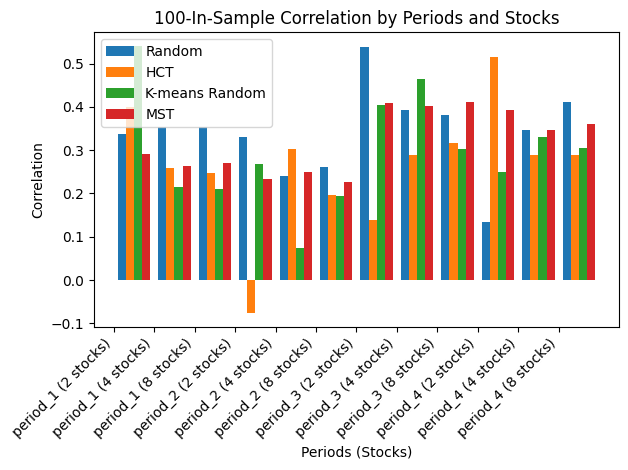

Total Average Correlation of Random Values: 0.34006961241448486
Total Average Correlation of Cluster Values: 0.2641502749280395
Total Average Correlation of K-means Random Values: 0.2965547612403901
Total Average Correlation of MST Values: 0.3208898957794482

Period 1 Average Correlation of Random Values: 0.3483346340320235
Period 1 Average Correlation of Cluster Values: 0.30260722777851823
Period 1 Average Correlation of K-means Random Values: 0.3224635346425391
Period 1 Average Correlation of MST: 0.2744027908693554
Period 2 Average Correlation of Random Values: 0.27716187581368223
Period 2 Average Correlation of Cluster Values: 0.1408319925444259
Period 2 Average Correlation of K-means Random Values: 0.1786626018607862
Period 2 Average Correlation of MST: 0.23603458607409378
Period 3 Average Correlation of Random Values: 0.43726288511182915
Period 3 Average Correlation of Cluster Values: 0.2487310948825745
Period 3 Average Correlation of K-means Random Values: 0.39028980827061854
Pe

,Experiment,Period 1 Random,Period 1 HCT,Period 1 K-means,Period 1 K-means Random,Period 1 MST,Period 2 Random,Period 2 HCT,Period 2 K-means,Period 2 K-means Random,...,Period 3 Random,Period 3 HCT,Period 3 K-means,Period 3 K-means Random,Period 3 MST,Period 4 Random,Period 4 HCT,Period 4 K-means,Period 4 K-means Random,Period 4 MST
0,100-In-Sample Mean,0.765612,0.720830,0.922613,0.678389,0.769589,0.840146,0.913652,0.820877,0.722796,...,0.237105,0.204397,0.700255,0.220923,0.228173,1.018331,1.329305,1.410919,1.330258,1.035415
0,100-In-Sample SD,0.051723,0.050445,0.058394,0.050559,0.052016,0.031125,0.030616,0.028278,0.031631,...,0.044343,0.044823,0.049844,0.043826,0.044787,0.030426,0.030363,0.029615,0.030807,0.029962
0,100-In-Sample Sharpe,1.623857,1.525921,1.961089,1.521890,1.592520,2.640707,2.719147,2.754440,2.272522,...,0.518863,0.451248,1.400203,0.510745,0.519464,3.398514,4.388262,4.824779,4.379710,3.511944
0,100-In-Sample Correlation,0.348335,0.302607,0.267788,0.322464,0.274403,0.277162,0.140832,0.321034,0.178663,...,0.437263,0.248731,0.405308,0.390290,0.407107,0.297519,0.364431,0.333985,0.294803,0.366015


In [489]:
# Plotting Mean
in_means = plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters, "mean_in_sample_100.png", "100-In-Sample")

# Plotting SD
in_sd = plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters, "sd_in_sample_100.png", "100-In-Sample")

# Plotting Sharpe
in_sharpe = plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters, "sharpe_in_sample_100.png", "100-In-Sample")

# Plotting Correlation
in_corr = plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans,result_df_kmeans_rand, mst_result_df_clusters, "corr_in_sample_100.png", "100-In-Sample")

in_df = pd.DataFrame()
print(in_means)
for d in [in_means, in_sd, in_sharpe, in_corr]:
    in_df = pd.concat([in_df,d])
first_column = in_df.pop('Experiment') 
  
# insert column using insert(position,column_name,first_column) function 
in_df.insert(0, 'Experiment', first_column) 
in_df

In [490]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

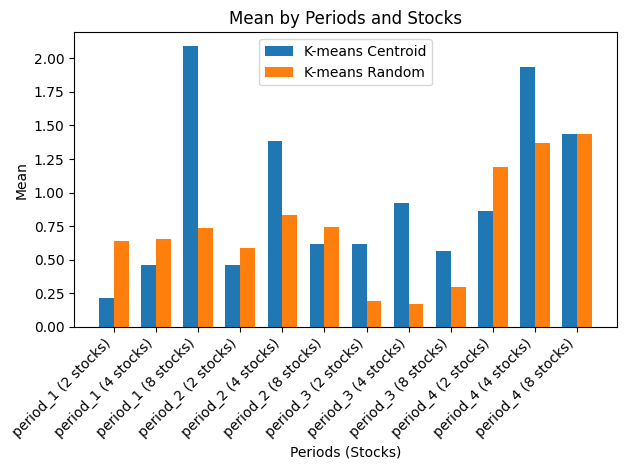

Total Average Mean of K-means Centroid Values: 0.9636658094137306
Total Average Mean of K-means Random Values: 0.7380917335730218

Period 1 Average Mean of K-means Centroid Values: 0.9226130800765485
Period 1 Average Mean of K-means Random Values: 0.6783893133674113
Period 2 Average Mean of K-means Centroid Values: 0.8208765630963715
Period 2 Average Mean of K-means Random Values: 0.7227964750215613
Period 3 Average Mean of K-means Centroid Values: 0.7002545855229565
Period 3 Average Mean of K-means Random Values: 0.22092297675463468


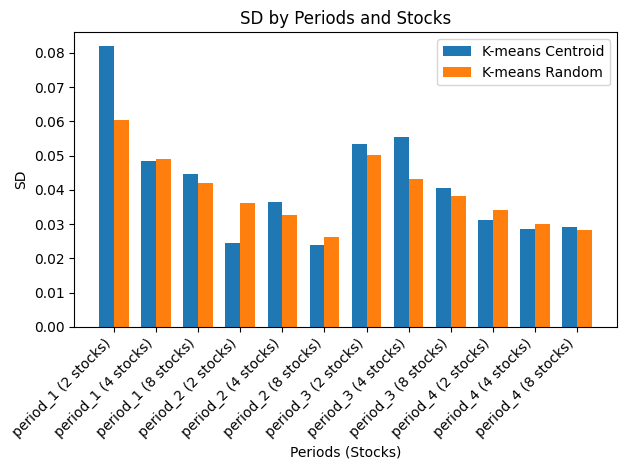

Total Average SD of K-means Centroid Values: 0.0415328465174666
Total Average SD of K-means Random Values: 0.03920556965064712

Period 1 Average SD of K-means Centroid Values: 0.058394248655085544
Period 1 Average SD of K-means Random Values: 0.05055861824580785
Period 2 Average SD of K-means Centroid Values: 0.02827795943318986
Period 2 Average SD of K-means Random Values: 0.03163078912165409
Period 3 Average SD of K-means Centroid Values: 0.04984428450472878
Period 3 Average SD of K-means Random Values: 0.04382632600881608


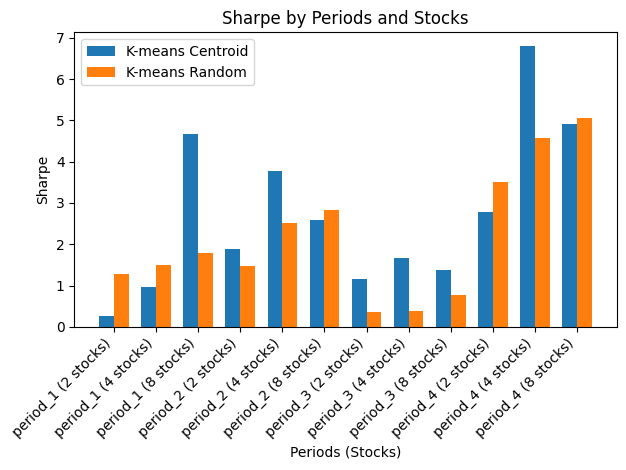

Total Average Sharpe of K-means Centroid Values: 2.735127668091163
Total Average Sharpe of K-means Random Values: 2.171216938967964

Period 1 Average Sharpe of K-means Centroid Values: 1.9610888016774934
Period 1 Average Sharpe of K-means Random Values: 1.5218900070714925
Period 2 Average Sharpe of K-means Centroid Values: 2.7544403717099617
Period 2 Average Sharpe of K-means Random Values: 2.2725224875298444
Period 3 Average Sharpe of K-means Centroid Values: 1.4002026598694972
Period 3 Average Sharpe of K-means Random Values: 0.5107454680997132


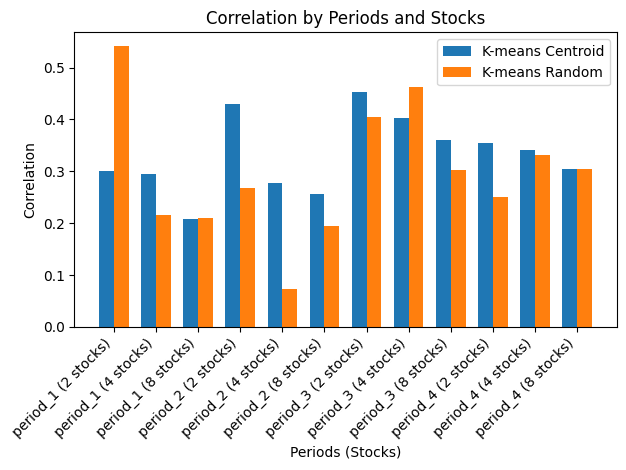

Total Average Correlation of K-means Centroid Values: 0.33202894929602905
Total Average Correlation of K-means Random Values: 0.2965547612403901

Period 1 Average Correlation of K-means Centroid Values: 0.26778780233575133
Period 1 Average Correlation of K-means Random Values: 0.3224635346425391
Period 2 Average Correlation of K-means Centroid Values: 0.32103448405636975
Period 2 Average Correlation of K-means Random Values: 0.1786626018607862
Period 3 Average Correlation of K-means Centroid Values: 0.40530839916010913
Period 3 Average Correlation of K-means Random Values: 0.39028980827061854


In [491]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

### Analyze Performance in the next period

In [492]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [493]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.937721,0.036204,2.257414,0.234657,"[ILMN, KLAC, ADP, SIRI, MCHP, EBAY, AMGN, ROST..."
period_2 (4 stocks),0.856679,0.030567,2.681989,0.236872,"[NVDA, REGN, CTSH, INTC, PAYX, MCHP, VRTX, ILM..."
period_2 (8 stocks),0.835812,0.026830,3.070872,0.238305,"[ISRG, AMGN, PAYX, SRCL, JBHT, LRCX, EA, ADBE,..."
period_3 (2 stocks),0.174651,0.049997,0.342864,0.408739,"[VRTX, FAST, GILD, CSCO, INTC, GILD, VRTX, PAY..."
period_3 (4 stocks),0.237544,0.044406,0.531855,0.408315,"[ROST, MAR, CSX, BIIB, VRTX, AAPL, ISRG, CSCO,..."
period_3 (8 stocks),0.226170,0.040482,0.557284,0.406809,"[NTAP, NVDA, EBAY, ADP, INTC, AMZN, ADI, ADBE,..."
period_4 (2 stocks),1.069625,0.033676,3.139048,0.375101,"[MSFT, VRSN, TSCO, JBHT, FAST, VOD, MSFT, JBHT..."
period_4 (4 stocks),1.009948,0.029440,3.453679,0.370152,"[VRTX, EA, AAPL, AMGN, AMZN, ORCL, AMGN, MCHP,..."
period_4 (8 stocks),1.021239,0.026893,3.821926,0.369915,"[INTC, REGN, ADI, ADP, INCY, KLAC, PCAR, EA, V..."


In [494]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [495]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.817013,0.037009,1.873791,0.236894,"[XRAY, INTC, ISRG, NVDA, EA, TXN, CSX, ADBE, I..."
period_2 (4 stocks),0.888338,0.029227,2.864438,0.229677,"[INTU, ADBE, WBA, PCAR, SIRI, NVDA, MNST, PAYX..."
period_2 (8 stocks),0.773271,0.025685,2.945293,0.218947,"[VOD, VRSN, INTC, AMGN, INCY, SHPG, TSCO, JBHT..."
period_3 (2 stocks),0.169707,0.049557,0.348924,0.353518,"[VOD, FAST, AAPL, XRAY, SRCL, ROST, SIRI, TXN,..."
period_3 (4 stocks),0.254825,0.044287,0.571590,0.380576,"[SIRI, GILD, VRSN, LRCX, AMGN, REGN, JBHT, CSC..."
period_3 (8 stocks),0.181525,0.038965,0.461424,0.382574,"[ILMN, REGN, PAYX, ADI, ORCL, ADBE, EA, SRCL, ..."
period_4 (2 stocks),1.110895,0.034057,3.269337,0.320802,"[NVDA, ILMN, MAR, BIIB, EA, XRAY, FAST, REGN, ..."
period_4 (4 stocks),1.207053,0.029402,4.110543,0.322673,"[CSX, XRAY, NVDA, AMGN, INTU, GILD, INTC, SRCL..."
period_4 (8 stocks),1.341964,0.025796,5.207273,0.307595,"[EBAY, REGN, KLAC, CTSH, AMGN, SRCL, ROST, SIR..."


In [496]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.963327,0.037544,2.216806,0.235195,"[WBA, NVDA, FAST, ADBE, SRCL, AAPL, SIRI, TXN,..."
period_2 (4 stocks),0.990160,0.031781,2.953053,0.212930,"[SHPG, AMZN, FAST, REGN, VRSN, EBAY, ADP, VOD,..."
period_2 (8 stocks),1.499579,0.029025,5.172131,0.194939,"[ORCL, PCAR, ORLY, KLAC, INCY, WBA, AMZN, MNST..."
period_3 (2 stocks),0.178377,0.049872,0.348102,0.414012,"[TSCO, SIRI, ORCL, INCY, TSCO, AAPL, CTSH, WBA..."
period_3 (4 stocks),0.253352,0.045142,0.558334,0.391759,"[MAT, JBHT, LRCX, VRTX, MNST, MSFT, ADI, SIRI,..."
period_3 (8 stocks),0.253867,0.040377,0.626177,0.386706,"[ILMN, MAR, ORCL, BIIB, AMGN, AMZN, ADP, SRCL,..."
period_4 (2 stocks),1.229503,0.034169,3.547118,0.326447,"[BIIB, EBAY, EA, ADP, INCY, CSX, EA, PCAR, WBA..."
period_4 (4 stocks),1.093290,0.029991,3.635254,0.350567,"[AMZN, ILMN, MAR, TXN, AAPL, BIIB, ADBE, MCHP,..."
period_4 (8 stocks),1.404876,0.025350,5.508496,0.298574,"[AMGN, PAYX, ILMN, EA, MCHP, ORLY, VRTX, WBA, ..."


In [497]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [498]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),1.563977,0.045420,3.443404,0.272366,"[ILMN, MSFT]"
period_2 (4 stocks),0.323731,0.030135,1.074267,0.231754,"[ORLY, MSFT, JBHT, INCY]"
period_2 (8 stocks),1.400496,0.029002,4.829007,0.183702,"[TSCO, JBHT, ORLY, INTC, ILMN, AMGN, AMZN, MNST]"
period_3 (2 stocks),-0.029119,0.046845,-0.062162,0.584274,"[PCAR, ADP]"
period_3 (4 stocks),0.199884,0.051913,0.385032,0.411452,"[MAT, FAST, NVDA, VRTX]"
period_3 (8 stocks),0.095932,0.038894,0.246652,0.431924,"[MAT, FAST, NVDA, MSFT, SHPG, EBAY, ADP, ORLY]"
period_4 (2 stocks),1.750491,0.037098,4.718523,0.127884,"[ILMN, ROST]"
period_4 (4 stocks),0.899328,0.033054,2.720818,0.257383,"[ISRG, ILMN, ROST, NVDA]"
period_4 (8 stocks),1.602724,0.026932,5.951021,0.274370,"[AMGN, ADP, ILMN, ISRG, ORCL, INTU, VRTX, REGN]"


In [499]:
#result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
#result_df_MST

#CLUSTERS

import pandas as pd
import numpy as np

def calculate_metrics_for_mst_clusters_out_sample(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100
    
    for period, cluster_stocks in all_cluster_stocks.items():
        period_number = int(period[-1])
        if period_number == 4: #last period
            break
        else:
            next_period = 'period_'+str(period_number+1)
        
        next_returns_data = period_dfs[next_period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        #print(returns_data)
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            #print(cluster_lists)
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                portfolio_return_stocks = next_returns_data[selected_stocks].mean(axis=1)
                
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = next_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            average_correlation = np.mean(correlations)
            
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': average_correlation, "Stocks" : final_stocks_list}
            #print()
        results_by_period[next_period] = results_by_cluster

        dfs = []
        for period, results_by_cluster in results_by_period.items():
            for num_clusters, metrics in results_by_cluster.items():
                df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
                dfs.append(df)

        mst_result_df_clusters = pd.concat(dfs)

    return results_by_period, mst_result_df_clusters



mst_results_by_period_out_sample, mst_result_df_clusters_out_sample = calculate_metrics_for_mst_clusters_out_sample(mst_all_cluster_stocks, period_dfs)
mst_result_df_clusters_out_sample


,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),1.000176,0.036059,2.349408,0.252384,"[FAST, XRAY, KLAC, MNST, MAT, BIIB, SIRI, MAR,..."
period_2 (4 stocks),0.926086,0.031189,2.752633,0.235724,"[SIRI, ROST, VRTX, WBA, AAPL, LRCX, BIIB, KLAC..."
period_2 (8 stocks),0.937805,0.027330,3.401438,0.228201,"[GILD, LRCX, AMZN, BIIB, EA, INTC, ROST, MSFT,..."
period_3 (2 stocks),0.171878,0.048780,0.327695,0.434997,"[XRAY, TXN, FAST, VRTX, REGN, MCHP, SIRI, AMGN..."
period_3 (4 stocks),0.169237,0.043955,0.382003,0.409793,"[CTSH, MCHP, AMZN, PCAR, ORLY, ADBE, PAYX, REG..."
period_3 (8 stocks),0.288202,0.041343,0.699507,0.398085,"[VOD, AMGN, CTSH, SRCL, AMZN, INTU, JBHT, ILMN..."
period_4 (2 stocks),0.950323,0.033513,2.908937,0.384904,"[MSFT, AMZN, TXN, MAR, VRSN, SHPG, SIRI, ROST,..."
period_4 (4 stocks),1.073190,0.029445,3.658572,0.369260,"[VOD, PAYX, ILMN, INTC, MNST, VRTX, CSCO, TSCO..."
period_4 (8 stocks),1.071050,0.027059,3.995447,0.377706,"[VOD, ROST, EA, CSX, REGN, CTSH, TSCO, SIRI, A..."


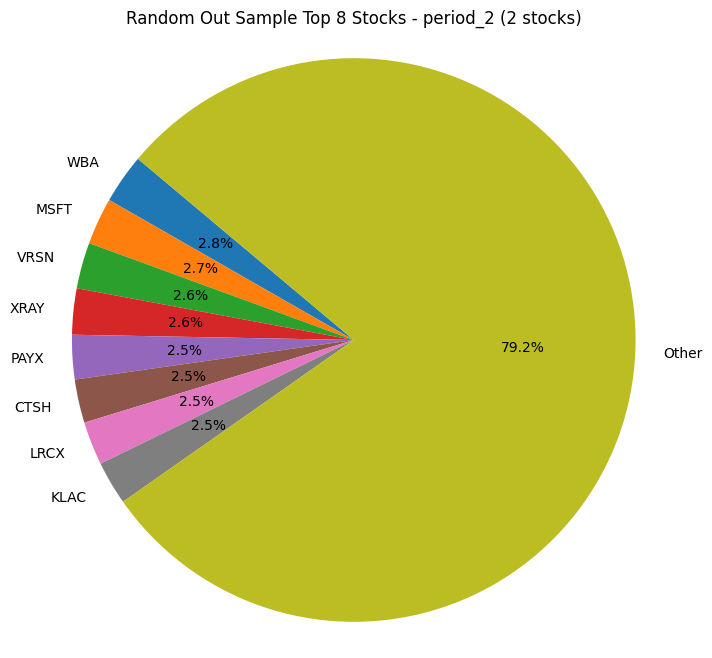

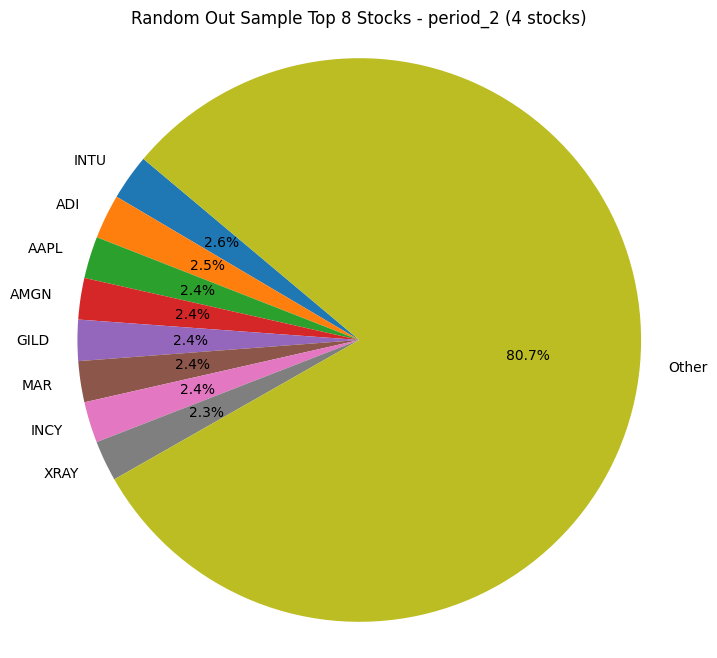

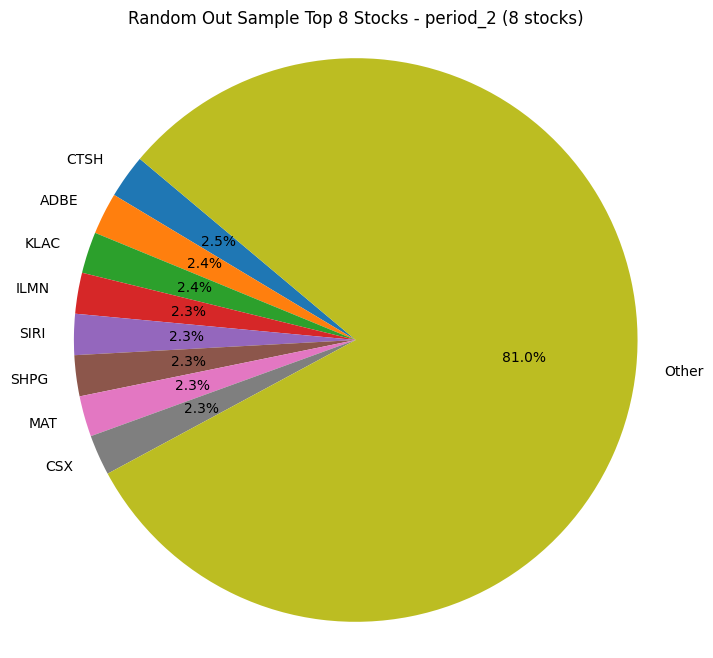

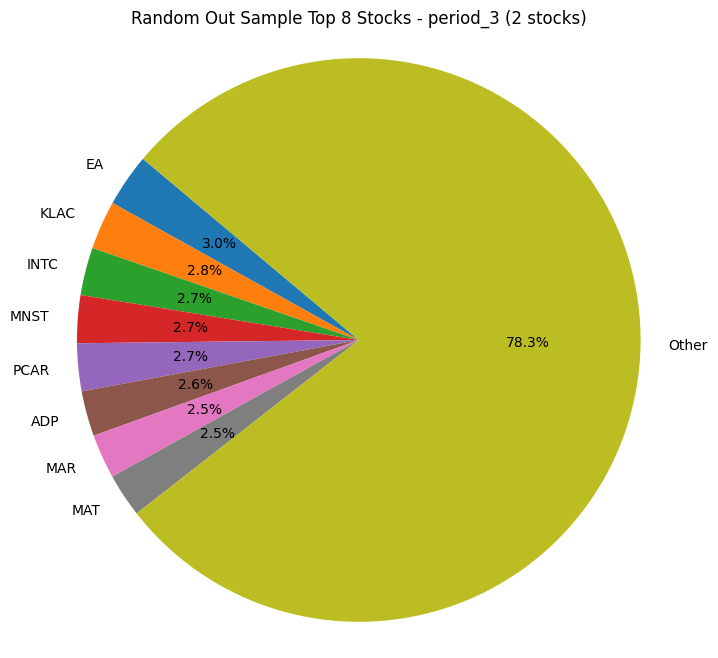

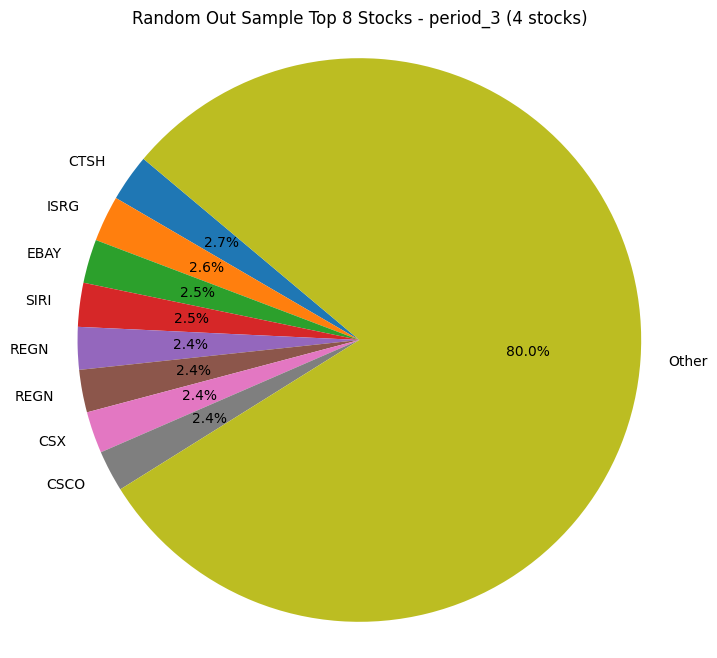

...

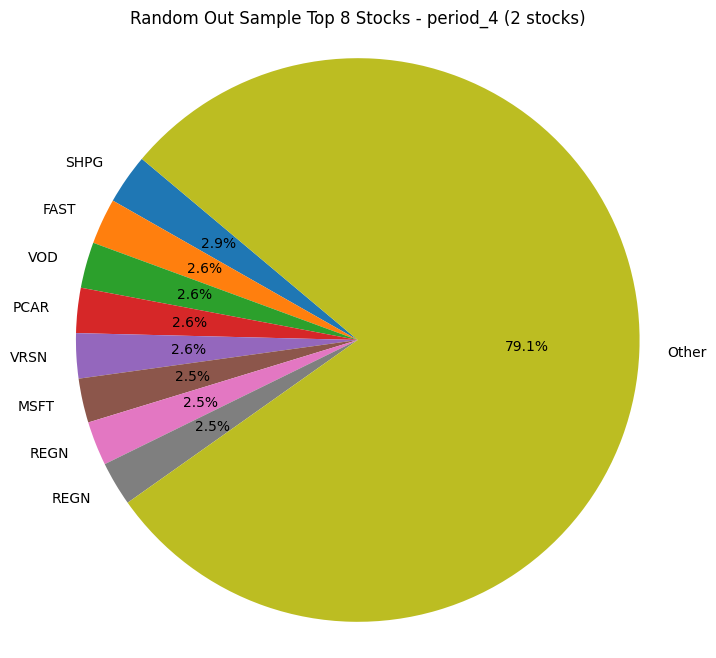

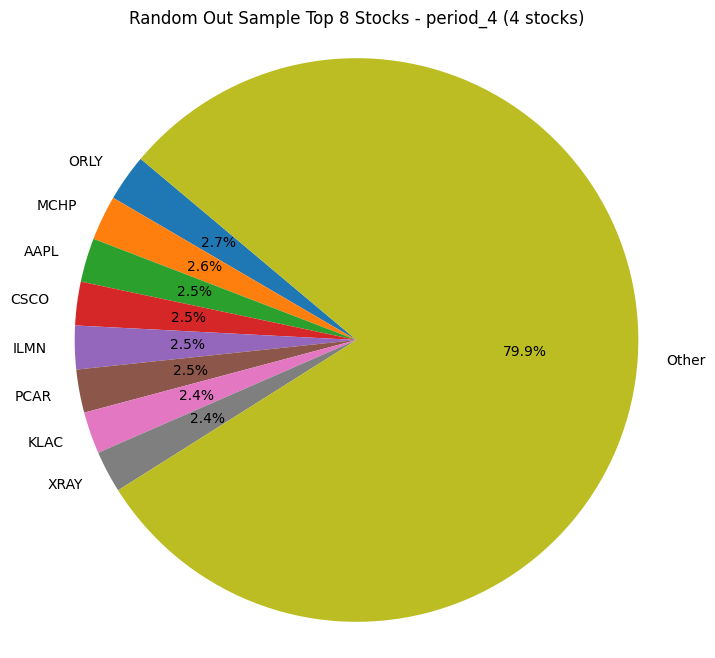

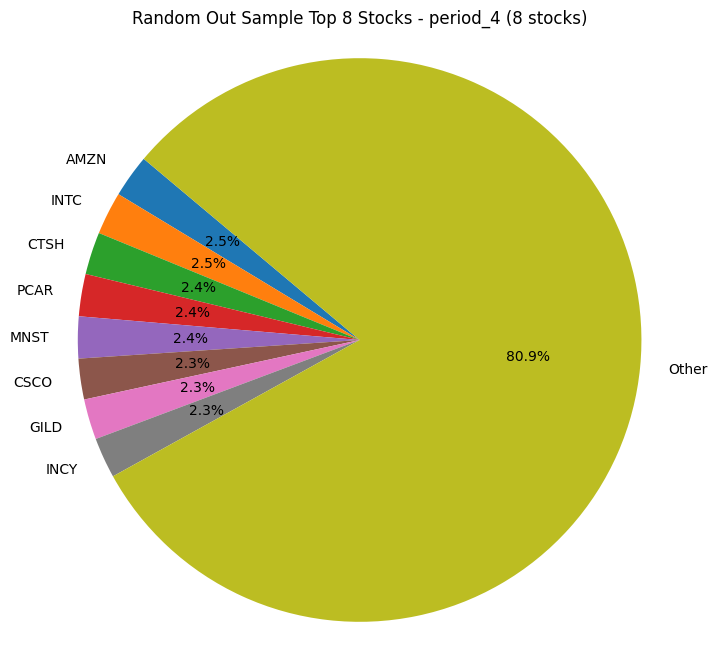

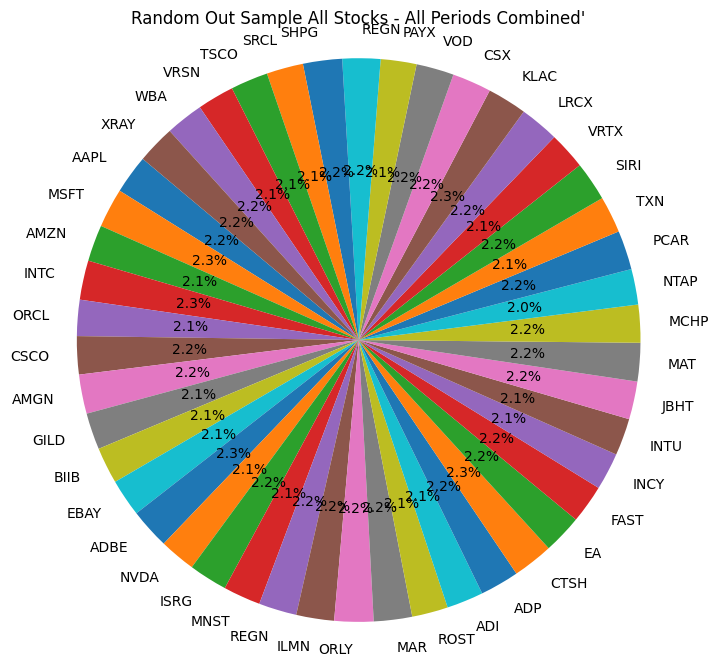

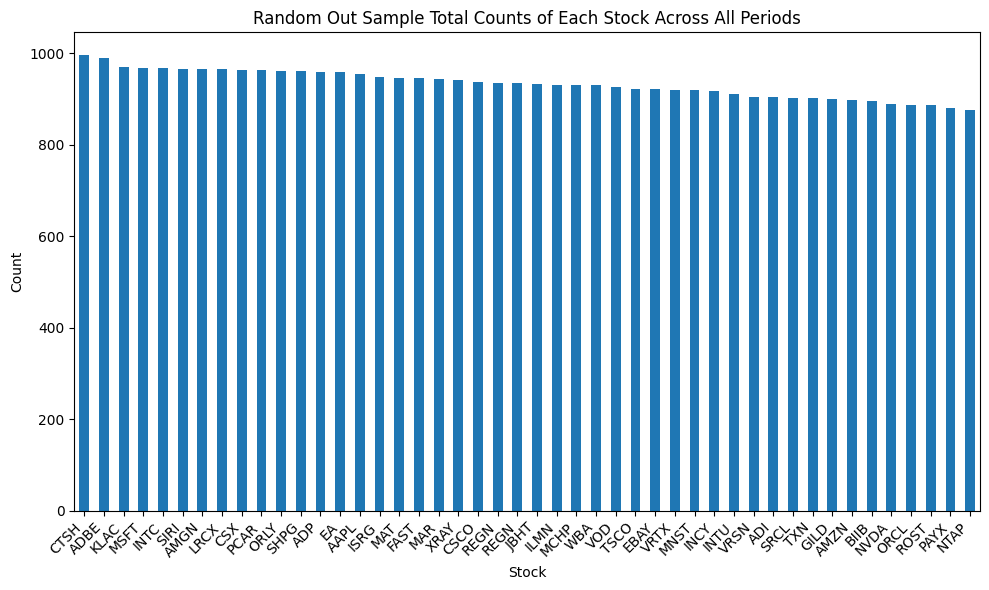

In [500]:
count_of_stocks(result_df_random_test1, custom_tickers, "Random Out Sample")

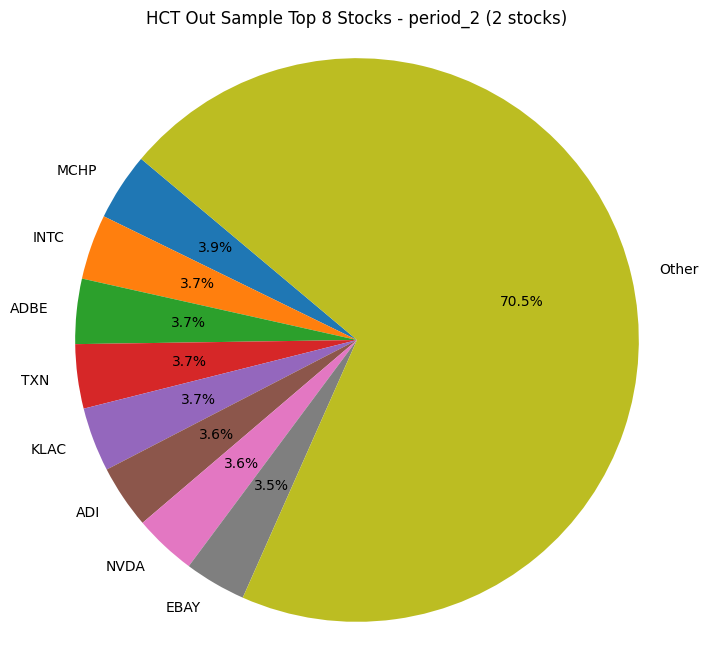

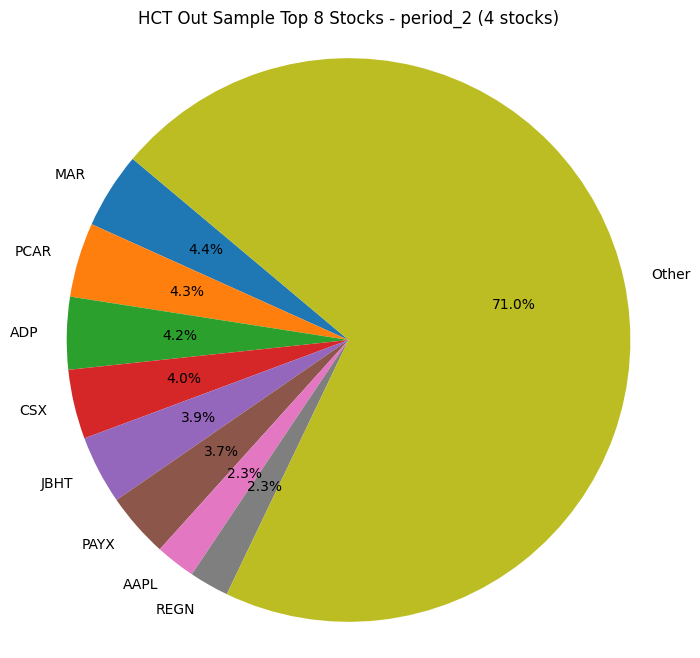

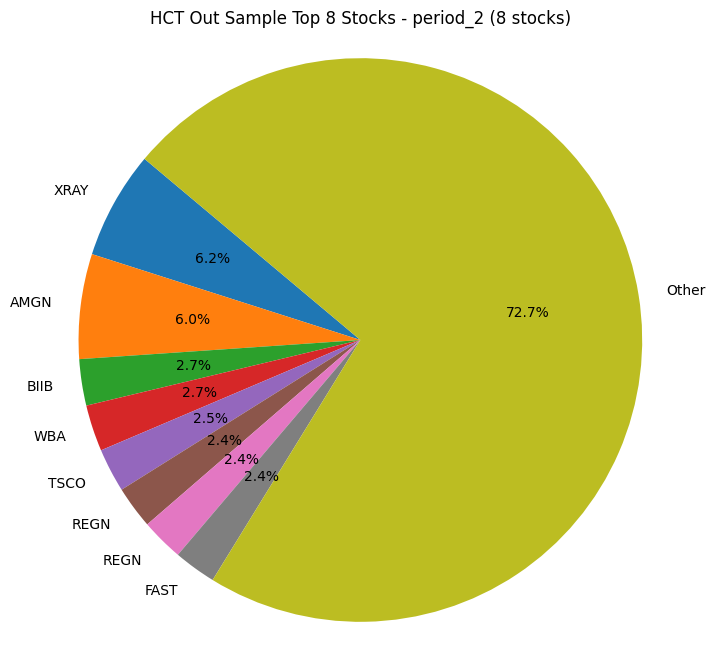

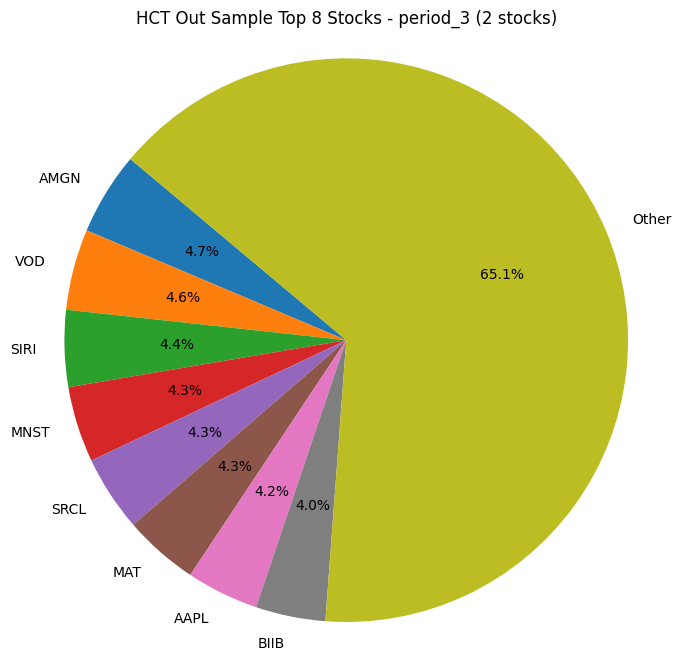

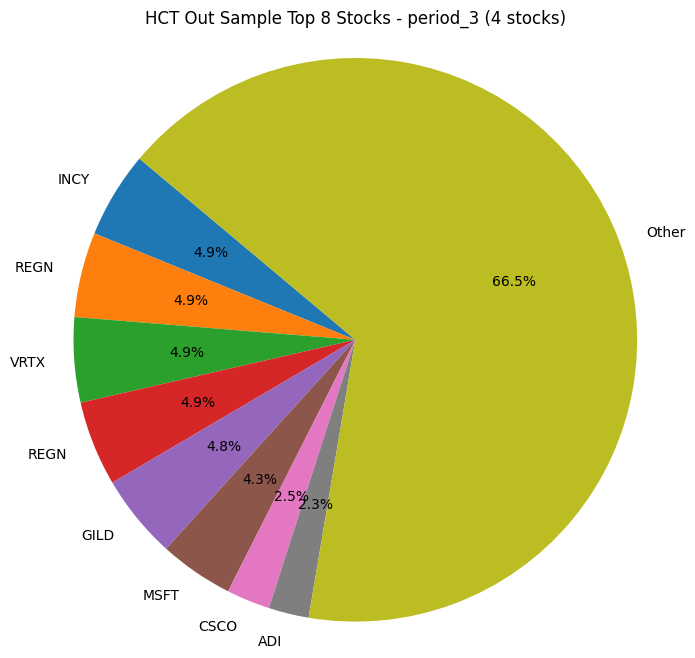

...

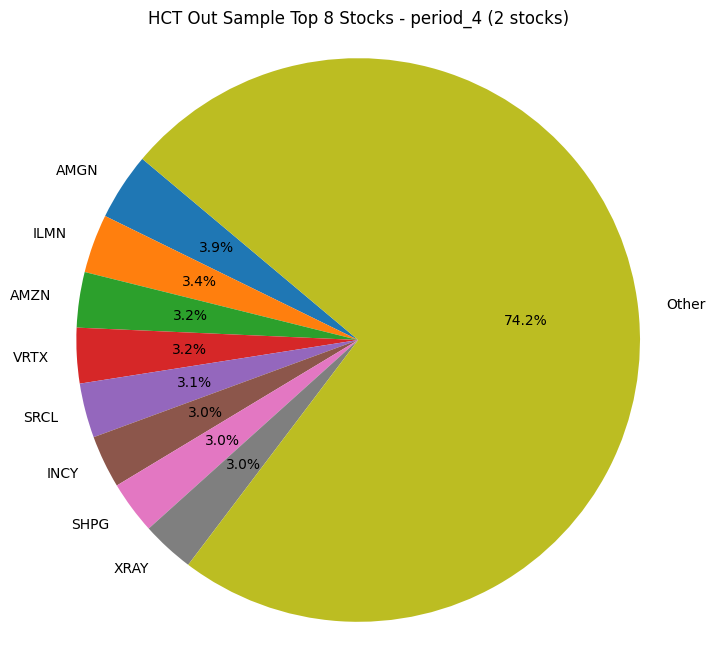

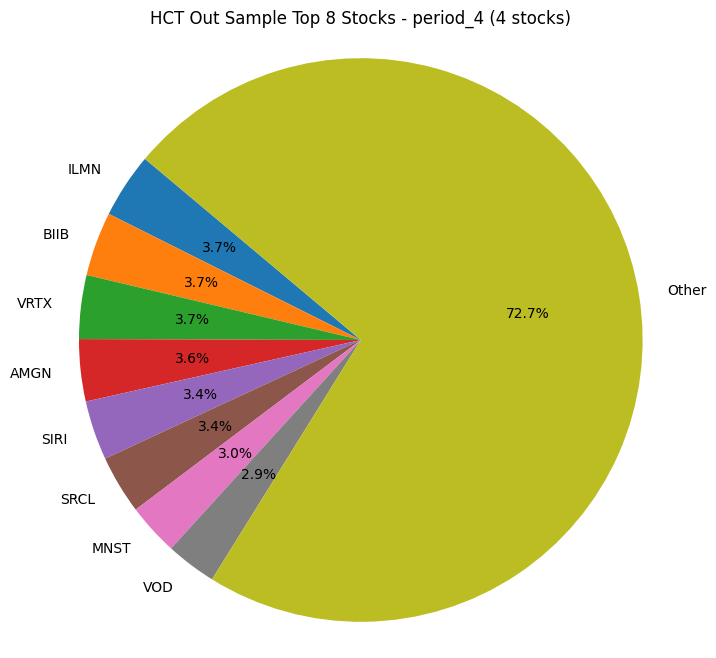

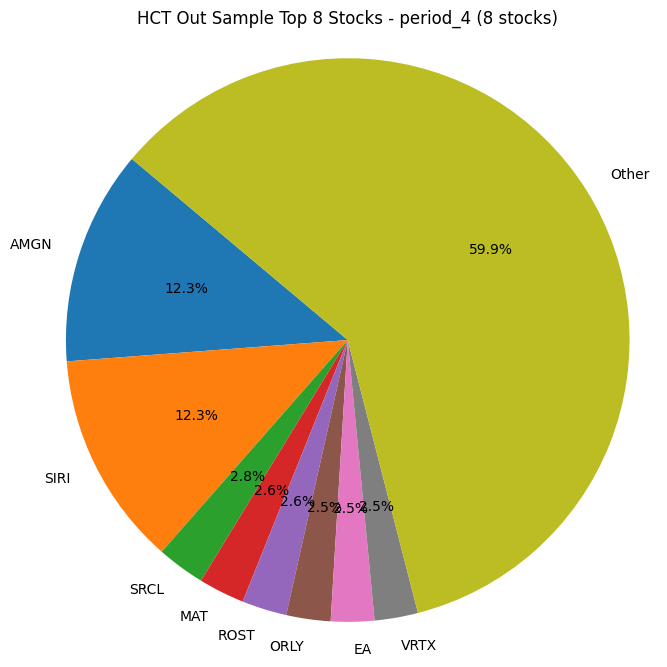

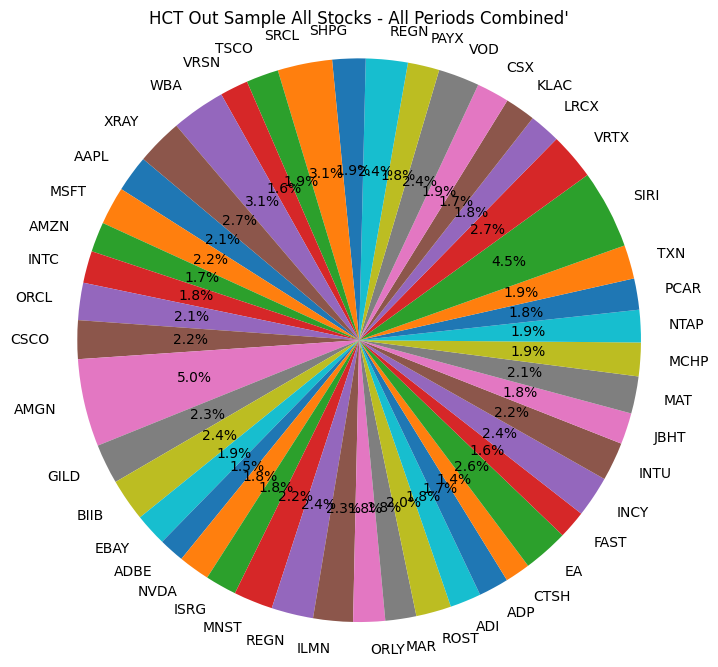

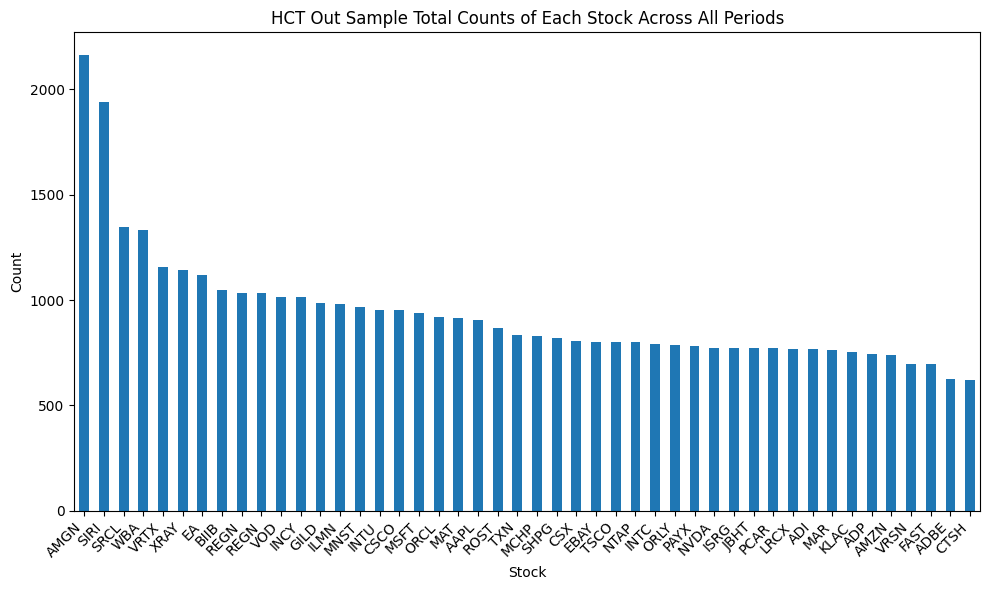

In [501]:
count_of_stocks(result_df_HCT_test1, custom_tickers, "HCT Out Sample")

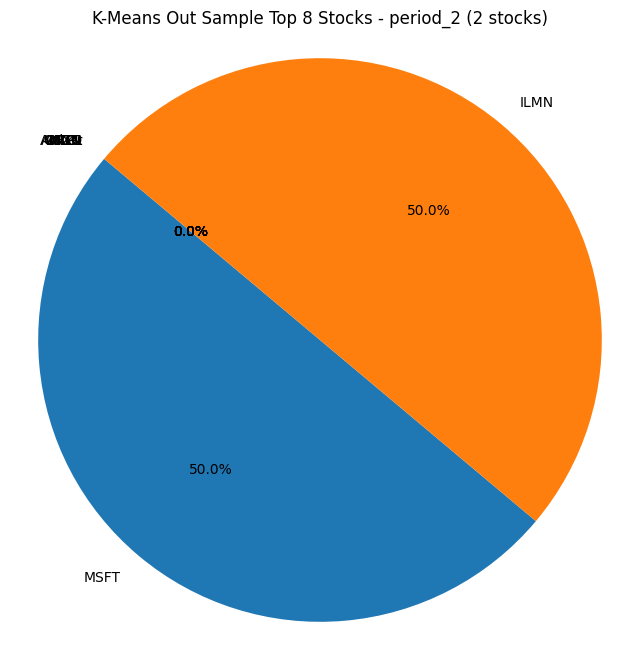

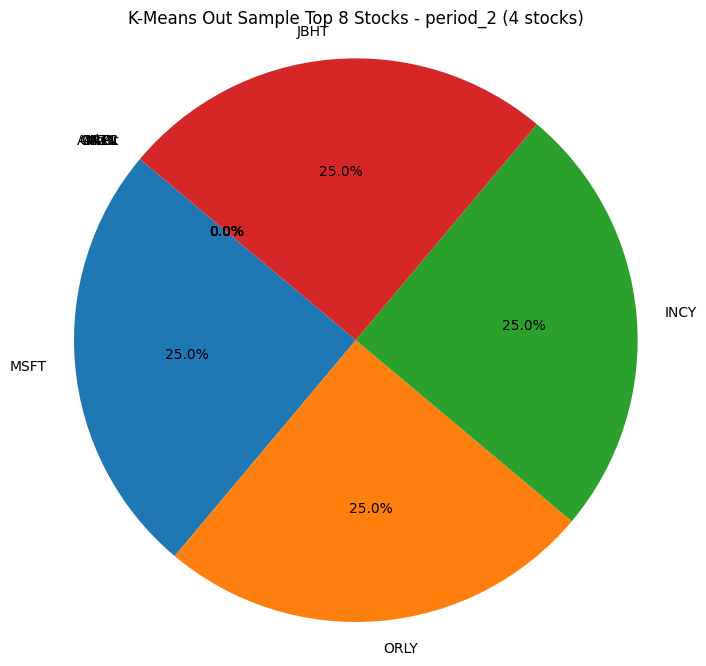

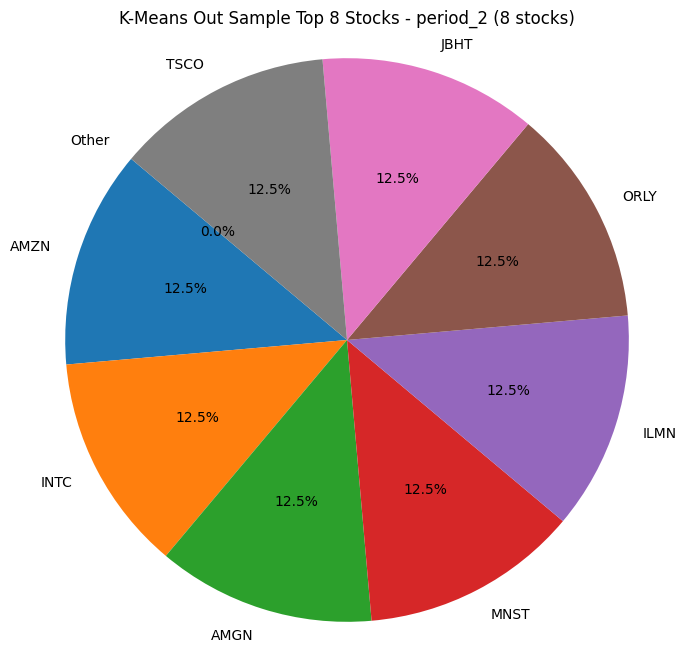

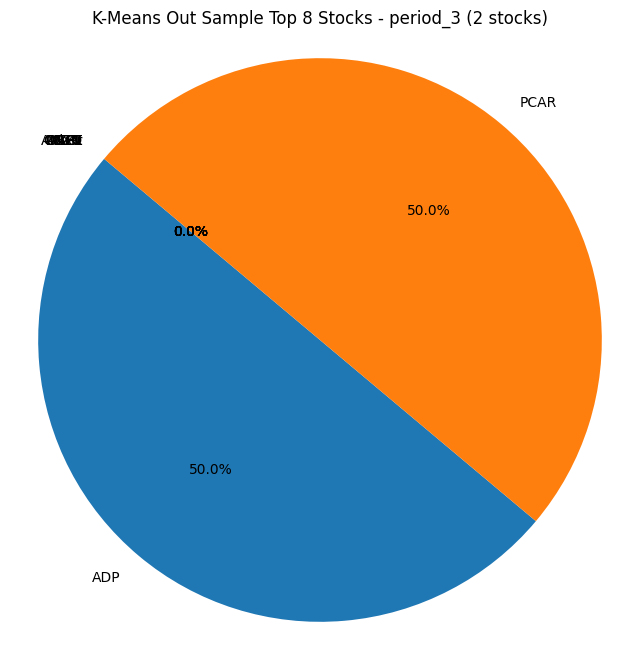

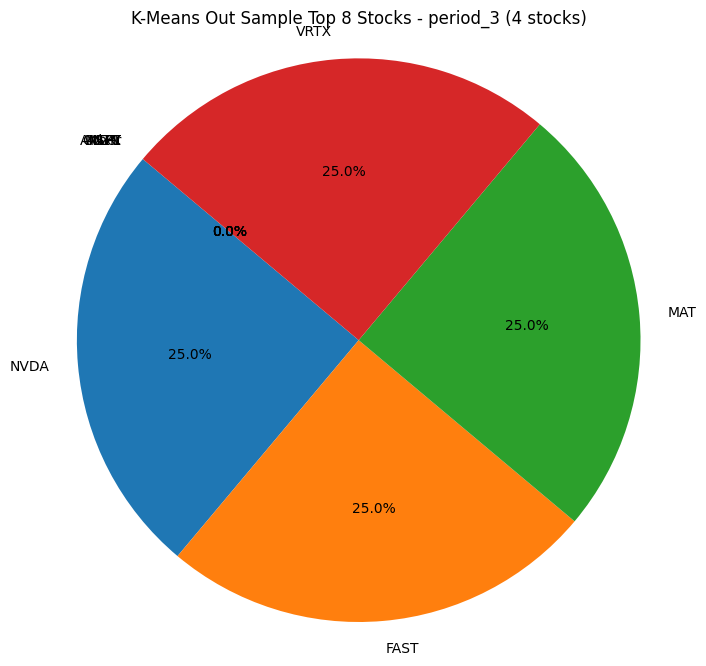

...

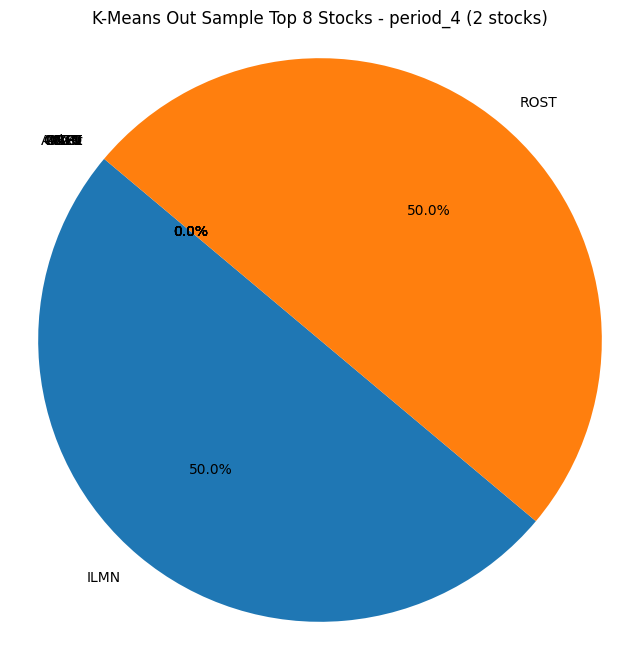

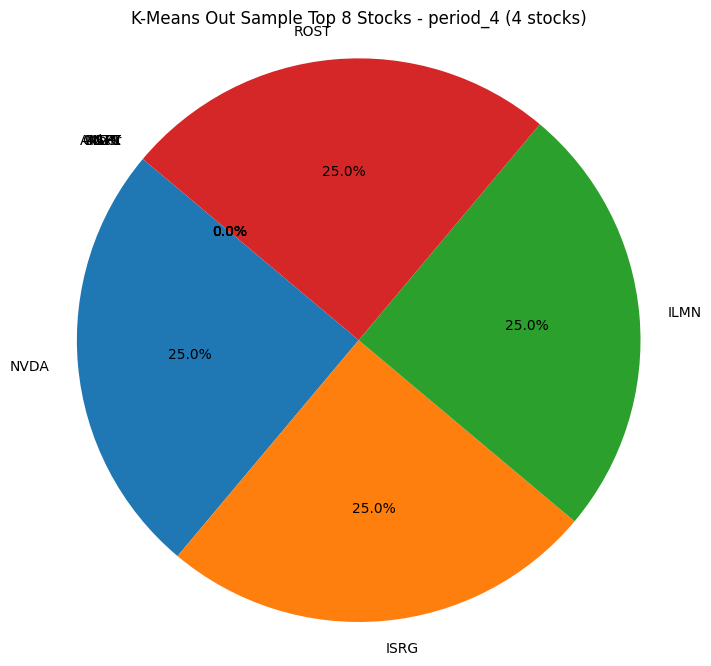

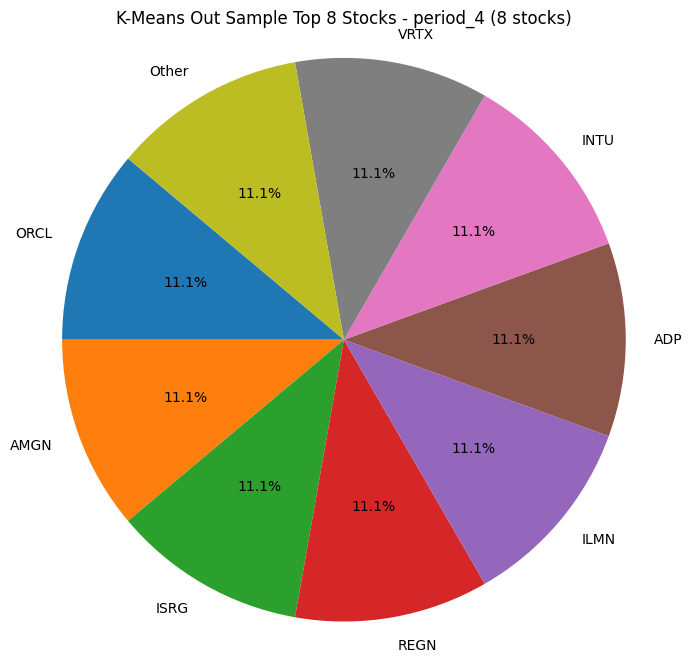

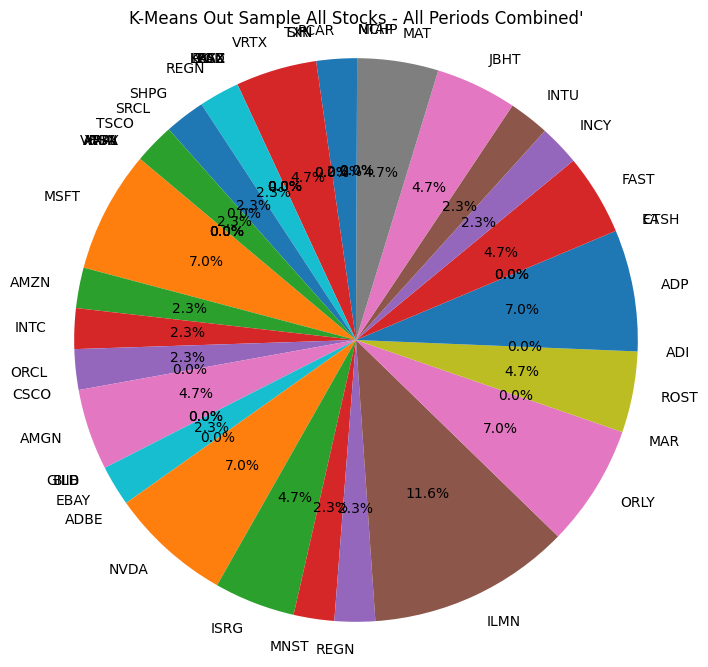

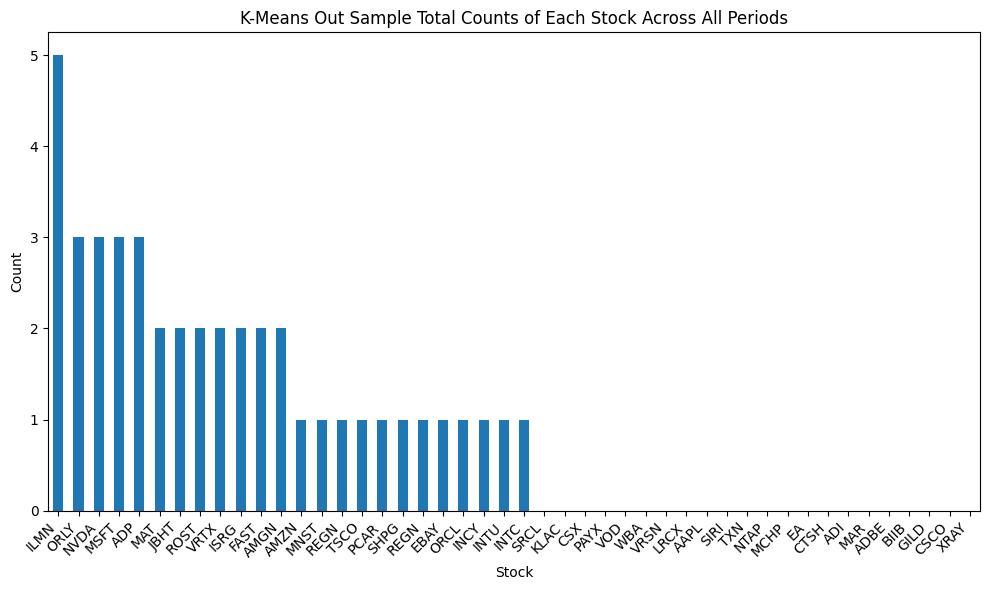

In [502]:
count_of_stocks(result_df_kmeans_test1, custom_tickers, "K-Means Out Sample")

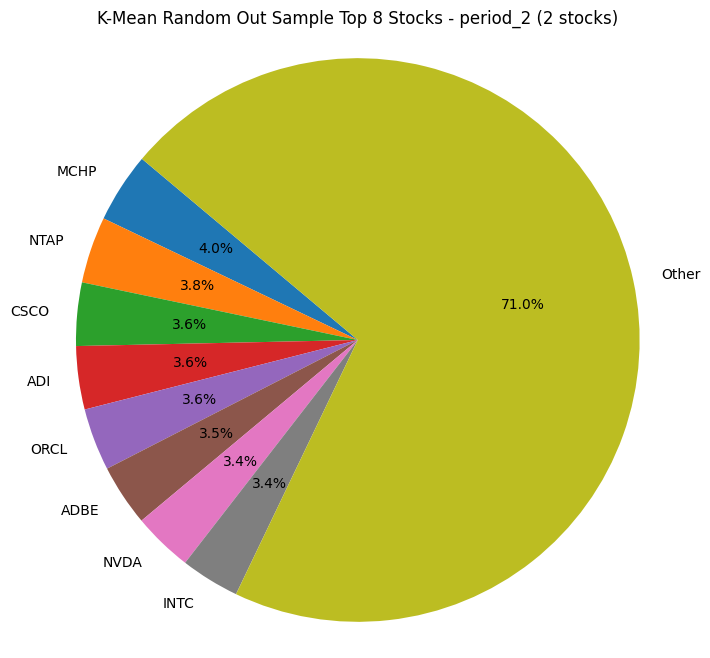

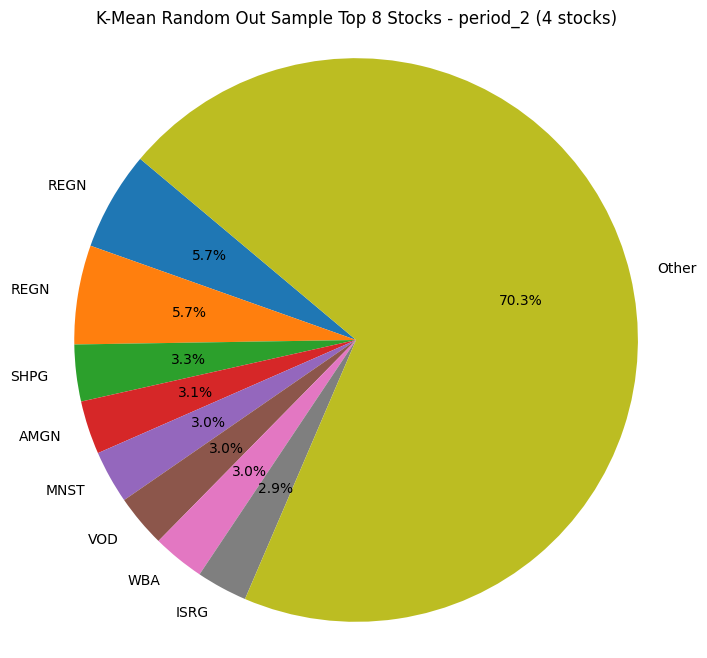

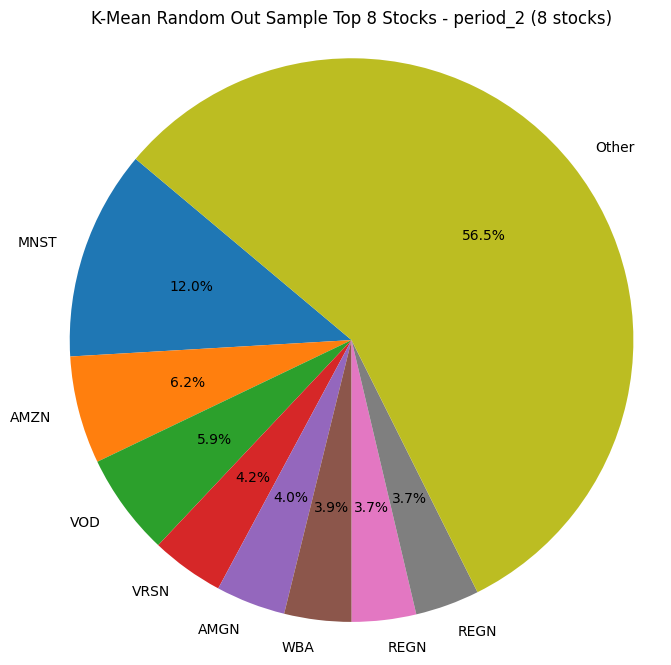

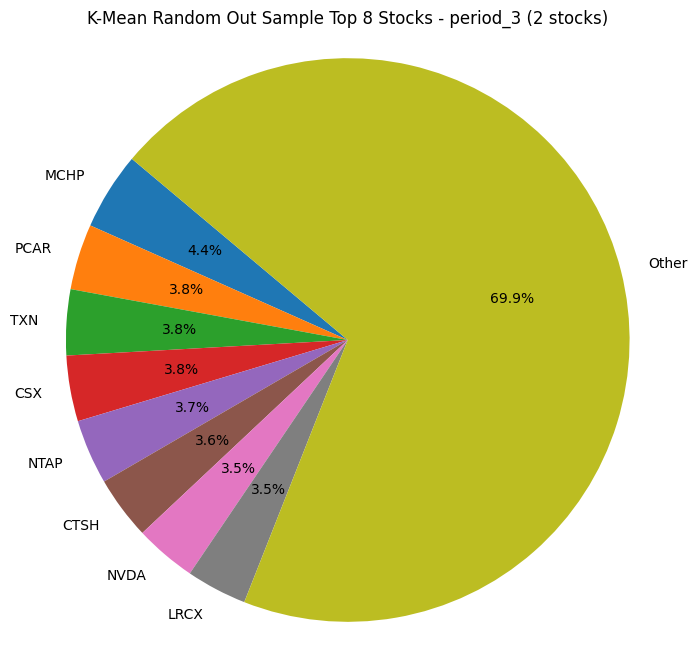

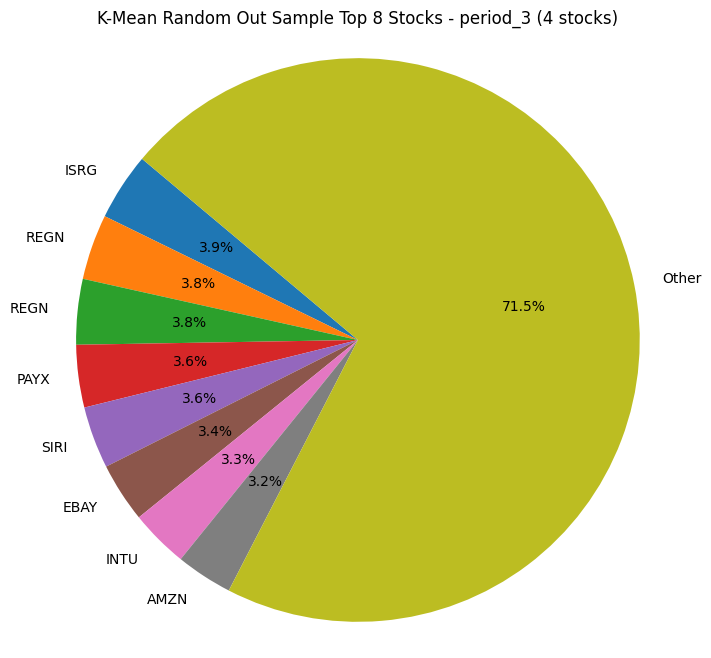

...

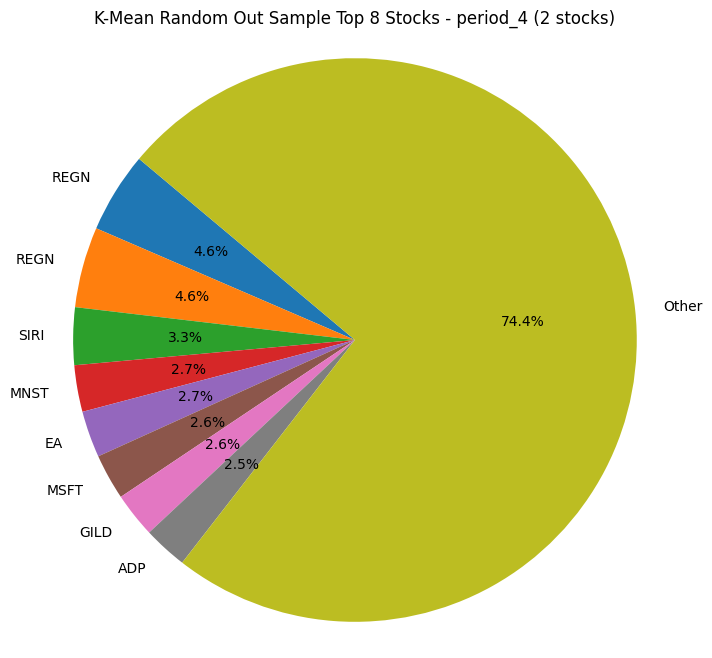

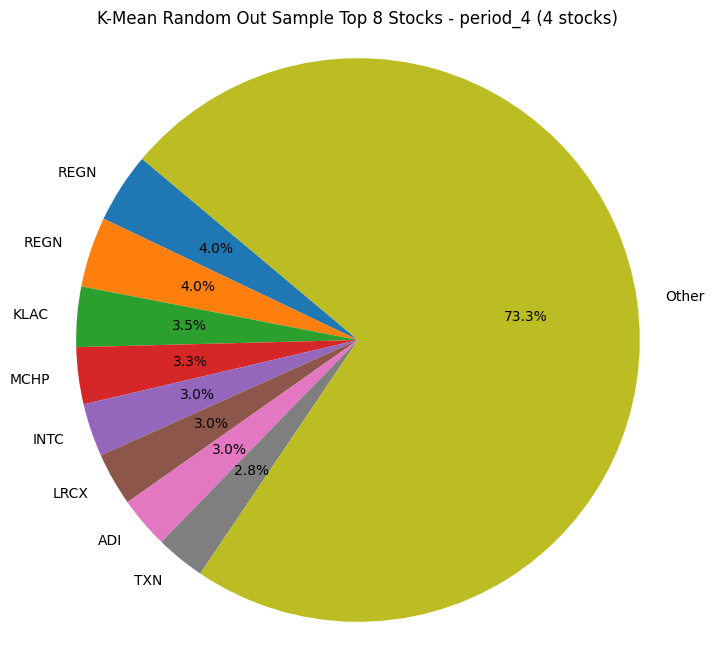

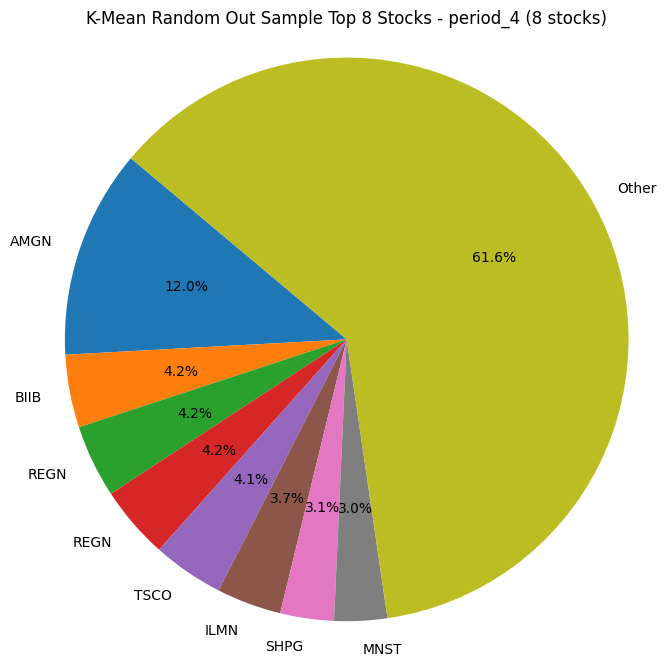

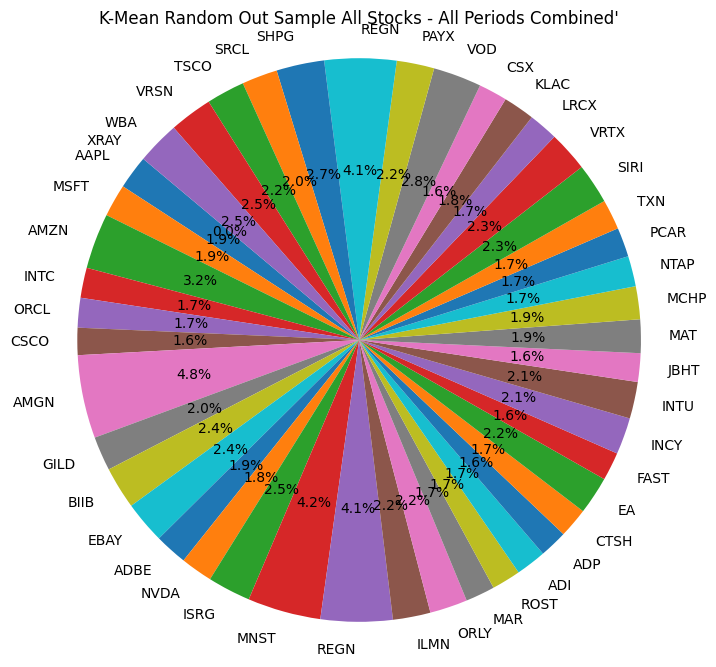

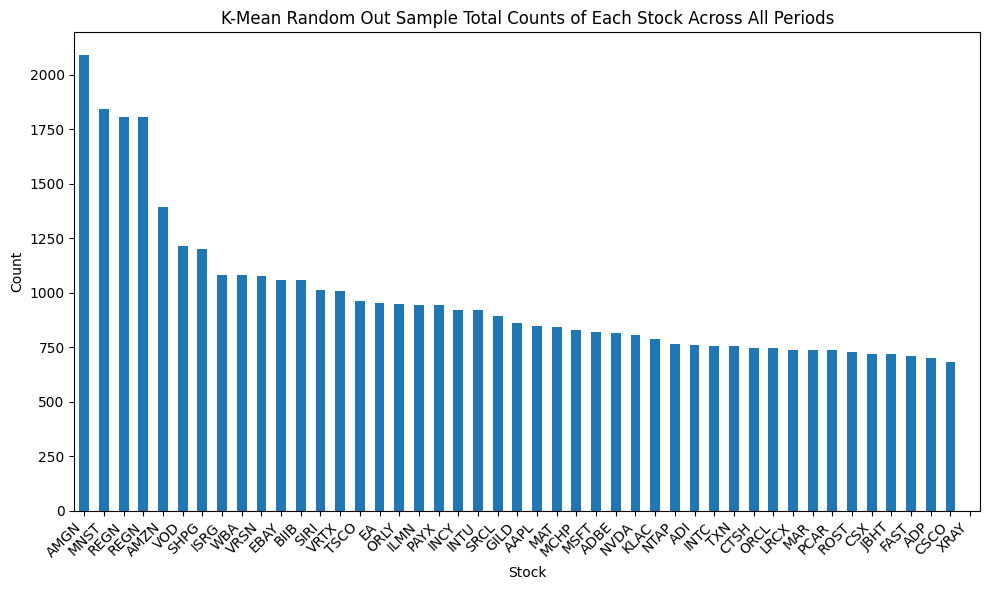

In [503]:
count_of_stocks(result_df_kmeans_rand_test1, custom_tickers, "K-Mean Random Out Sample")

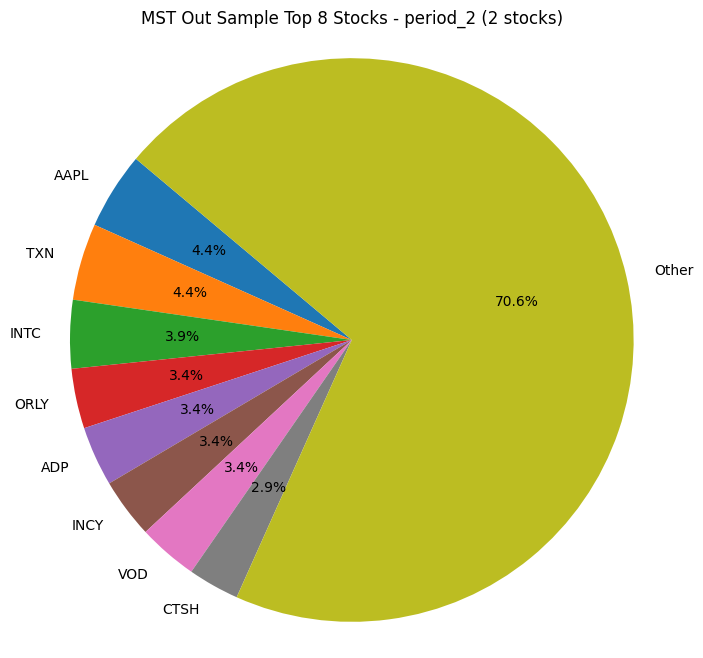

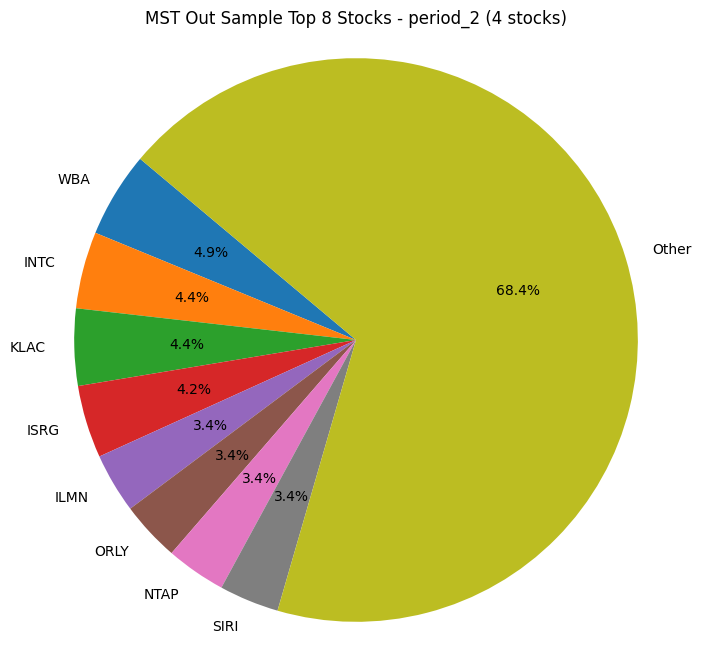

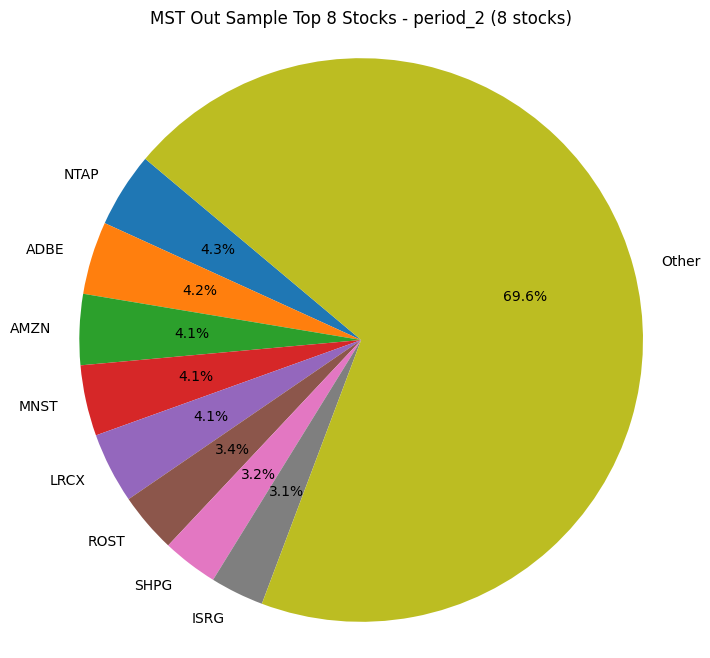

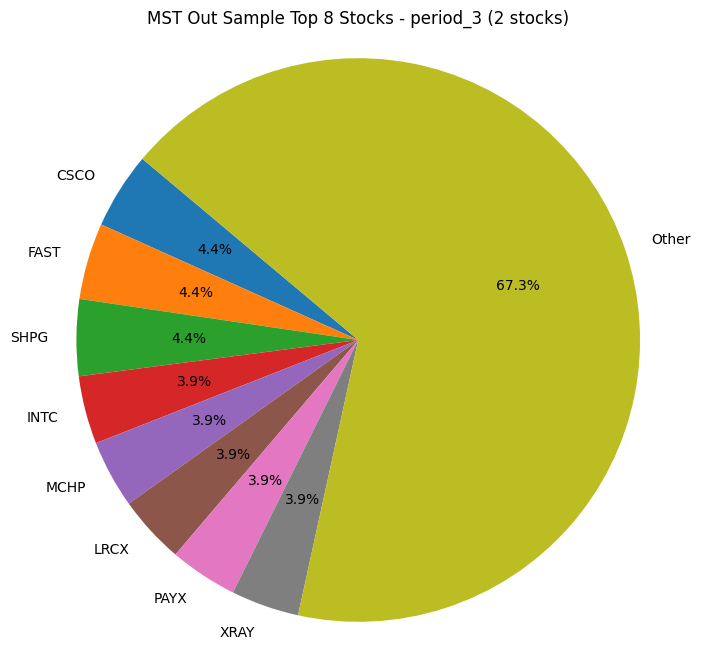

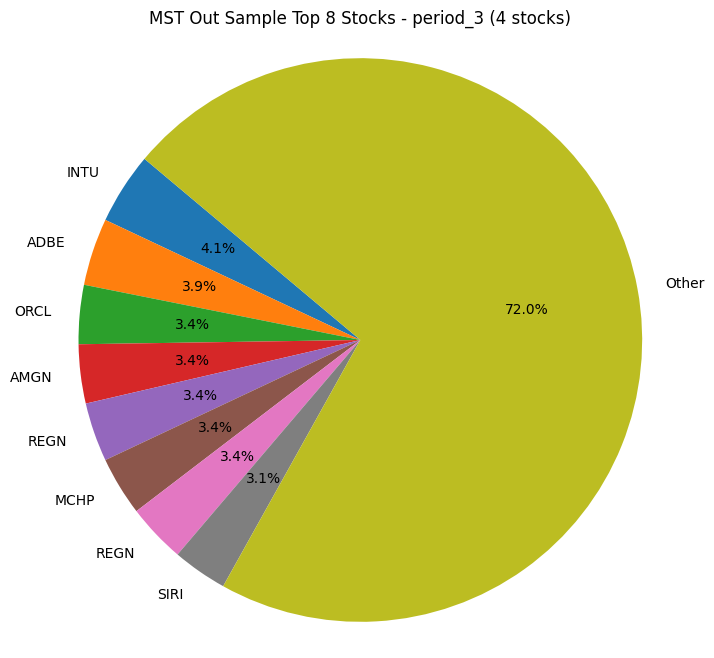

...

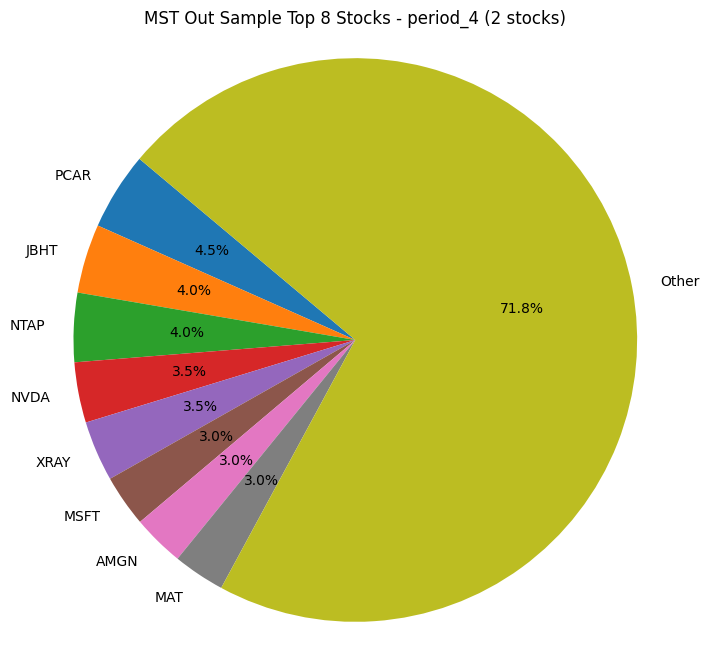

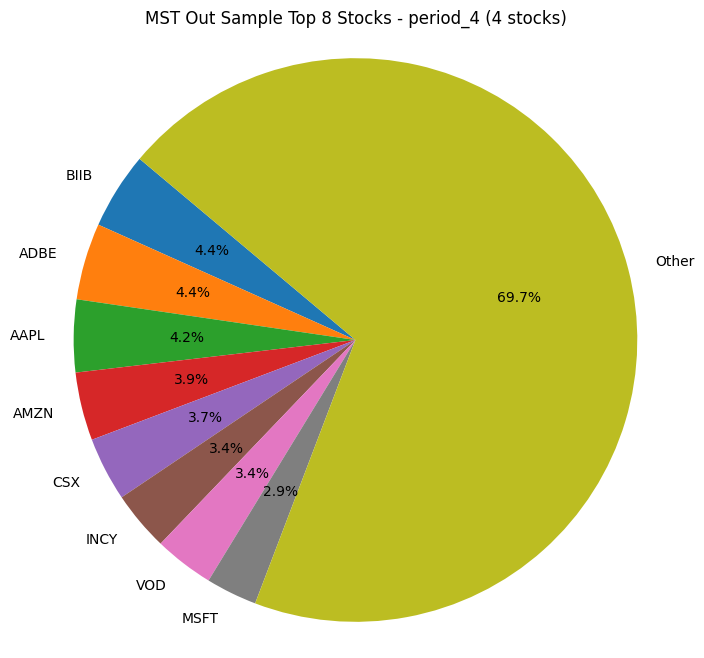

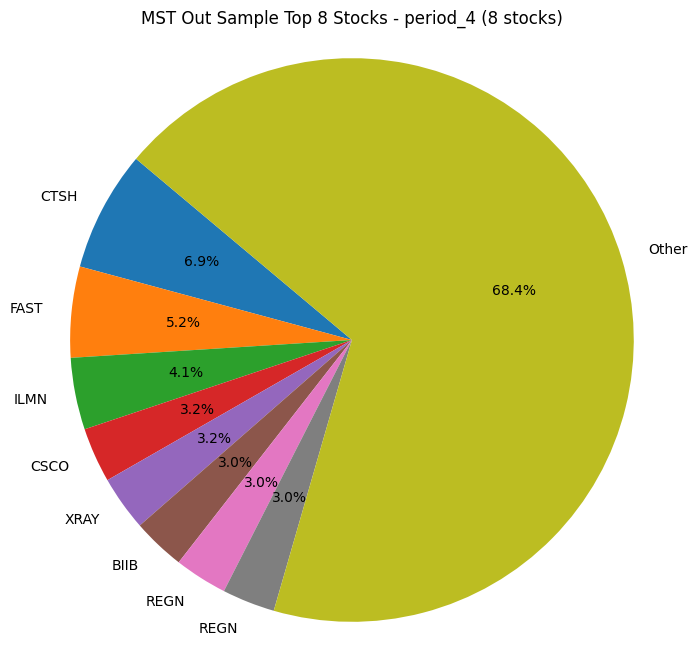

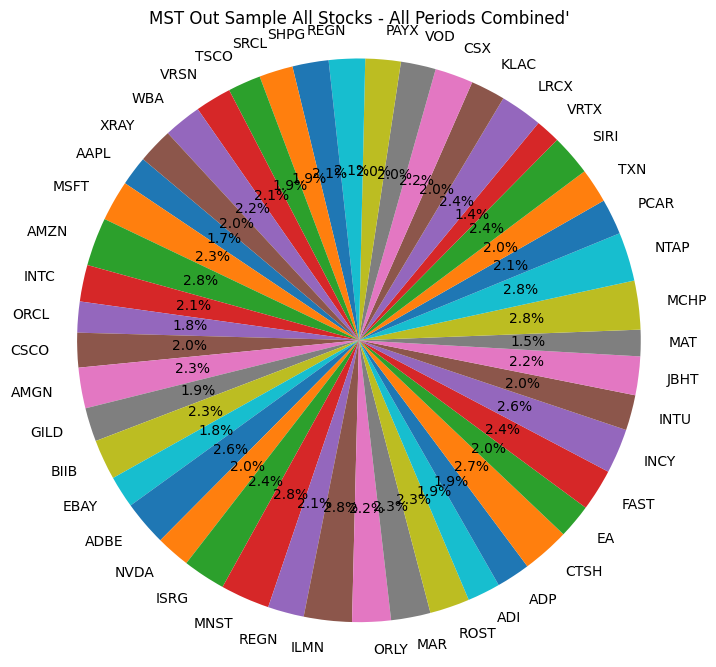

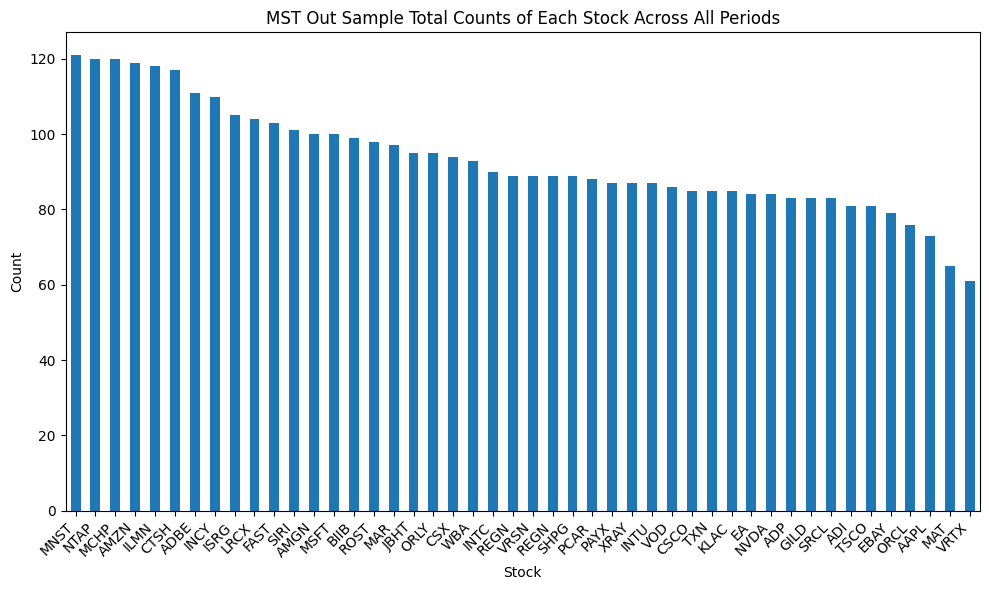

In [504]:
count_of_stocks(mst_result_df_clusters_out_sample, custom_tickers, "MST Out Sample")

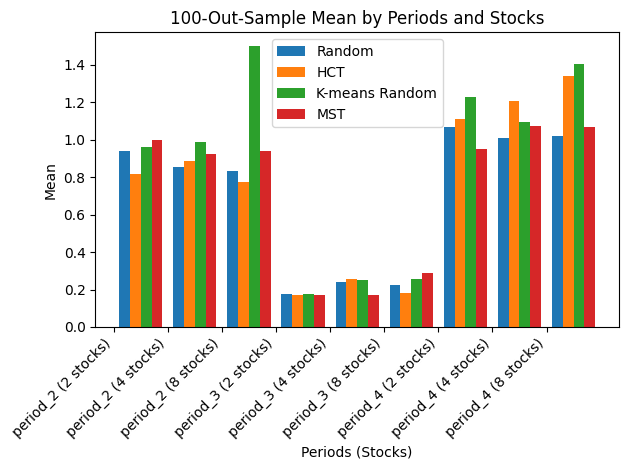

Total Average Mean of Random Values: 0.7077099190042146
Total Average Mean of Cluster Values: 0.7493989400064107
Total Average Mean of K-means Random Values: 0.8740367340230263
Total Average Mean of MST Values: 0.7319941283253295

Period 1 Average Mean of Random Values: 0.8767374933551156
Period 1 Average Mean of Cluster Values: 0.8262073063679137
Period 1 Average Mean of K-means Random Values: 1.1510221131441598
Period 1 Average Mean of MST: 0.9546887355121131
Period 2 Average Mean of Random Values: 0.2127884679869743
Period 2 Average Mean of Cluster Values: 0.20201892133980112
Period 2 Average Mean of K-means Random Values: 0.22853186276422996
Period 2 Average Mean of MST: 0.20977258374324562
Period 3 Average Mean of Random Values: 1.033603795670554
Period 3 Average Mean of Cluster Values: 1.2199705923115174
Period 3 Average Mean of K-means Random Values: 1.242556226160689
Period 3 Average Mean of MST: 1.0315210657206295
Period 4 Average Mean of Random Values: nan
Period 4 Average Me

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


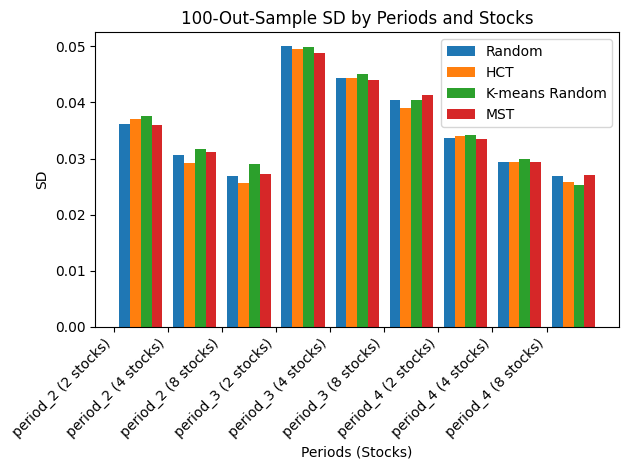

Total Average SD of Random Values: 0.03538820856966222
Total Average SD of Cluster Values: 0.0348871817972084
Total Average SD of K-means Random Values: 0.03591681754599494
Total Average SD of MST Values: 0.03540813304980676

Period 1 Average SD of Random Values: 0.031200159413661843
Period 1 Average SD of Cluster Values: 0.03064044173861699
Period 1 Average SD of K-means Random Values: 0.032783201864457885
Period 1 Average SD of MST: 0.031526149765943694
Period 2 Average SD of Random Values: 0.04496173271980166
Period 2 Average SD of Cluster Values: 0.04426946958326994
Period 2 Average SD of K-means Random Values: 0.0451304336598875
Period 2 Average SD of MST: 0.04469252463639536
Period 3 Average SD of Random Values: 0.030002733575523136
Period 3 Average SD of Cluster Values: 0.02975163406973827
Period 3 Average SD of K-means Random Values: 0.029836817113639433
Period 3 Average SD of MST: 0.03000572474708121
Period 4 Average SD of Random Values: nan
Period 4 Average SD of Cluster Valu

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


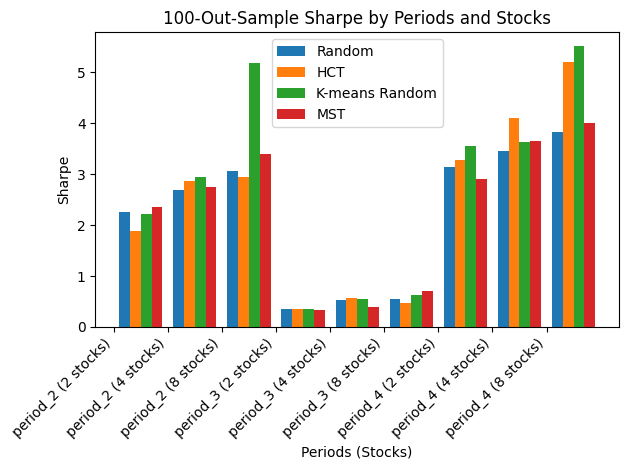

Total Average Sharpe of Random Values: 2.206325626946786
Total Average Sharpe of Cluster Values: 2.405845801792348
Total Average Sharpe of K-means Random Values: 2.729496663068762
Total Average Sharpe of MST Values: 2.275071005353783

Period 1 Average Sharpe of Random Values: 2.6700915667605316
Period 1 Average Sharpe of Cluster Values: 2.5611737201559017
Period 1 Average Sharpe of K-means Random Values: 3.4473299082847526
Period 1 Average Sharpe of MST: 2.834492889389363
Period 2 Average Sharpe of Random Values: 0.47733424411220216
Period 2 Average Sharpe of Cluster Values: 0.460645922013135
Period 2 Average Sharpe of K-means Random Values: 0.5108708753065093
Period 2 Average Sharpe of MST: 0.4697347419141214
Period 3 Average Sharpe of Random Values: 3.4715510699676244
Period 3 Average Sharpe of Cluster Values: 4.195717763208006
Period 3 Average Sharpe of K-means Random Values: 4.230289205615023
Period 3 Average Sharpe of MST: 3.520985384757863
Period 4 Average Sharpe of Random Values

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


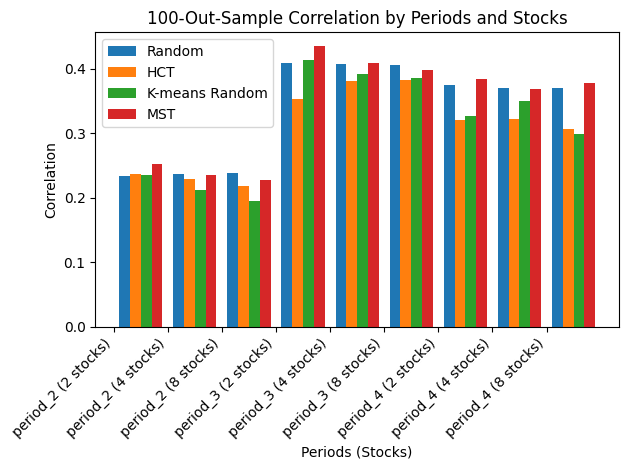

Total Average Correlation of Random Values: 0.33876270266485264
Total Average Correlation of Cluster Values: 0.30591735711341506
Total Average Correlation of K-means Random Values: 0.3123475445193743
Total Average Correlation of MST Values: 0.34345052654281616

Period 1 Average Correlation of Random Values: 0.23661124155715388
Period 1 Average Correlation of Cluster Values: 0.22850600898988072
Period 1 Average Correlation of K-means Random Values: 0.21435457350829476
Period 1 Average Correlation of MST: 0.23876984472690363
Period 2 Average Correlation of Random Values: 0.4079541914072921
Period 2 Average Correlation of Cluster Values: 0.3722229125683989
Period 2 Average Correlation of K-means Random Values: 0.39749230787399376
Period 2 Average Correlation of MST: 0.4142916975471754
Period 3 Average Correlation of Random Values: 0.3717226750301119
Period 3 Average Correlation of Cluster Values: 0.31702314978196544
Period 3 Average Correlation of K-means Random Values: 0.3251957521758344

/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/costanzasiniscalchi/miniconda3/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


,Experiment,Period 1 Random,Period 1 HCT,Period 1 K-means,Period 1 K-means Random,Period 1 MST,Period 2 Random,Period 2 HCT,Period 2 K-means,Period 2 K-means Random,...,Period 3 Random,Period 3 HCT,Period 3 K-means,Period 3 K-means Random,Period 3 MST,Period 4 Random,Period 4 HCT,Period 4 K-means,Period 4 K-means Random,Period 4 MST
0,100-Out-Sample Mean,0.876737,0.826207,1.096068,1.151022,0.954689,0.212788,0.202019,0.088899,0.228532,...,1.033604,1.219971,1.417514,1.242556,1.031521,NaN,NaN,NaN,NaN,NaN
0,100-Out-Sample SD,0.031200,0.030640,0.034852,0.032783,0.031526,0.044962,0.044269,0.045884,0.045130,...,0.030003,0.029752,0.032361,0.029837,0.030006,NaN,NaN,NaN,NaN,NaN
0,100-Out-Sample Sharpe,2.670092,2.561174,3.115560,3.447330,2.834493,0.477334,0.460646,0.189841,0.510871,...,3.471551,4.195718,4.463454,4.230289,3.520985,NaN,NaN,NaN,NaN,NaN
0,100-Out-Sample Correlation,0.236611,0.228506,0.229274,0.214355,0.238770,0.407954,0.372223,0.475883,0.397492,...,0.371723,0.317023,0.219879,0.325196,0.377290,NaN,NaN,NaN,NaN,NaN


In [505]:
# Plotting Mean
out_means = plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample, "mean_out_sample_100.png", "100-Out-Sample")

# Plotting SD
out_sd = plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample, "sd_out_sample_100.png", "100-Out-Sample")

# Plotting Sharpe
out_sharpe = plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample, "sharpe_out_sample_100.png", "100-Out-Sample")

# Plotting Correlation
out_corr = plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1, mst_result_df_clusters_out_sample, "corr_out_sample_100.png", "100-Out-Sample")

out_df = pd.DataFrame()
for d in [out_means, out_sd, out_sharpe, out_corr]:
    out_df = pd.concat([out_df,d])
first_column = out_df.pop('Experiment') 
  
# insert column using insert(position,column_name,first_column) function 
out_df.insert(0, 'Experiment', first_column) 
out_df

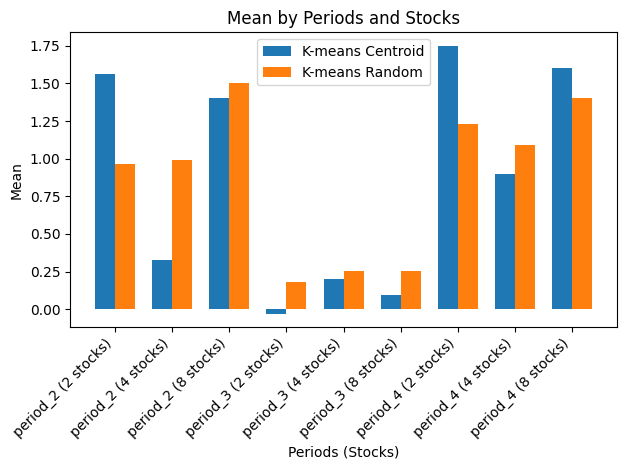

Total Average Mean of K-means Centroid Values: 0.8674936173626657
Total Average Mean of K-means Random Values: 0.8740367340230263

Period 1 Average Mean of K-means Centroid Values: 1.0960679618247207
Period 1 Average Mean of K-means Random Values: 1.1510221131441598
Period 2 Average Mean of K-means Centroid Values: 0.08889856369208426
Period 2 Average Mean of K-means Random Values: 0.22853186276422996
Period 3 Average Mean of K-means Centroid Values: 1.417514326571192
Period 3 Average Mean of K-means Random Values: 1.242556226160689


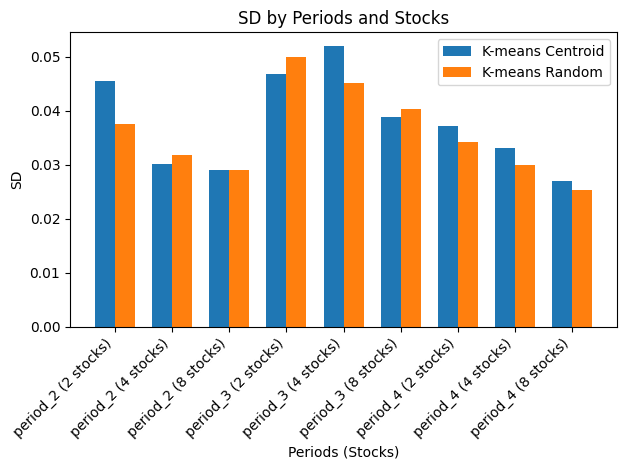

Total Average SD of K-means Centroid Values: 0.037699084769862265
Total Average SD of K-means Random Values: 0.03591681754599494

Period 1 Average SD of K-means Centroid Values: 0.03485208541271987
Period 1 Average SD of K-means Random Values: 0.032783201864457885
Period 2 Average SD of K-means Centroid Values: 0.04588390723559182
Period 2 Average SD of K-means Random Values: 0.0451304336598875
Period 3 Average SD of K-means Centroid Values: 0.03236126166127514
Period 3 Average SD of K-means Random Values: 0.029836817113639433


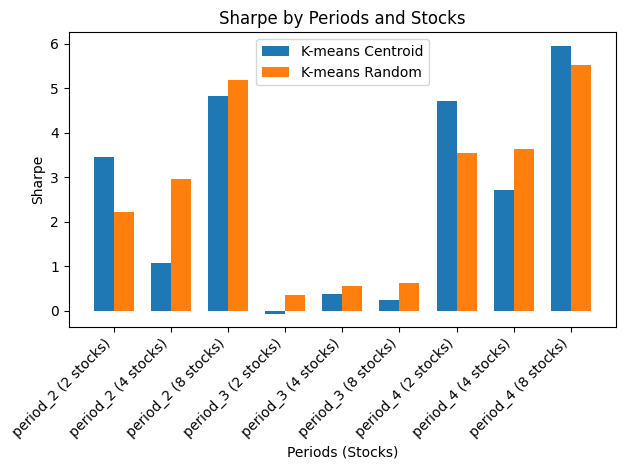

Total Average Sharpe of K-means Centroid Values: 2.5896181913910628
Total Average Sharpe of K-means Random Values: 2.729496663068762

Period 1 Average Sharpe of K-means Centroid Values: 3.1155597188530364
Period 1 Average Sharpe of K-means Random Values: 3.4473299082847526
Period 2 Average Sharpe of K-means Centroid Values: 0.1898407686806826
Period 2 Average Sharpe of K-means Random Values: 0.5108708753065093
Period 3 Average Sharpe of K-means Centroid Values: 4.463454086639469
Period 3 Average Sharpe of K-means Random Values: 4.230289205615023


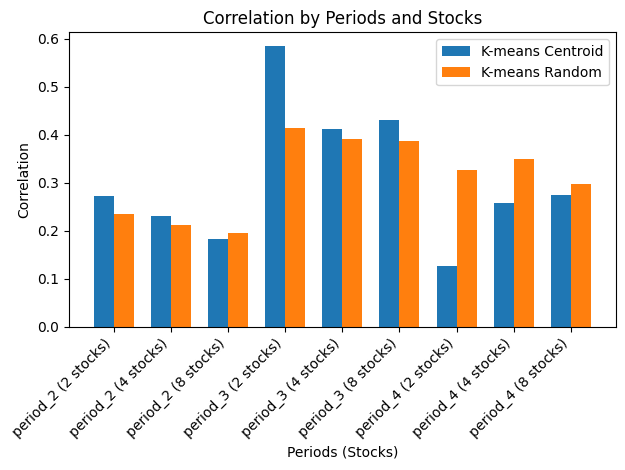

Total Average Correlation of K-means Centroid Values: 0.3083454356342601
Total Average Correlation of K-means Random Values: 0.3123475445193743

Period 1 Average Correlation of K-means Centroid Values: 0.22927401213474297
Period 1 Average Correlation of K-means Random Values: 0.21435457350829476
Period 2 Average Correlation of K-means Centroid Values: 0.4758831736907019
Period 2 Average Correlation of K-means Random Values: 0.39749230787399376
Period 3 Average Correlation of K-means Centroid Values: 0.21987912107733543
Period 3 Average Correlation of K-means Random Values: 0.3251957521758344


In [506]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)

In [507]:
df = pd.concat([in_df, out_df])
df

,Experiment,Period 1 Random,Period 1 HCT,Period 1 K-means,Period 1 K-means Random,Period 1 MST,Period 2 Random,Period 2 HCT,Period 2 K-means,Period 2 K-means Random,...,Period 3 Random,Period 3 HCT,Period 3 K-means,Period 3 K-means Random,Period 3 MST,Period 4 Random,Period 4 HCT,Period 4 K-means,Period 4 K-means Random,Period 4 MST
0,100-In-Sample Mean,0.765612,0.720830,0.922613,0.678389,0.769589,0.840146,0.913652,0.820877,0.722796,...,0.237105,0.204397,0.700255,0.220923,0.228173,1.018331,1.329305,1.410919,1.330258,1.035415
0,100-In-Sample SD,0.051723,0.050445,0.058394,0.050559,0.052016,0.031125,0.030616,0.028278,0.031631,...,0.044343,0.044823,0.049844,0.043826,0.044787,0.030426,0.030363,0.029615,0.030807,0.029962
0,100-In-Sample Sharpe,1.623857,1.525921,1.961089,1.521890,1.592520,2.640707,2.719147,2.754440,2.272522,...,0.518863,0.451248,1.400203,0.510745,0.519464,3.398514,4.388262,4.824779,4.379710,3.511944
0,100-In-Sample Correlation,0.348335,0.302607,0.267788,0.322464,0.274403,0.277162,0.140832,0.321034,0.178663,...,0.437263,0.248731,0.405308,0.390290,0.407107,0.297519,0.364431,0.333985,0.294803,0.366015
0,100-Out-Sample Mean,0.876737,0.826207,1.096068,1.151022,0.954689,0.212788,0.202019,0.088899,0.228532,...,1.033604,1.219971,1.417514,1.242556,1.031521,NaN,NaN,NaN,NaN,NaN
0,100-Out-Sample SD,0.031200,0.030640,0.034852,0.032783,0.031526,0.044962,0.044269,0.045884,0.045130,...,0.030003,0.029752,0.032361,0.029837,0.030006,NaN,NaN,NaN,NaN,NaN
0,100-Out-Sample Sharpe,2.670092,2.561174,3.115560,3.447330,2.834493,0.477334,0.460646,0.189841,0.510871,...,3.471551,4.195718,4.463454,4.230289,3.520985,NaN,NaN,NaN,NaN,NaN
0,100-Out-Sample Correlation,0.236611,0.228506,0.229274,0.214355,0.238770,0.407954,0.372223,0.475883,0.397492,...,0.371723,0.317023,0.219879,0.325196,0.377290,NaN,NaN,NaN,NaN,NaN


In [508]:
print(df.to_latex())

\begin{tabular}{llrrrrrrrrrrrrrrrrrrrr}
\toprule
 & Experiment & Period 1 Random & Period 1 HCT & Period 1 K-means & Period 1 K-means Random & Period 1 MST & Period 2 Random & Period 2 HCT & Period 2 K-means & Period 2 K-means Random & Period 2 MST & Period 3 Random & Period 3 HCT & Period 3 K-means & Period 3 K-means Random & Period 3 MST & Period 4 Random & Period 4 HCT & Period 4 K-means & Period 4 K-means Random & Period 4 MST \\
\midrule
0 & 100-In-Sample Mean & 0.765612 & 0.720830 & 0.922613 & 0.678389 & 0.769589 & 0.840146 & 0.913652 & 0.820877 & 0.722796 & 1.070571 & 0.237105 & 0.204397 & 0.700255 & 0.220923 & 0.228173 & 1.018331 & 1.329305 & 1.410919 & 1.330258 & 1.035415 \\
0 & 100-In-Sample SD & 0.051723 & 0.050445 & 0.058394 & 0.050559 & 0.052016 & 0.031125 & 0.030616 & 0.028278 & 0.031631 & 0.032050 & 0.044343 & 0.044823 & 0.049844 & 0.043826 & 0.044787 & 0.030426 & 0.030363 & 0.029615 & 0.030807 & 0.029962 \\
0 & 100-In-Sample Sharpe & 1.623857 & 1.525921 & 1.961089 & 1.5